In [7]:
library(Seurat)
library(ggplot2)
library(viridis)
library(UCell)
library(ComplexHeatmap)
library(ggrepel)
library(dplyr)
library(stringr)
library(harmony)
library(ggpubr)
library(patchwork)
library(ggsci)
library(scales)
library(ggbreak) 
library(EnhancedVolcano)
library(survival)
library(survminer)
library(CytoTRACE)
library(limma)
library(edgeR)
library(reshape2)
library(rstatix)
library(CellChat)
library(circlize)
library(GSVA)
library(GSEABase)
library(GSVAdata)
library(org.Hs.eg.db)

# Fig 1

## Fig 1b

Warning message:
“This manual palette can handle a maximum of 10 values. You have supplied 12.”


[1] "#E64B35D8" "#4DBBD5D8" "#00A087D8" "#3C5488D8" "#F39B7FD8" "#8491B4D8"
 [7] "#91D1C2D8" "#DC0000D8" "#7E6148D8" "#B09C85D8" NA          NA

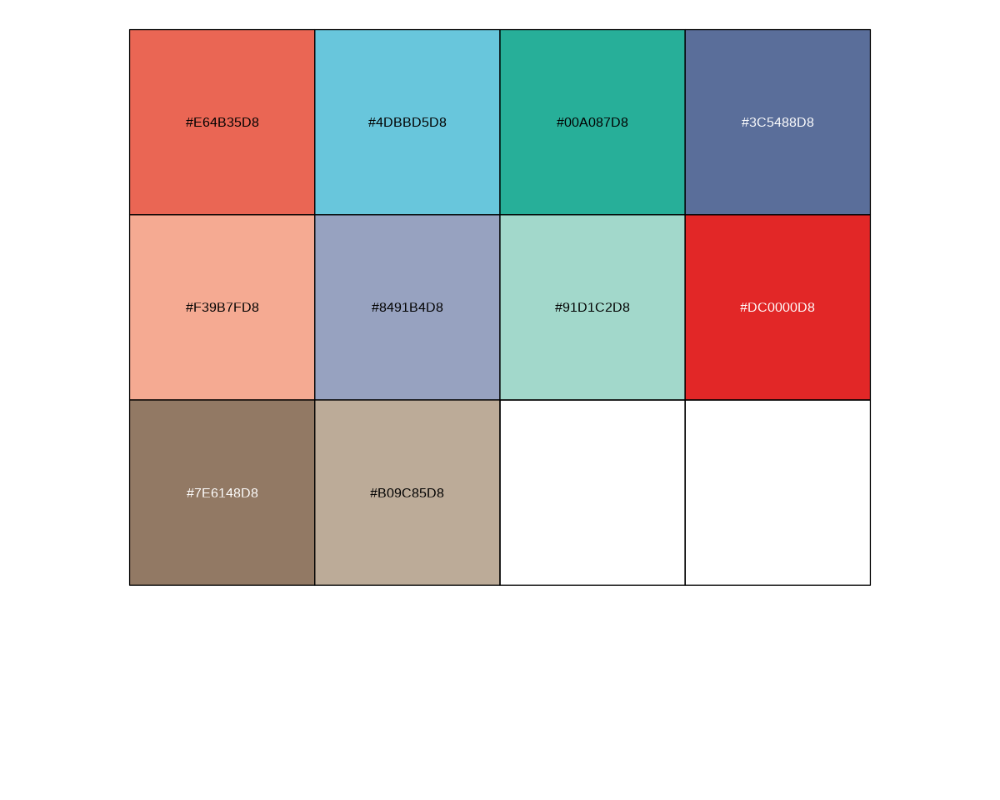

In [223]:
mypal <- pal_npg("nrc", alpha = 0.85)(12)
mypal
#> [1] "#E64B35B2" "#4DBBD5B2" "#00A087B2" "#3C5488B2" "#F39B7FB2" "#8491B4B2"
#> [7] "#91D1C2B2" "#DC0000B2" "#7E6148B2"

show_col(mypal)

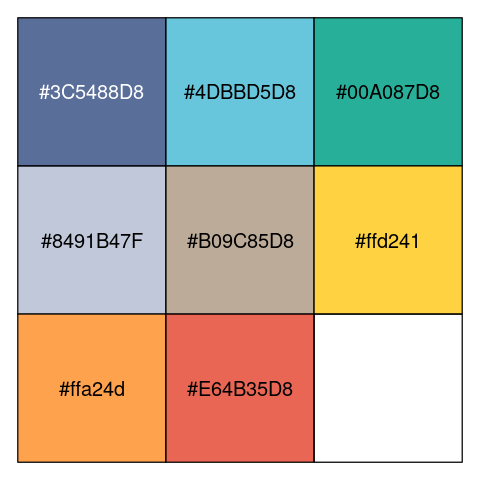

In [33]:
mypal = c('#3C5488D8','#4DBBD5D8','#00A087D8','#8491B47F', '#B09C85D8','#ffd241','#ffa24d','#E64B35D8')
names(mypal) = c('Plasma','B','Normal Epithelial','Fib/Endo','Mono/Macro','T','Mast','Malignant')
show_col(mypal)

In [103]:
h5_obj_SCT_harmony = readRDS('./all_sample_SCT_harmony.rds')

h5_obj_SCT_harmony@meta.data$assign.level1[h5_obj_SCT_harmony@meta.data$assign.level2 %in% c('Mal_AEGJ_like','Mal_EAC_like','Mal_GC_like')] = 'Malignant'
h5_obj_SCT_harmony@meta.data$assign.level1[h5_obj_SCT_harmony@meta.data$assign.level1 == 'Epithelial'] = 'Normal Epithelial'
h5_obj_SCT_harmony@meta.data$assign.level1 = factor(h5_obj_SCT_harmony@meta.data$assign.level1, levels=c('T','B','Plasma','Mono/Macro','Mast','Normal Epithelial','Malignant','Fib/Endo'))


In [235]:
pdf(file = './Fig_pdf/Fig1b.pdf', width=10, height=8)
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(h5_obj_SCT_harmony, label = F, pt.size=3, group.by='assign.level1',
        cols=mypal,
        # label.size=8,
        raster=T,
        raster.dpi=c(2048,2048)
       ) +
xlab('UMAP-1') + ylab('UMAP-2')+
theme(text=element_text(size=12),
      axis.text=element_text(size=0),
      axis.title=element_text(size=14),
      axis.ticks = element_blank(),
    legend.text=element_text(size=20))
dev.off()

png 
  2

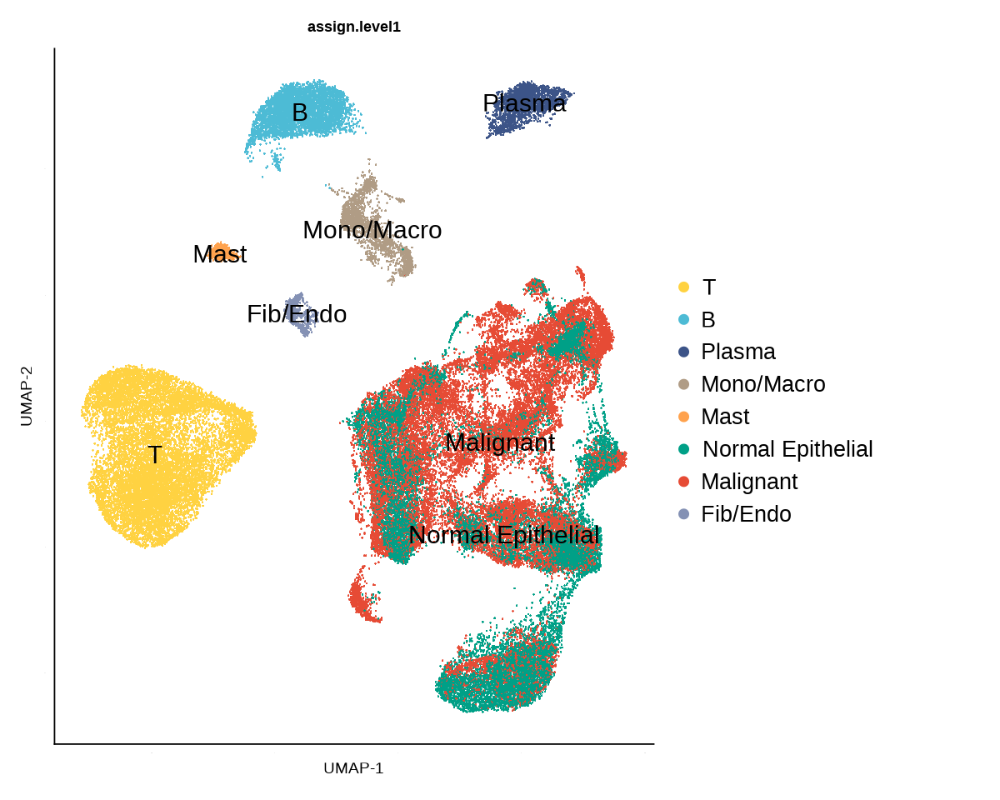

In [233]:
# h5_obj_SCT_harmony@meta.data$assign.level1 = factor(h5_obj_SCT_harmony@meta.data$assign.level1, levels=c('T','B','Plasma','Mono/Macro','Mast','Normal Epithelial','Malignant','Fib/Endo'))
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(h5_obj_SCT_harmony, label = T, pt.size=3, group.by='assign.level1',
        cols=mypal,
        label.size=8,
        raster=T,
        raster.dpi=c(2048,2048)
       ) +
xlab('UMAP-1') + ylab('UMAP-2')+
theme(text=element_text(size=12),
      axis.text=element_text(size=0),
      axis.title=element_text(size=14),
      axis.ticks = element_blank(),
    legend.text=element_text(size=20))


In [44]:
library(showtext)
font_add(family = "Arial",
         regular = "/mnt//Mercury//home//liuzhaoyang//font/Arial.ttf",
         bold='/mnt//Mercury//home//liuzhaoyang//font/Arial-Bold.ttf') ## here is the path to the font to add.
showtext_auto()


In [80]:
table(h5_obj_SCT_harmony@meta.data$assign.level1)


                B          Fib/Endo         Malignant              Mast 
             4274               597             22229               451 
       Mono/Macro Normal Epithelial            Plasma                 T 
             2039             16273              2091             12893 

In [197]:
dim(h5_obj_SCT_harmony)

[1] 28703 60847

## Fig1c

In [243]:
pdf(file = './Fig_pdf/Fig1c.pdf', width=16, height=8)
par(family = 'Arial')
options(repr.plot.width=16, repr.plot.height=8)
p <- FeaturePlot(h5_obj_SCT_harmony, features = c('CD3D','CD79A','IGKC','CD68',
                                     'KIT','EPCAM','COL1A2','PECAM1'), slot='data',
                 pt.size=3, 
            raster=T,
                 # raster.dpi=c(2048,2048),
                 order=T, ncol=4,
            min.cutoff='q1', combine=F
           )
p <- lapply(X = p, FUN = function(x) x + xlab('UMAP-1') + ylab('UMAP-2') + 
            theme(plot.title = element_text(size = 24, face = 'bold'),
                  axis.text=element_blank(),
                  axis.ticks = element_blank(),
                  axis.title=element_text(size=18),
                  legend.text=element_text(size=16)
                                              ))
p <- wrap_plots(plots = p, ncol=4)
p
dev.off()

png 
  2

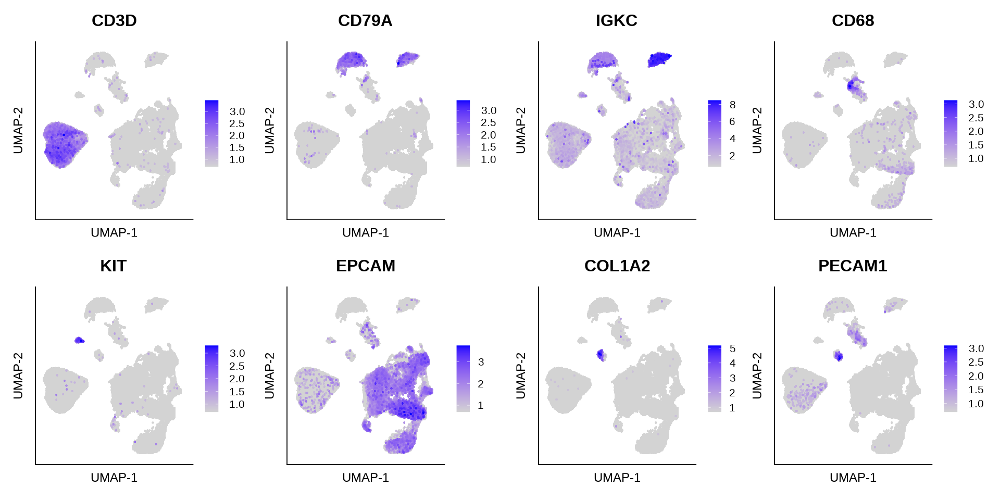

In [244]:
p

## Fig1d

pdf 
  3

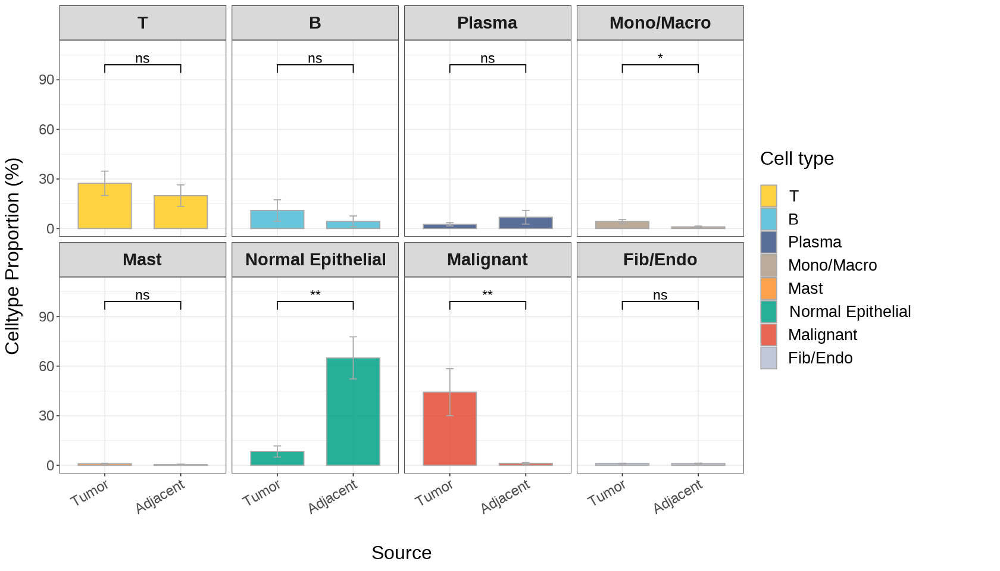

In [249]:
# codes for generate such plot_df
h5_obj_SCT_harmony@meta.data$Source = gsub(1,'tumor',h5_obj_SCT_harmony@meta.data$Source)
h5_obj_SCT_harmony@meta.data$Source = gsub(2,'adjacent',h5_obj_SCT_harmony@meta.data$Source)

h5_obj_SCT_harmony@meta.data$Source = gsub('tumor','Tumor',h5_obj_SCT_harmony@meta.data$Source)
h5_obj_SCT_harmony@meta.data$Source = gsub('adjacent','Adjacent',h5_obj_SCT_harmony@meta.data$Source)

ct_sample_count_df = h5_obj_SCT_harmony@meta.data[,c('Source','assign.level1','Sample','Patient')] %>%
                        group_by(Source) %>% count(Sample,assign.level1)
colnames(ct_sample_count_df) = c('Source','Sample','Cell type','n')

sample_count_df = h5_obj_SCT_harmony@meta.data[,c('Sample','Source')] %>% count(Sample)
colnames(sample_count_df) = c('Sample','Sample_freq')

plot_df = merge(ct_sample_count_df, sample_count_df)
plot_df$Celltype_Proportion = plot_df$n/plot_df$Sample_freq*100
# plot_df#
# codes for generate such plot_df

# pdf(file = './Fig_pdf/Fig1c.pdf', width=14, height=8, dpi=500)
par(family = 'Arial')

options(repr.plot.width=14, repr.plot.height=8)
p <- ggbarplot(plot_df, x = "Source", y = "Celltype_Proportion",color= "darkgrey",
          position = position_dodge(0.8), palette=mypal, fill='Cell type', add = "mean_se") +
  theme_bw() + 
  theme(legend.text = element_text(size = 20), 
       legend.title = element_text(size = 24), 
       axis.text.x=element_text(size=18,angle=30,hjust=1),
       axis.text.y=element_text(size=18),
       axis.title=element_text(size=24)) +
  facet_wrap(~`Cell type`,  ncol=4)  + 
  theme(strip.text.x = element_text(size = 22,face="bold")) +
  ylab('Celltype Proportion (%)') +
  # scale_x_discrete(limits=c("chemo", "no_treatment")) +
  stat_compare_means(comparisons = list(c('Tumor','Adjacent')),
                   label = 'p.signif',
                   label.x=1.5,
                   step.increase=0.1, bracket.size=0.5,
                     size=6, tip.length=0.05,hide.ns = F) + 
scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))
print(p)
ggsave('./Fig_pdf/Fig1d.pdf', width=14, height=8, dpi=500, bg='transparent')
dev.off()


## Fig1e

In [180]:
# mypal <- pal_npg("nrc")(8)

# names(mypal) = c('T','B','Plasma','Mono/Macro','Mast','Normal Epithelial','Malignant','Fib/Endo')

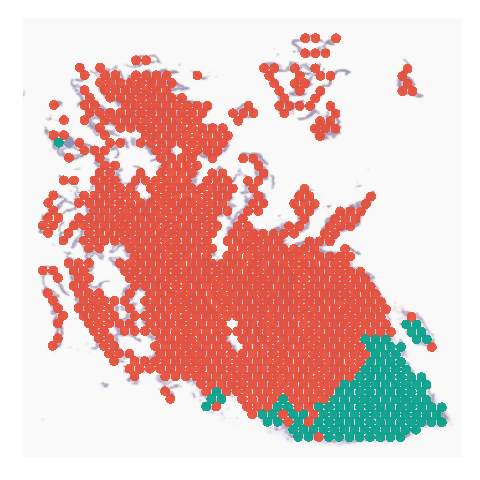

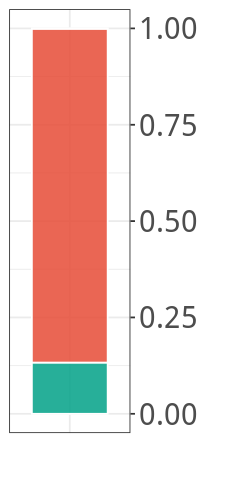

In [35]:
tmp_obj = readRDS('./ST/735350_3/735350_3_res.rds')
celltype_frac_df = read.table(file.path('./ST/735350_3/STRIDE//assign_level3/STRIDE_spot_celltype_frac.txt'), sep='\t', check.names = F, row.names = 1, header = T)
all_sample_meta = read.delim('./all_sample_meta.tsv', sep='\t', row.names=1, check.names=F)

# annotation by max cell type proportion
celltype_frac_df = celltype_frac_df[rownames(tmp_obj@meta.data),]
tmp_obj@meta.data$assign.max = colnames(celltype_frac_df)[apply(celltype_frac_df, FUN=which.max, 1)]
for (tmp_c in levels(as.factor(tmp_obj@meta.data$assign.max))){
    if (tmp_c %in% c('Mal_AGEJ_like','Mal_EAC_like','Mal_GC_like')){
        tmp_obj@meta.data$assign.max[tmp_obj@meta.data$assign.max == tmp_c] = 'Malignant'
    } else {
        tmp_obj@meta.data$assign.max[tmp_obj@meta.data$assign.max == tmp_c] = unique(all_sample_meta[all_sample_meta$assign.level3 == tmp_c, 'assign.level1'])
    }
    
}
tmp_obj@meta.data$assign.max[tmp_obj@meta.data$assign.max == 'Epithelial'] = 'Normal Epithelial'
tmp_obj@meta.data$assign.max = factor(tmp_obj@meta.data$assign.max, levels=c('T','B','Plasma','Mono/Macro','Mast','Normal Epithelial','Malignant','Fib/Endo'))

options(repr.plot.width=4, repr.plot.height=4)
SpatialDimPlot(tmp_obj, group.by = 'assign.max',
               cols=mypal,
               stroke=NA,
               pt.size.factor=2.3, label = F,  label.size=8, alpha=c(0.9,1), image.alpha = 0.5) +
theme(legend.position = "none")
ggsave('./Fig_pdf/Fig1e_st1.pdf', width=4, height=4, dpi=500, bg='transparent')
ggsave('./Fig_pdf/Fig1e_st1.png', width=4, height=4, dpi=500, bg='transparent')


tmp_obj@meta.data$Sample = 'ST_P2_Adj'
plot_df = tmp_obj@meta.data[,c('Sample','assign.max')] %>% group_by(assign.max) %>% count(Sample)

options(repr.plot.width=2, repr.plot.height=4)
plot_df$assign.max = factor(plot_df$assign.max, levels=c('T','B','Plasma','Mono/Macro','Mast','Normal Epithelial','Malignant','Fib/Endo'))
ggplot(plot_df, aes(fill=assign.max, y=n, x=Sample)) + 
  geom_bar(position="fill", fill=mypal[as.character(plot_df$assign.max)], stat="identity", color='white', width=0.75) + 
  theme_bw() + theme(legend.position = "none",
                          axis.text=element_text(size=18),
                     axis.text.x = element_blank(),
                     axis.ticks.x = element_blank(),
                          axis.title=element_text(size=18)) +
  ylab('') + xlab('') + scale_y_continuous(position = "right")
ggsave('./Fig_pdf/Fig1e_st1_bar.pdf', width=2, height=4, dpi=500, bg='transparent', family='sans')


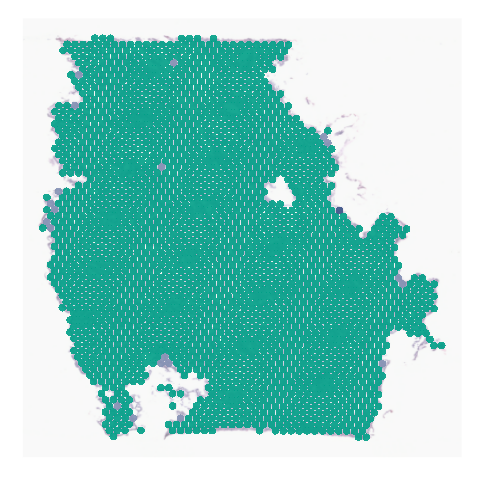

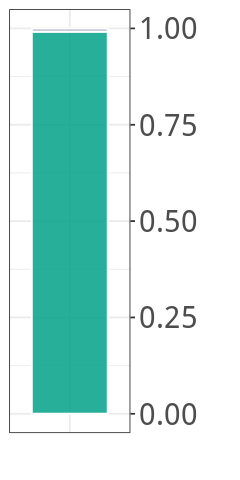

In [40]:
tmp_obj = readRDS('./ST/735350_4/735350_4_res.rds')
celltype_frac_df = read.table(file.path('./ST/735350_4/STRIDE//assign_level3/STRIDE_spot_celltype_frac.txt'), sep='\t', check.names = F, row.names = 1, header = T)
all_sample_meta = read.delim('./all_sample_meta.tsv', sep='\t', row.names=1, check.names=F)

# annotation by max cell type proportion
celltype_frac_df = celltype_frac_df[rownames(tmp_obj@meta.data),]
tmp_obj@meta.data$assign.max = colnames(celltype_frac_df)[apply(celltype_frac_df, FUN=which.max, 1)]
for (tmp_c in levels(as.factor(tmp_obj@meta.data$assign.max))){
    if (tmp_c %in% c('Mal_AGEJ_like','Mal_EAC_like','Mal_GC_like')){
        tmp_obj@meta.data$assign.max[tmp_obj@meta.data$assign.max == tmp_c] = 'Malignant'
    } else {
        tmp_obj@meta.data$assign.max[tmp_obj@meta.data$assign.max == tmp_c] = unique(all_sample_meta[all_sample_meta$assign.level3 == tmp_c, 'assign.level1'])
    }
    
}
tmp_obj@meta.data$assign.max[tmp_obj@meta.data$assign.max == 'Epithelial'] = 'Normal Epithelial'
tmp_obj@meta.data$assign.max = factor(tmp_obj@meta.data$assign.max, levels=c('T','B','Plasma','Mono/Macro','Mast','Normal Epithelial','Malignant','Fib/Endo'))

options(repr.plot.width=4, repr.plot.height=4)
SpatialDimPlot(tmp_obj, group.by = 'assign.max',
               cols=mypal,
               stroke=NA,
               pt.size.factor=1.8,
               label = F,  label.size=8, alpha=c(0.9,1), image.alpha = 0.5) +
theme(legend.position = "none")
ggsave('./Fig_pdf/Fig1e_st2.pdf', width=4, height=4, dpi=500, bg='transparent')


tmp_obj@meta.data$Sample = 'ST_P2_Adj'
plot_df = tmp_obj@meta.data[,c('Sample','assign.max')] %>% group_by(assign.max) %>% count(Sample)

options(repr.plot.width=2, repr.plot.height=4)
plot_df$assign.max = factor(plot_df$assign.max, levels=c('T','B','Plasma','Mono/Macro','Mast','Normal Epithelial','Malignant','Fib/Endo'))
ggplot(plot_df, aes(fill=assign.max, y=n, x=Sample)) + 
  geom_bar(position="fill", fill=mypal[as.character(plot_df$assign.max)], stat="identity", color='white', width=0.75) + 
  theme_bw() + theme(legend.position = "none",
                          axis.text=element_text(size=18),
                     axis.text.x = element_blank(),
                     axis.ticks.x = element_blank(),
                          axis.title=element_text(size=18)) +
  ylab('') + xlab('') + scale_y_continuous(position = "right")
ggsave('./Fig_pdf/Fig1e_st2_bar.pdf', width=2, height=4, dpi=500, bg='transparent', family='sans')


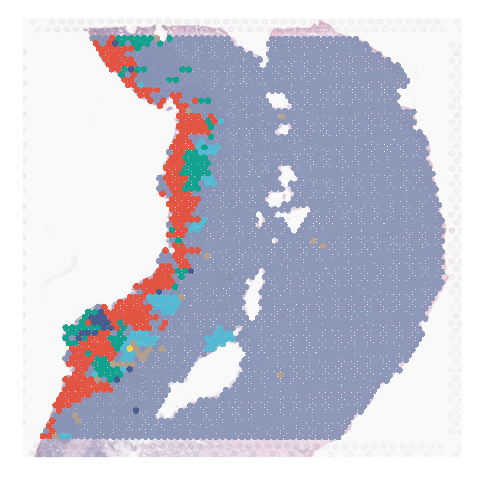

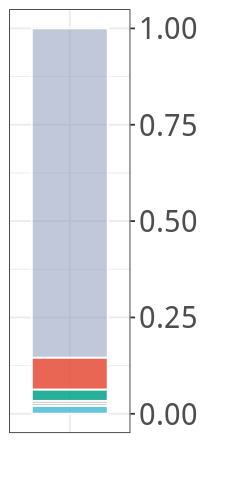

In [41]:
tmp_obj = readRDS('./ST/736083_3/736083_3_res.rds')
celltype_frac_df = read.table(file.path('./ST/736083_3/STRIDE//assign_level3/STRIDE_spot_celltype_frac.txt'), sep='\t', check.names = F, row.names = 1, header = T)
all_sample_meta = read.delim('./all_sample_meta.tsv', sep='\t', row.names=1, check.names=F)

# annotation by max cell type proportion
celltype_frac_df = celltype_frac_df[rownames(tmp_obj@meta.data),]
tmp_obj@meta.data$assign.max = colnames(celltype_frac_df)[apply(celltype_frac_df, FUN=which.max, 1)]
for (tmp_c in levels(as.factor(tmp_obj@meta.data$assign.max))){
    if (tmp_c %in% c('Mal_AGEJ_like','Mal_EAC_like','Mal_GC_like')){
        tmp_obj@meta.data$assign.max[tmp_obj@meta.data$assign.max == tmp_c] = 'Malignant'
    } else {
        tmp_obj@meta.data$assign.max[tmp_obj@meta.data$assign.max == tmp_c] = unique(all_sample_meta[all_sample_meta$assign.level3 == tmp_c, 'assign.level1'])
    }
    
}
tmp_obj@meta.data$assign.max[tmp_obj@meta.data$assign.max == 'Epithelial'] = 'Normal Epithelial'
tmp_obj@meta.data$assign.max = factor(tmp_obj@meta.data$assign.max, levels=c('T','B','Plasma','Mono/Macro','Mast','Normal Epithelial','Malignant','Fib/Endo'))

options(repr.plot.width=4, repr.plot.height=4)
SpatialDimPlot(tmp_obj, group.by = 'assign.max',
               cols=mypal,
               stroke=NA,
               label = F,  label.size=8, alpha=c(0.9,1), image.alpha = 0.5) +
theme(legend.position = "none")
ggsave('./Fig_pdf/Fig1e_st3.pdf', width=4, height=4, dpi=500, bg='transparent')


tmp_obj@meta.data$Sample = 'ST_P2_Adj'
plot_df = tmp_obj@meta.data[,c('Sample','assign.max')] %>% group_by(assign.max) %>% count(Sample)

options(repr.plot.width=2, repr.plot.height=4)
plot_df$assign.max = factor(plot_df$assign.max, levels=c('T','B','Plasma','Mono/Macro','Mast','Normal Epithelial','Malignant','Fib/Endo'))
ggplot(plot_df, aes(fill=assign.max, y=n, x=Sample)) + 
  geom_bar(position="fill", fill=mypal[as.character(plot_df$assign.max)], stat="identity", color='white', width=0.75) + 
  theme_bw() + theme(legend.position = "none",
                          axis.text=element_text(size=18),
                     axis.text.x = element_blank(),
                     axis.ticks.x = element_blank(),
                          axis.title=element_text(size=18)) +
  ylab('') + xlab('') + scale_y_continuous(position = "right")
ggsave('./Fig_pdf/Fig1e_st3_bar.pdf', width=2, height=4, dpi=500, bg='transparent', family='sans')


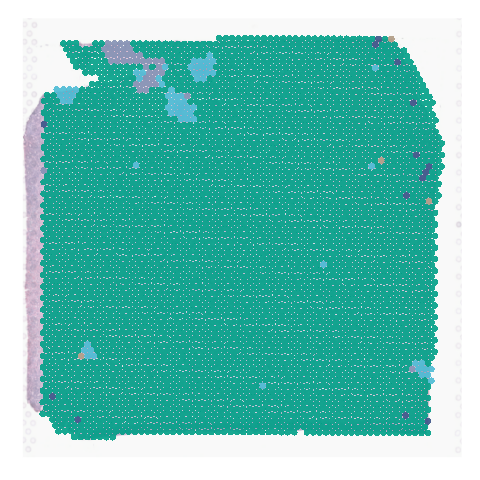

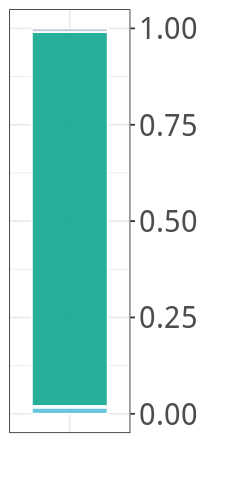

In [43]:
tmp_obj = readRDS('./ST/736083_4/736083_4_res.rds')
celltype_frac_df = read.table(file.path('./ST/736083_4/STRIDE//assign_level3/STRIDE_spot_celltype_frac.txt'), sep='\t', check.names = F, row.names = 1, header = T)
all_sample_meta = read.delim('./all_sample_meta.tsv', sep='\t', row.names=1, check.names=F)

# annotation by max cell type proportion
celltype_frac_df = celltype_frac_df[rownames(tmp_obj@meta.data),]
tmp_obj@meta.data$assign.max = colnames(celltype_frac_df)[apply(celltype_frac_df, FUN=which.max, 1)]
for (tmp_c in levels(as.factor(tmp_obj@meta.data$assign.max))){
    if (tmp_c %in% c('Mal_AGEJ_like','Mal_EAC_like','Mal_GC_like')){
        tmp_obj@meta.data$assign.max[tmp_obj@meta.data$assign.max == tmp_c] = 'Malignant'
    } else {
        tmp_obj@meta.data$assign.max[tmp_obj@meta.data$assign.max == tmp_c] = unique(all_sample_meta[all_sample_meta$assign.level3 == tmp_c, 'assign.level1'])
    }
    
}
tmp_obj@meta.data$assign.max[tmp_obj@meta.data$assign.max == 'Epithelial'] = 'Normal Epithelial'
tmp_obj@meta.data$assign.max = factor(tmp_obj@meta.data$assign.max, levels=c('T','B','Plasma','Mono/Macro','Mast','Normal Epithelial','Malignant','Fib/Endo'))

options(repr.plot.width=4, repr.plot.height=4)
SpatialDimPlot(tmp_obj, group.by = 'assign.max',
               cols=mypal,
               stroke=NA,
               label = F,  label.size=8, alpha=c(0.9,1), image.alpha = 0.5) +
theme(legend.position = "none")
ggsave('./Fig_pdf/Fig1e_st4.pdf', width=4, height=4, dpi=500, bg='transparent')


tmp_obj@meta.data$Sample = 'ST_P2_Adj'
plot_df = tmp_obj@meta.data[,c('Sample','assign.max')] %>% group_by(assign.max) %>% count(Sample)

options(repr.plot.width=2, repr.plot.height=4)
plot_df$assign.max = factor(plot_df$assign.max, levels=c('T','B','Plasma','Mono/Macro','Mast','Normal Epithelial','Malignant','Fib/Endo'))
ggplot(plot_df, aes(fill=assign.max, y=n, x=Sample)) + 
  geom_bar(position="fill", fill=mypal[as.character(plot_df$assign.max)], stat="identity", color='white', width=0.75) + 
  theme_bw() + theme(legend.position = "none",
                          axis.text=element_text(size=18),
                     axis.text.x = element_blank(),
                     axis.ticks.x = element_blank(),
                          axis.title=element_text(size=18)) +
  ylab('') + xlab('') + scale_y_continuous(position = "right")
ggsave('./Fig_pdf/Fig1e_st4_bar.pdf', width=2, height=4, dpi=500, bg='transparent', family='sans')


# Fig 2

In [50]:
Epi_obj = readRDS(file='./Epi_subset/Epi_SCT_harmony.rds')

In [287]:
mypal = c('#6b6fa0', '#788db0', '#88abbf', '#9cc9ce', '#bbe6da', '#fffadf', '#ffcab9', '#fd9291', '#e75d6f', '#c52a52', '#93003a')

## Fig 2a

In [295]:
pdf(file = './Fig_pdf/Fig2a.pdf', width=9, height=8)
options(repr.plot.width=9, repr.plot.height=8)
DimPlot(Epi_obj, label = F, pt.size=5, group.by='Sample',
        cols=mypal,
        # label.size=8,
        raster=T,
        raster.dpi=c(2048,2048)
       ) +
xlab('UMAP-1') + ylab('UMAP-2')+
theme(text=element_text(size=12),
      axis.text=element_text(size=0),
      axis.title=element_text(size=14),
      axis.ticks = element_blank(),
    legend.text=element_text(size=20))
dev.off()

png 
  2

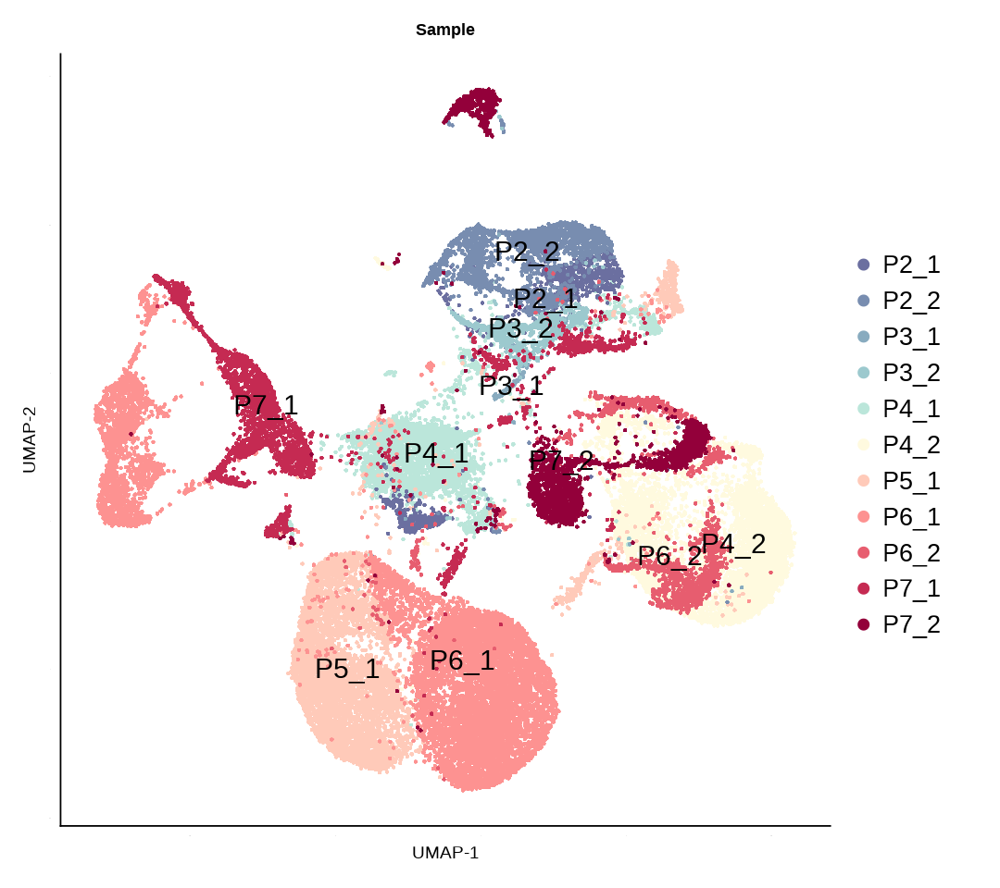

In [294]:
# h5_obj_SCT_harmony@meta.data$assign.level1 = factor(h5_obj_SCT_harmony@meta.data$assign.level1, levels=c('T','B','Plasma','Mono/Macro','Mast','Normal Epithelial','Malignant','Fib/Endo'))
options(repr.plot.width=9, repr.plot.height=8)
DimPlot(Epi_obj, label = T, pt.size=5, group.by='Sample',
        cols=mypal,
        label.size=8,
        raster=T,
        raster.dpi=c(2048,2048)
       ) +
xlab('UMAP-1') + ylab('UMAP-2')+
theme(text=element_text(size=12),
      axis.text=element_text(size=0),
      axis.title=element_text(size=14),
      axis.ticks = element_blank(),
    legend.text=element_text(size=20))


In [307]:
pdf(file = './Fig_pdf/Fig2a_CNV.pdf', width=9, height=8)
options(repr.plot.width=9, repr.plot.height=8)
p = FeaturePlot(Epi_obj, features='CNV_score_TBref',
                cols=c('#fffadf','#c52a52'),
        raster=T,
        raster.dpi=c(2048,2048),
            order=T, max.cutoff='q99',
            pt.size=7) + 
xlab('UMAP-1') + ylab('UMAP-2')+
theme(text=element_text(size=12),
      axis.text=element_text(size=0),
      axis.title=element_text(size=14),
      axis.ticks = element_blank(),
    legend.text=element_text(size=20))
p
dev.off()

png 
  2

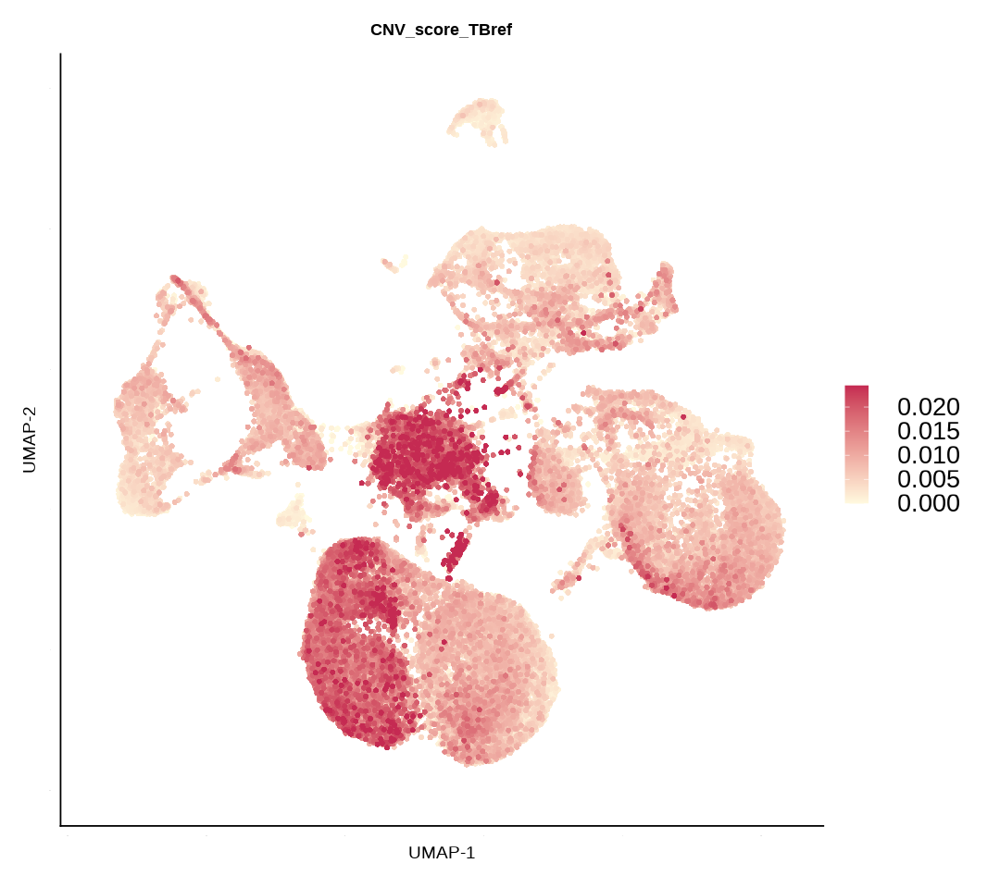

In [308]:
p

In [311]:
pdf(file = './Fig_pdf/Fig2a_bulk_AEG.pdf', width=9, height=8)
options(repr.plot.width=9, repr.plot.height=8)
p = FeaturePlot(Epi_obj, features='malignant_AEG_UCell',
                cols=c('#fffadf','#c52a52'),
        raster=T,
        raster.dpi=c(2048,2048),
            order=T,
                max.cutoff='q99',
            pt.size=7) + 
xlab('UMAP-1') + ylab('UMAP-2')+
theme(text=element_text(size=12),
      axis.text=element_text(size=0),
      axis.title=element_text(size=14),
      axis.ticks = element_blank(),
    legend.text=element_text(size=20))
p
dev.off()

png 
  2

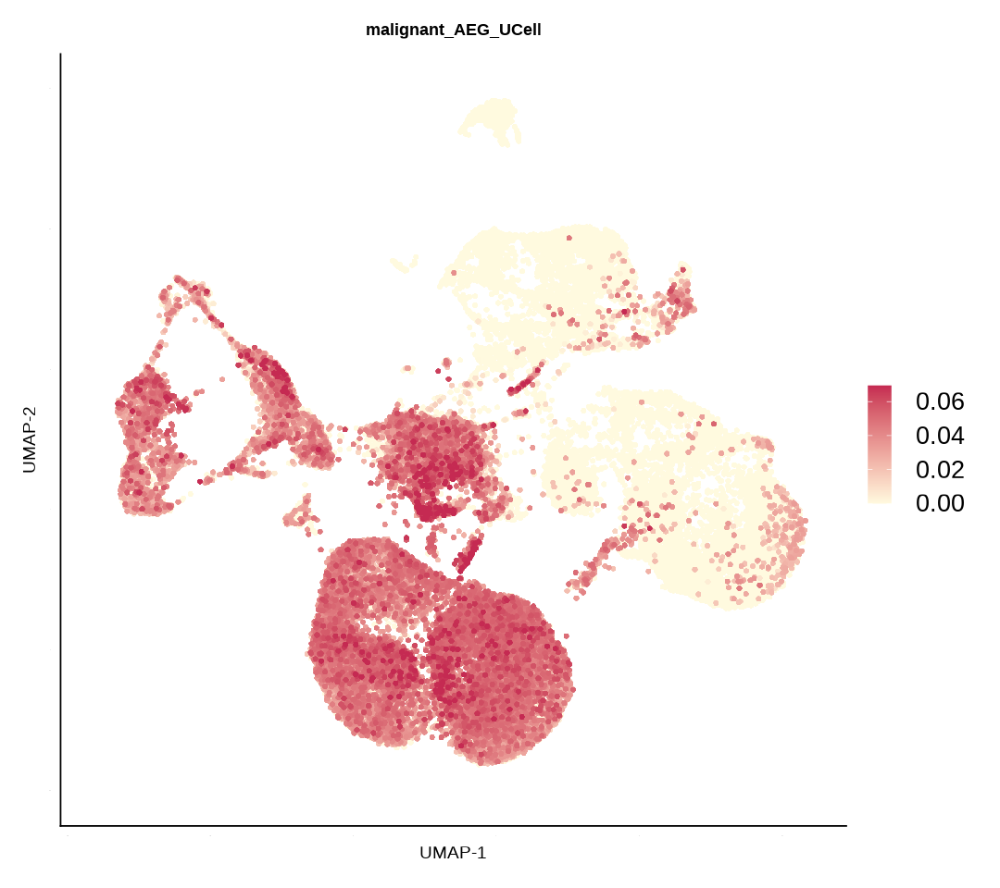

In [312]:
p

In [323]:
rep(tmp_fill, 11)

Malignant    Normal Malignant    Normal Malignant    Normal Malignant    Normal 
"#e75d6f" "#88abbf" "#e75d6f" "#88abbf" "#e75d6f" "#88abbf" "#e75d6f" "#88abbf" 
Malignant    Normal Malignant    Normal Malignant    Normal Malignant    Normal 
"#e75d6f" "#88abbf" "#e75d6f" "#88abbf" "#e75d6f" "#88abbf" "#e75d6f" "#88abbf" 
Malignant    Normal Malignant    Normal Malignant    Normal 
"#e75d6f" "#88abbf" "#e75d6f" "#88abbf" "#e75d6f" "#88abbf"

## Fig 2b

png 
  2

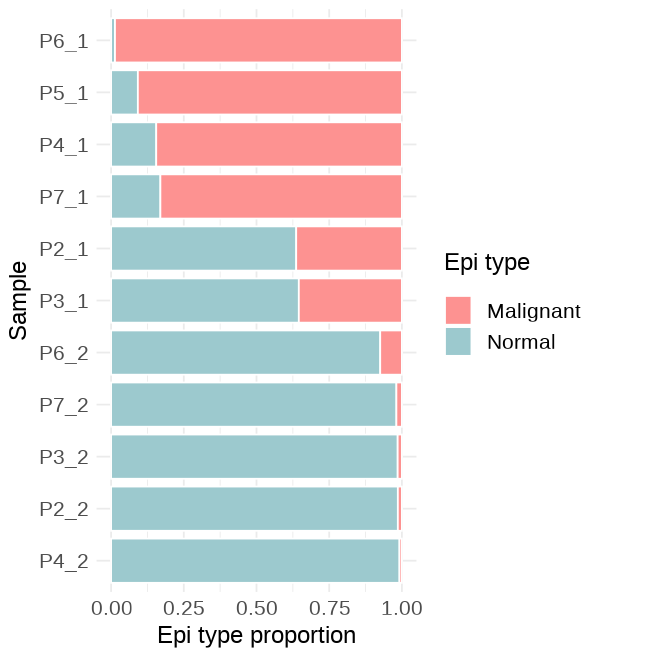

In [335]:
plot_df = Epi_obj@meta.data[,c('Sample','malignant_filter')] %>% group_by(Sample) %>% count(malignant_filter)
plot_df$malignant_filter[plot_df$malignant_filter == T] = 'Malignant'
plot_df$malignant_filter[plot_df$malignant_filter == F] = 'Normal'

pdf(file = './Fig_pdf/Fig2b.pdf', width=5.5, height=5.5)
options(repr.plot.width = 5.5, repr.plot.height = 5.5)

# tmp_fill = c('#e75d6f','#88abbf')
# tmp_fill = c('#9cc9ce','#fd9291')
# names(tmp_fill) = c('Malignant','Normal')
p = ggplot(plot_df, aes(fill=malignant_filter, y=n, x=Sample)) + 
  geom_bar(position="fill", stat="identity", color='white', width=0.85) + 
scale_fill_manual(name='Epi type', values = c("Malignant" = "#fd9291", "Normal" = "#9cc9ce")) +
  theme_minimal() + theme(legend.text = element_text(size = 16), 
                          legend.title = element_text(size = 18), 
                          axis.text=element_text(size=16),
                          axis.title=element_text(size=18)) +
  ylab('Epi type proportion') + 
scale_x_discrete(
  limits=c('P4_2','P2_2','P3_2','P7_2','P6_2','P3_1','P2_1','P7_1','P4_1','P5_1','P6_1'))  + 
  coord_flip()
# update_labels(p, list(tmp_fill='malignant_filter'))
p
dev.off()
p

## Fig 2c

In [4]:
Epi_obj = readRDS('./Epi_subset/Normal_Epi_SCT_harmony.rds')

png 
  2

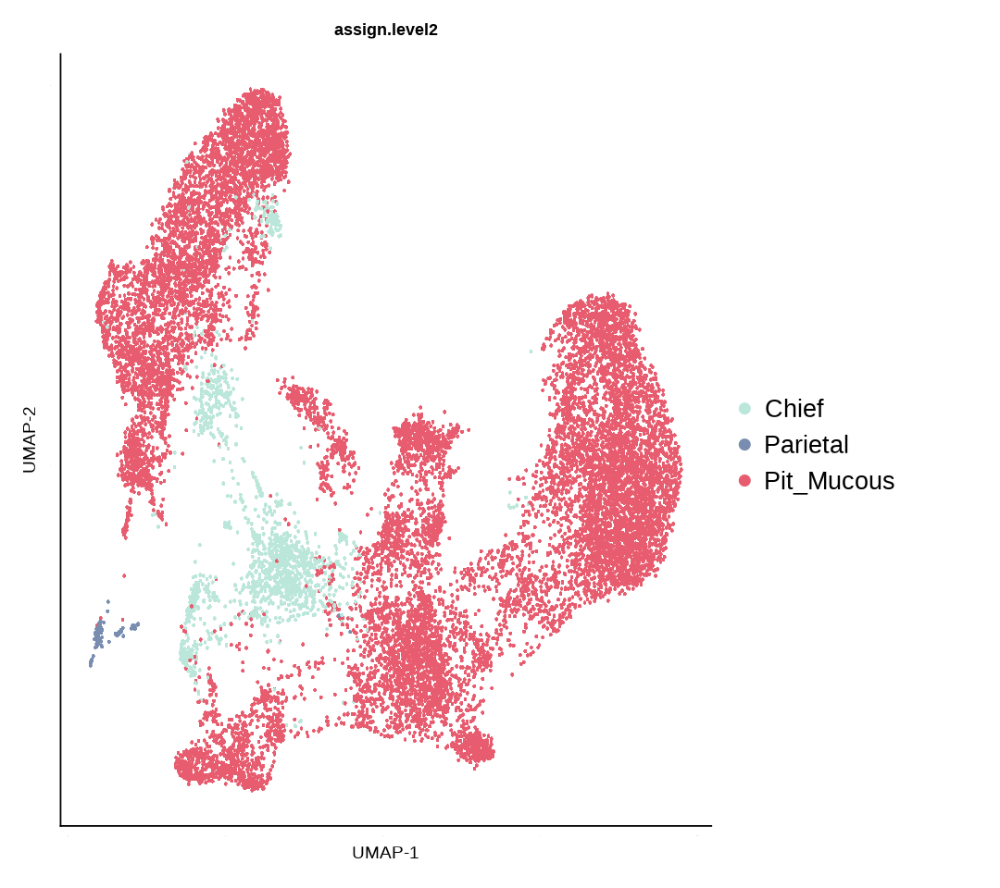

In [347]:
pdf(file = './Fig_pdf/Fig2c.pdf', width=9, height=8)
options(repr.plot.width=9, repr.plot.height=8)
p = DimPlot(Epi_obj, label = F, pt.size=5, group.by='assign.level2',
        cols=c('#bbe6da','#788db0','#e75d6f'),
        # label.size=8,
        raster=T,
        raster.dpi=c(2048,2048)
       ) +
xlab('UMAP-1') + ylab('UMAP-2')+
theme(text=element_text(size=12),
      axis.text=element_text(size=0),
      axis.title=element_text(size=14),
      axis.ticks = element_blank(),
    legend.text=element_text(size=20))
p
dev.off()

p

In [380]:
table(Epi_obj@meta.data$assign.level2)


     Chief   Parietal Pit_Mucous 
      1557         96      14457 

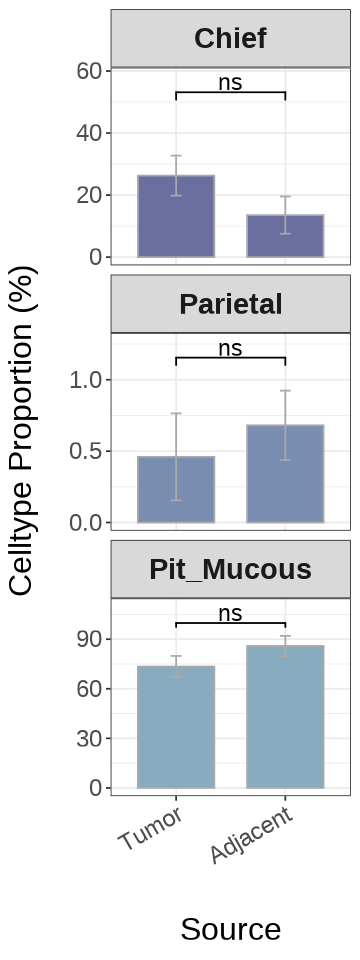

In [379]:
plot_df = Epi_obj@meta.data[,c('assign.level2','Source','Sample')] %>% group_by(Source) %>% count(Sample,assign.level2)
colnames(plot_df) = c('Source','Sample','Cell type','n')

sample_count_df = Epi_obj@meta.data[,c('Sample','Source')] %>% count(Sample)
colnames(sample_count_df) = c('Sample','Sample_freq')

plot_df = merge(plot_df, sample_count_df)
plot_df$Celltype_Proportion = plot_df$n/plot_df$Sample_freq*100
plot_df$Source = gsub('tumor','Tumor',plot_df$Source)
plot_df$Source = gsub('adjacent','Adjacent',plot_df$Source)

plot_df = plot_df[plot_df$Sample != 'P5_1',]

options(repr.plot.width=3, repr.plot.height=8)
p <- ggbarplot(plot_df, x = "Source", y = "Celltype_Proportion",color= "darkgrey",
          position = position_dodge(0.8), palette=mypal, fill='Cell type', add = "mean_se") +
  theme_bw() + 
  theme(legend.position = 'none',
      legend.text = element_text(size = 20), 
       legend.title = element_text(size = 24), 
       axis.text.x=element_text(size=18,angle=30,hjust=1),
       axis.text.y=element_text(size=18),
       axis.title=element_text(size=24)) +
  facet_wrap(~`Cell type`,  ncol=1, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 22,face="bold")) +
  ylab('Celltype Proportion (%)') +
  # scale_x_discrete(limits=c("chemo", "no_treatment")) +
  stat_compare_means(comparisons = list(c('Tumor','Adjacent')),
                   label = 'p.signif',
                   label.x=1.5,
                   step.increase=0.1, bracket.size=0.5,
                     size=6, tip.length=0.05,hide.ns = F) + 
scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))
print(p)


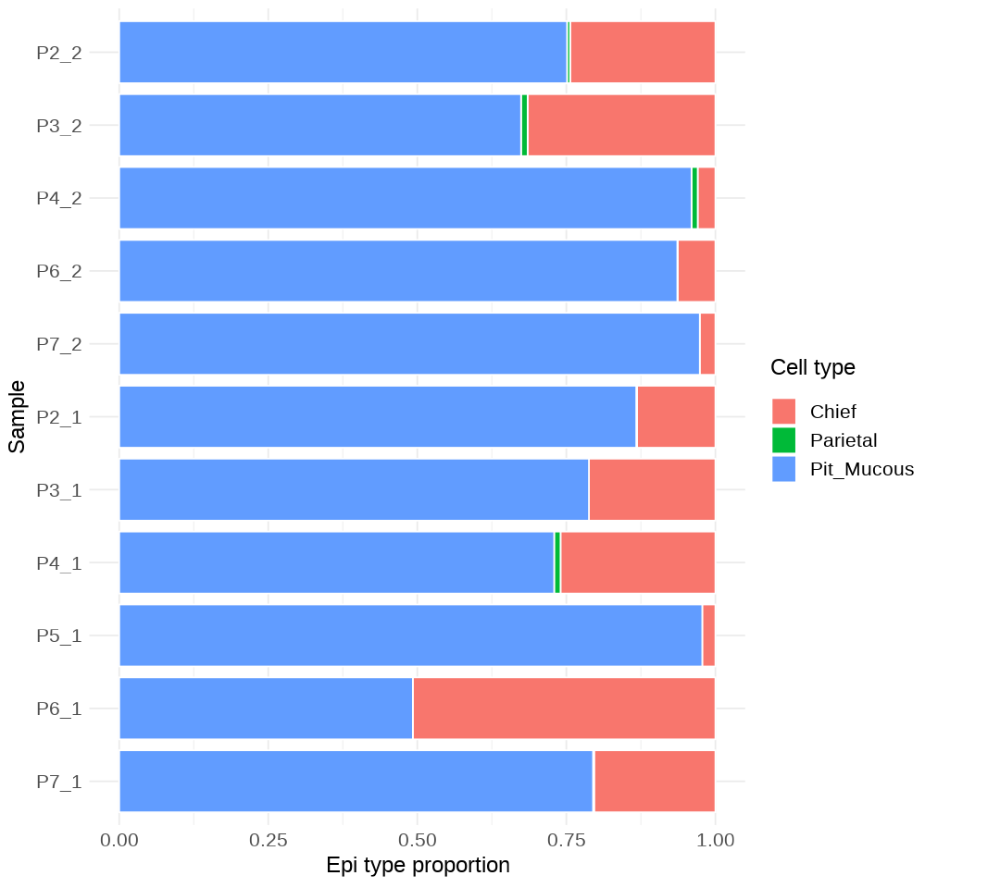

In [374]:
plot_df = Epi_obj@meta.data[,c('assign.level2','Source','Sample')] %>% group_by(Source) %>% count(Sample,assign.level2)
colnames(plot_df) = c('Source','Sample','Cell type','n')

sample_count_df = Epi_obj@meta.data[,c('Sample','Source')] %>% count(Sample)
colnames(sample_count_df) = c('Sample','Sample_freq')

plot_df = merge(plot_df, sample_count_df)
plot_df$Celltype_Proportion = plot_df$n/plot_df$Sample_freq*100
plot_df$Source = gsub('tumor','Tumor',plot_df$Source)
plot_df$Source = gsub('adjacent','Adjacent',plot_df$Source)

options(repr.plot.width=9, repr.plot.height=8)
p = ggplot(plot_df, aes(fill=`Cell type`, y=n, x=Sample)) + 
  geom_bar(position="fill", stat="identity", color='white', width=0.85) + 
# scale_fill_manual(name='Epi type', values = c("Malignant" = "#fd9291", "Normal" = "#9cc9ce")) +
  theme_minimal() + theme(legend.text = element_text(size = 16), 
                          legend.title = element_text(size = 18), 
                          axis.text=element_text(size=16),
                          axis.title=element_text(size=18)) +
  ylab('Epi type proportion') + 
scale_x_discrete(
  limits=c('P7_1','P6_1','P5_1','P4_1','P3_1','P2_1','P7_2','P6_2','P4_2','P3_2','P2_2'))  + 
  coord_flip()
p

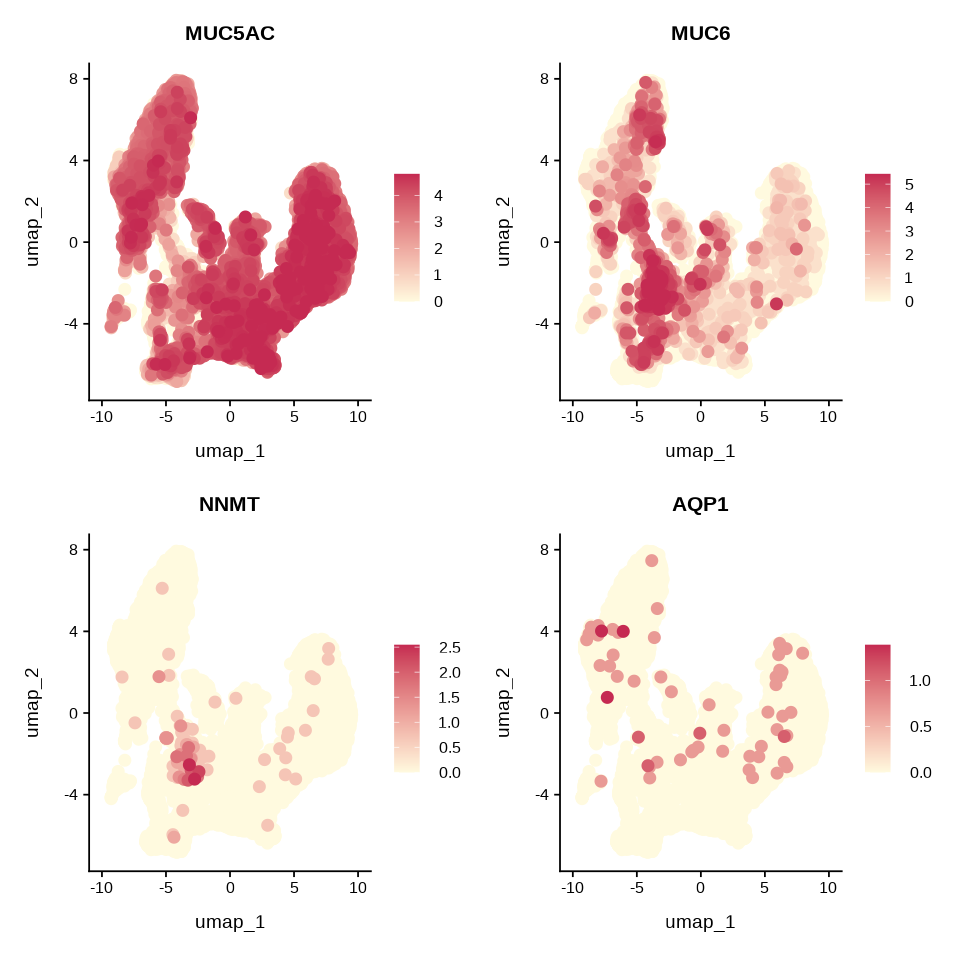

In [367]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(Epi_obj, features=c('MUC5AC','MUC6','NNMT','AQP1'),
                cols=c('#fffadf','#c52a52'),
            order=T, max.cutoff='q99',
            pt.size=3)


## Fig 2d

In [5]:
Mal_obj = readRDS('./Epi_subset/Malignant_obj.rds')

png 
  2

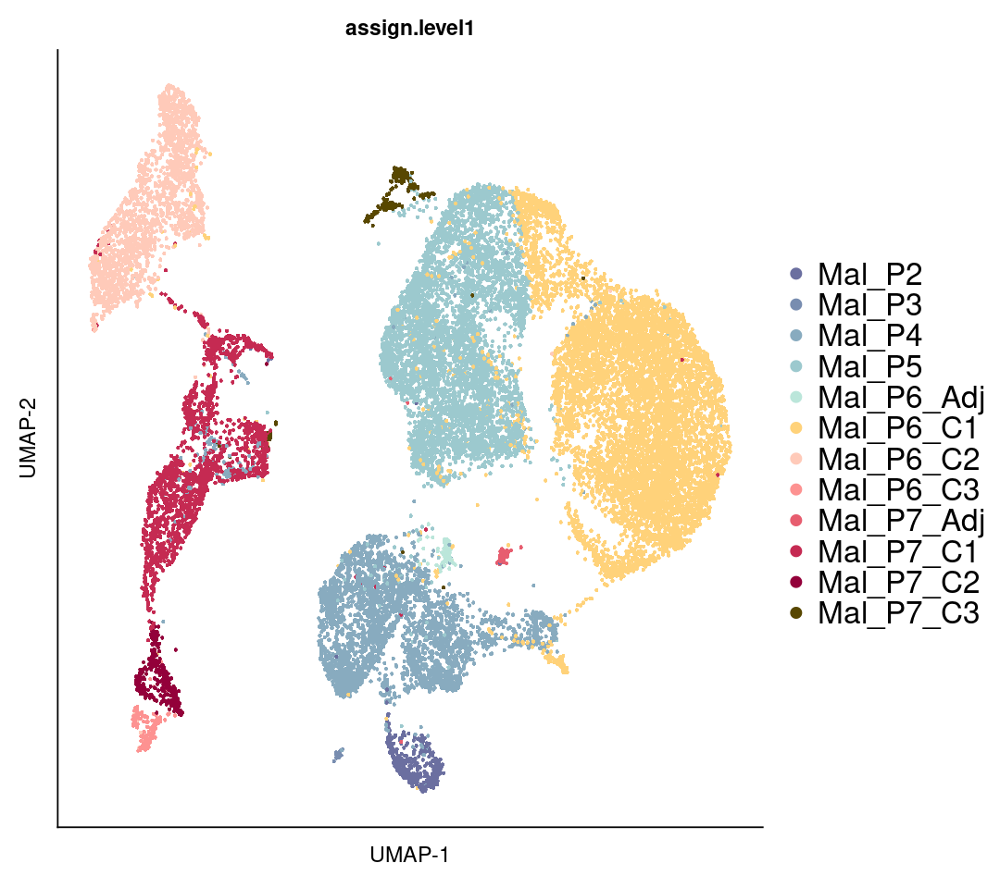

In [24]:
pdf(file = './Fig_pdf/Fig2d.pdf', width=9, height=8)
options(repr.plot.width=9, repr.plot.height=8)
p = DimPlot(Mal_obj, label = F, pt.size=5, group.by='assign.level1',
        # cols=c('#6b6fa0', '#6c81ad', '#7092b9', '#79a3c5', '#8cb2d0', '#c3b8d1', '#ffd27a', '#faa66e', '#eb7c62', '#d25653', '#ad3b3f', '#584700'),
            # cols=c('#919191', '#7ca7c0', '#8cbac2', '#9ecdc0', '#b4dfba', '#cff1ac', '#ffd27a', '#faa66e', '#eb7c62', '#d25653', '#ad3b3f', '#584700'),
            # cols=c('#234fc2', '#4169d3', '#5a85dc', '#6da2e3', '#7ec0e7', '#8bdfe9', '#ffd27a', '#faa66e', '#eb7c62', '#d25653', '#ad3b3f', '#584700'),
            cols=c('#6b6fa0', '#788db0', '#88abbf', '#9cc9ce', '#bbe6da', '#ffd27a', '#ffcab9', '#fd9291', '#e75d6f', '#c52a52', '#93003a', '#584700'),
        # label.size=8,
        raster=T,
        raster.dpi=c(2048,2048)
       ) +
xlab('UMAP-1') + ylab('UMAP-2')+
theme(text=element_text(size=12),
      axis.text=element_text(size=0),
      axis.title=element_text(size=14),
      axis.ticks = element_blank(),
    legend.text=element_text(size=20))
p
dev.off()
p

In [6]:
EAC_obj = readRDS('../public_datasets/EAC_Molecular_Cancer//EAC_Malignant.rds')
GC_obj = readRDS('../public_datasets/GC_GSE183904//GC_Malignant.rds')
GC_obj@meta.data$select_location = GC_obj@meta.data$Location %in% c('Body-Antrum','Cardia','Proximal')
# GC_obj = UpdateSCTAssays(GC_obj)
# GC_obj = UpdateSeuratObject(GC_obj)
# GC_obj[['SCT']] = as(GC_obj[['SCT']], 'Assay5')
GC_filter_obj = subset(GC_obj, subset=select_location==T)

common_genes = rownames(Mal_obj)
common_genes = intersect(common_genes, rownames(EAC_obj))
common_genes = intersect(common_genes, rownames(GC_filter_obj))
print(length(common_genes))

Epi_avg_exp <- AverageExpression(Mal_obj, assays='SCT', slot='data', features=common_genes, group.by='assign.level1', return.seurat = T)
EAC_avg_exp <- AverageExpression(EAC_obj, assays='SCT', slot='data', features=common_genes, group.by='assign.level1', return.seurat = T)
GC_avg_exp <- AverageExpression(GC_filter_obj, assays='SCT', slot='data', features=common_genes, group.by='assign.level1', return.seurat = T)
EAC_avg_exp = EAC_avg_exp[rownames(Epi_avg_exp),]
GC_avg_exp = GC_avg_exp[rownames(Epi_avg_exp),]

# cal corr
Epi_GC_corr = as.data.frame(cor(cbind(Epi_avg_exp@assays$SCT@data, GC_avg_exp@assays$SCT@data)))
Epi_EAC_corr = as.data.frame(cor(cbind(Epi_avg_exp@assays$SCT@data, EAC_avg_exp@assays$SCT@data)))

# keep only needed corr
Epi_Mal_clusters = rownames(Epi_GC_corr)[grep('^Mal',rownames(Epi_GC_corr))]
EAC_clusters = rownames(Epi_EAC_corr)[grep('^EAC',rownames(Epi_EAC_corr))]
GC_clusters = rownames(Epi_GC_corr)[grep('^GC',rownames(Epi_GC_corr))]

Epi_EAC_corr_sub = Epi_EAC_corr[Epi_Mal_clusters, EAC_clusters]
Epi_GC_corr_sub = Epi_GC_corr[Epi_Mal_clusters, GC_clusters]

Epi_EAC_GC_corr = cbind(Epi_EAC_corr_sub, Epi_GC_corr_sub)

# norm EAC GC correlations
tmp_df = apply(Epi_EAC_GC_corr, FUN=function(x) (x-min(x))/(max(x)-min(x)), MARGIN = 2)

# cal & norm AGEJ gene sig score
AGEJ_score_df = Mal_obj@meta.data[,c('malignant_AEG_UCell','assign.level1')]
AGEJ_score_df = AGEJ_score_df %>% group_by(assign.level1) %>%
summarize(AGEJ_score = mean(malignant_AEG_UCell))

AGEJ_score_df = as.data.frame(AGEJ_score_df)
rownames(AGEJ_score_df) = gsub('_','-', AGEJ_score_df$assign.level1)
AGEJ_score_df$assign.level1 = NULL

AGEJ_score_df = apply(AGEJ_score_df, FUN=function(x) (x-min(x))/(max(x)-min(x)), MARGIN = 2)
AGEJ_score_df = AGEJ_score_df[rownames(Epi_EAC_GC_corr),]
                      
Epi_EAC_GC_AGEJ_corr = cbind(tmp_df, AGEJ_score_df)

[1] 12578


Warning message:
“`invoke()` is deprecated as of rlang 0.4.0.
Please use `exec()` or `inject()` instead.
This warning is displayed once every 8 hours.”
Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix



Warning message:
“The input is a data frame, convert it to the matrix.”


png 
  2

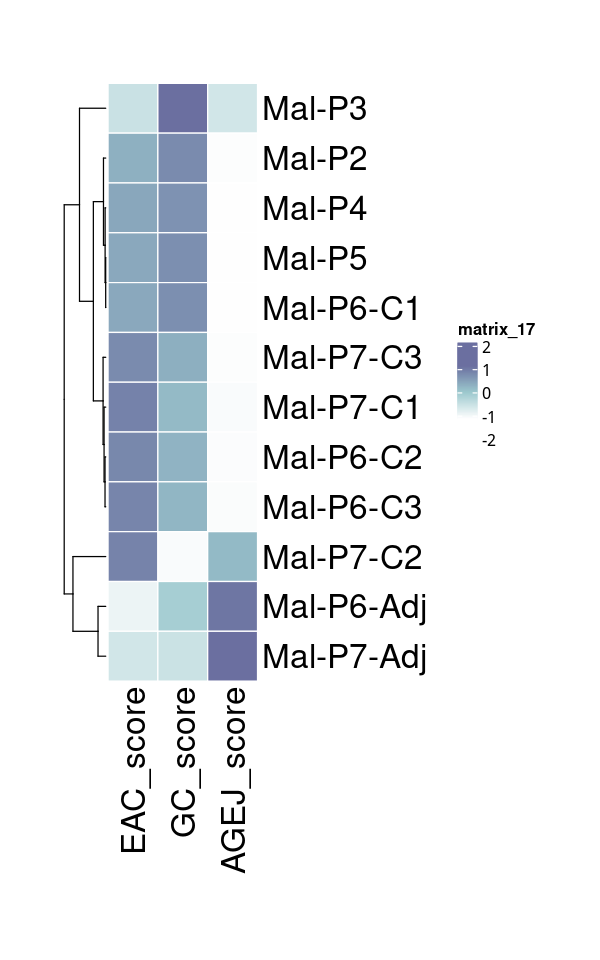

In [28]:
tmp_df = data.frame(
    EAC_score = apply(Epi_EAC_GC_AGEJ_corr[,1:3], mean, MARGIN = 1),
    GC_score = apply(Epi_EAC_GC_AGEJ_corr[,4:5], mean, MARGIN = 1),
    AGEJ_score = Epi_EAC_GC_AGEJ_corr[,6]
)

pdf(file = './Fig_pdf/Fig2e.pdf', width=5, height=8)
options(repr.plot.width=5, repr.plot.height=8)
p = pheatmap(tmp_df, 
         color=colorRampPalette(rev(c('#6b6fa0', '#9cc9ce','#ffffff')))(200),
         border_color='white',
         treeheight_row=25,
         # colorRampPalette(c('white','#00429d'))(500),
         # colorRampPalette(c('#ffffe0', '#f4777f', '#93003a'))(500),
        cellwidth=30, cellheight=30, fontsize=20, cluster_col=F, scale='row')
p
dev.off()
p

In [8]:
tmp_df$assign.level1 = gsub('-','_',rownames(tmp_df))

In [10]:
table(Mal_obj@meta.data$assign.level1)


    Mal_P2     Mal_P3     Mal_P4     Mal_P5 Mal_P6_Adj  Mal_P6_C1  Mal_P6_C2 
       441         53       3464       5570         88       8068       1987 
 Mal_P6_C3 Mal_P7_Adj  Mal_P7_C1  Mal_P7_C2  Mal_P7_C3 
       169         75       1852        374        251 

In [60]:
EAC_obj = readRDS('../public_datasets/EAC_Molecular_Cancer//EAC_Malignant.rds')
GC_obj = readRDS('../public_datasets/GC_GSE183904//GC_Malignant.rds')
GC_obj@meta.data$select_location = GC_obj@meta.data$Location %in% c('Body-Antrum','Cardia','Proximal')
# GC_obj = UpdateSCTAssays(GC_obj)
# GC_obj = UpdateSeuratObject(GC_obj)
# GC_obj[['SCT']] = as(GC_obj[['SCT']], 'Assay5')
GC_filter_obj = subset(GC_obj, subset=select_location==T)

common_genes = rownames(Mal_obj)
common_genes = intersect(common_genes, rownames(EAC_obj))
common_genes = intersect(common_genes, rownames(GC_filter_obj))
print(length(common_genes))

# Epi_avg_exp <- AverageExpression(Mal_obj, assays='SCT', slot='data', features=common_genes, group.by='assign.level1', return.seurat = T)
Epi_exp_sc = as.matrix(Mal_obj@assays$SCT@data)[common_genes,]
EAC_avg_exp <- AverageExpression(EAC_obj, assays='SCT', slot='data', features=common_genes, group.by='assign.level1', return.seurat = T)
GC_avg_exp <- AverageExpression(GC_filter_obj, assays='SCT', slot='data', features=common_genes, group.by='assign.level1', return.seurat = T)
EAC_avg_exp = EAC_avg_exp[rownames(Epi_exp_sc),]
GC_avg_exp = GC_avg_exp[rownames(Epi_exp_sc),]

# cal corr
Epi_GC_corr = as.data.frame(cor(GC_avg_exp@assays$SCT@data, Epi_exp_sc))
Epi_EAC_corr = as.data.frame(cor(EAC_avg_exp@assays$SCT@data, Epi_exp_sc))

Epi_EAC_GC_corr = rbind(Epi_EAC_corr, Epi_GC_corr)

tmp_df = data.frame(
    EAC_score = apply(Epi_EAC_GC_corr[1:3,], mean, MARGIN = 2)[rownames(Mal_obj@meta.data)],
    GC_score = apply(Epi_EAC_GC_corr[4:5,], mean, MARGIN = 2)[rownames(Mal_obj@meta.data)],
    AEG_score = Mal_obj@meta.data$malignant_AEG_UCell
)
tmp_df = as.data.frame(apply(tmp_df, FUN=function(x) (x-min(x))/(max(x)-min(x)), MARGIN = 2))

Mal_obj@meta.data$EAC_score = tmp_df$EAC_score
Mal_obj@meta.data$GC_score = tmp_df$GC_score
Mal_obj@meta.data$AEG_score = tmp_df$AEG_score

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


png 
  2

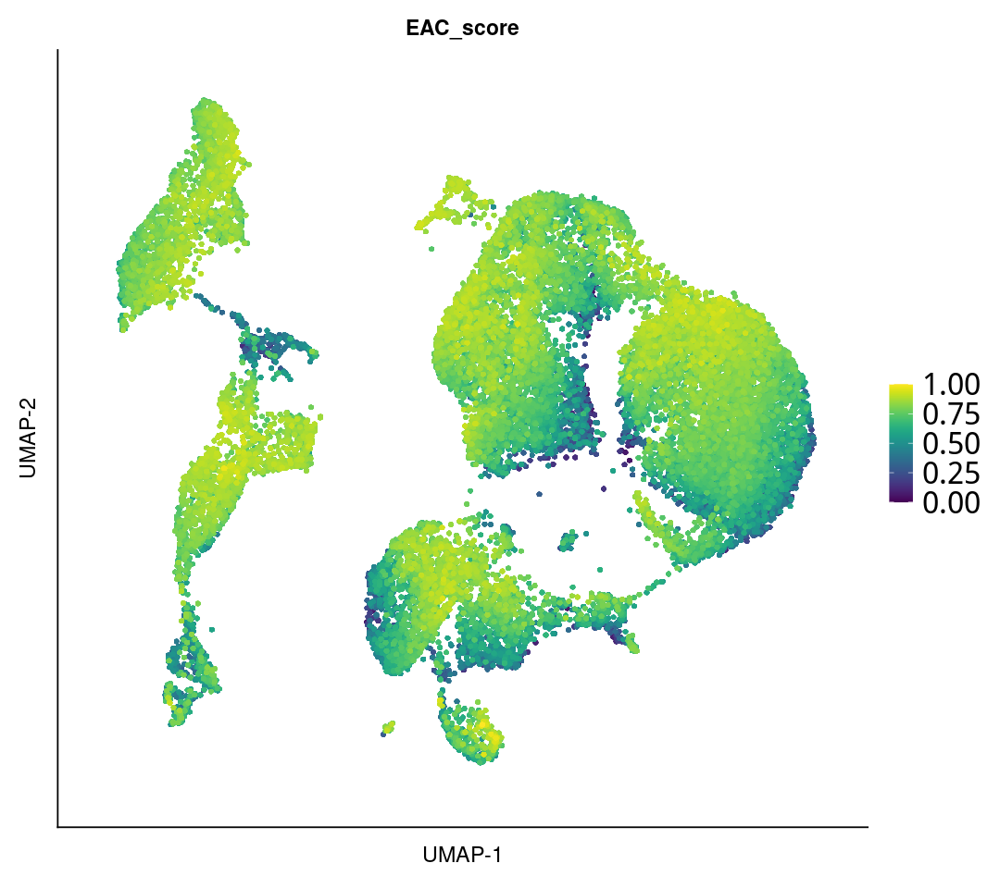

In [74]:
pdf(file = './Fig_pdf/Fig2d_EAC.pdf', width=9, height=8)
options(repr.plot.width=9, repr.plot.height=8)
p = FeaturePlot(Mal_obj, features='EAC_score',
                # cols=c('#fffadf','#c52a52'),
        raster=T,
        raster.dpi=c(2048,2048),
            order=T,
                # max.cutoff='q99',
            pt.size=7) + 
xlab('UMAP-1') + ylab('UMAP-2')+
theme(text=element_text(size=12),
      axis.text=element_text(size=0),
      axis.title=element_text(size=14),
      axis.ticks = element_blank(),
    legend.text=element_text(size=20))+
scale_color_viridis()
p
dev.off()
p

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


png 
  2

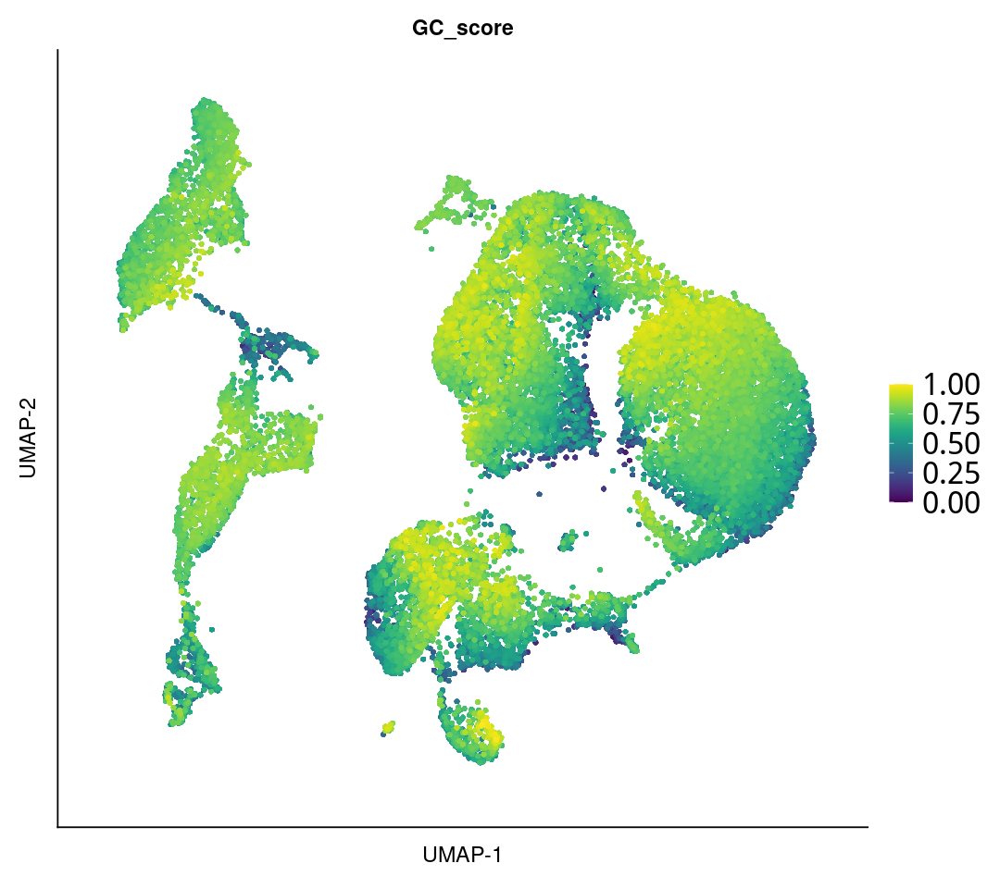

In [73]:
pdf(file = './Fig_pdf/Fig2d_GC.pdf', width=9, height=8)
options(repr.plot.width=9, repr.plot.height=8)
p = FeaturePlot(Mal_obj, features='GC_score',
                # cols=c('#fffadf','#c52a52'),
                cols = c('#fffadf','#6b6fa0'),
        raster=T,
        raster.dpi=c(2048,2048),
            order=T,
                # max.cutoff='q99',
            pt.size=7) + 
xlab('UMAP-1') + ylab('UMAP-2')+
theme(text=element_text(size=12),
      axis.text=element_text(size=0),
      axis.title=element_text(size=14),
      axis.ticks = element_blank(),
    legend.text=element_text(size=20)) +
scale_color_viridis()
p
dev.off()
p

png 
  2

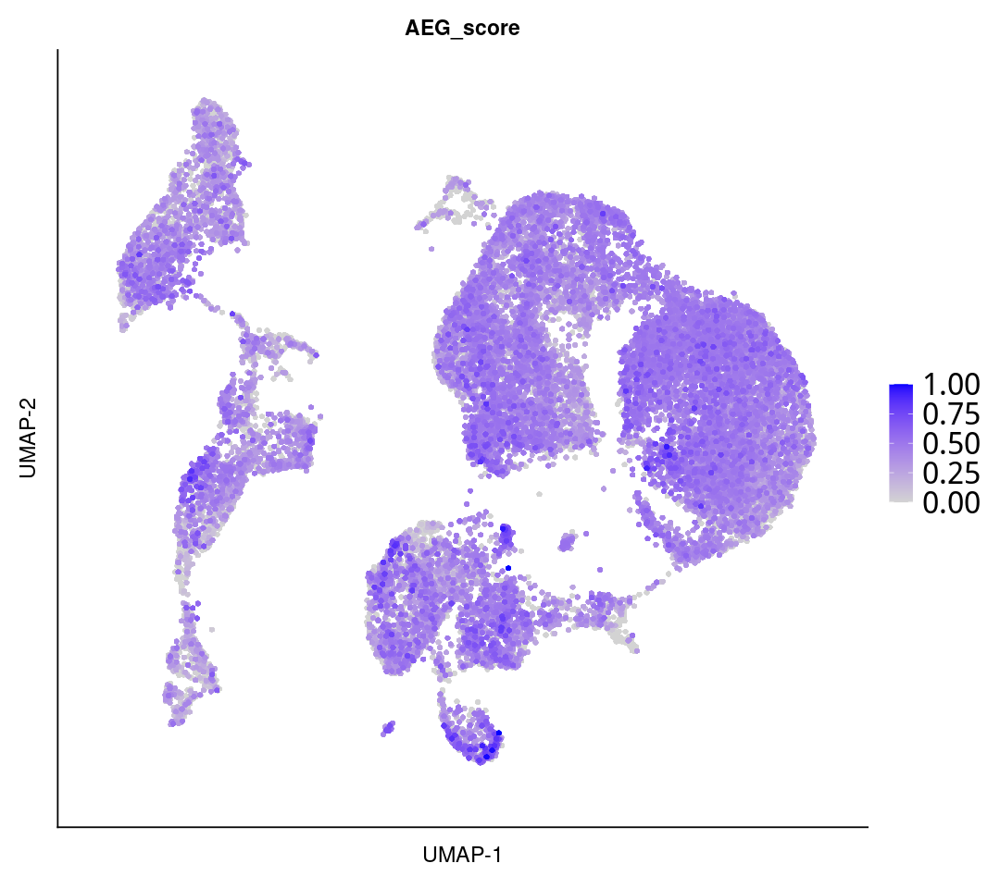

In [63]:
pdf(file = './Fig_pdf/Fig2d_AEG.pdf', width=9, height=8)
options(repr.plot.width=9, repr.plot.height=8)
p = FeaturePlot(Mal_obj, features='AEG_score',
                # cols=c('#fffadf','#c52a52'),
        raster=T,
        raster.dpi=c(2048,2048),
            order=T,
                # max.cutoff='q99',
            pt.size=7) + 
xlab('UMAP-1') + ylab('UMAP-2')+
theme(text=element_text(size=12),
      axis.text=element_text(size=0),
      axis.title=element_text(size=14),
      axis.ticks = element_blank(),
    legend.text=element_text(size=20))
p
dev.off()
p

## Fig 2f

png 
  2

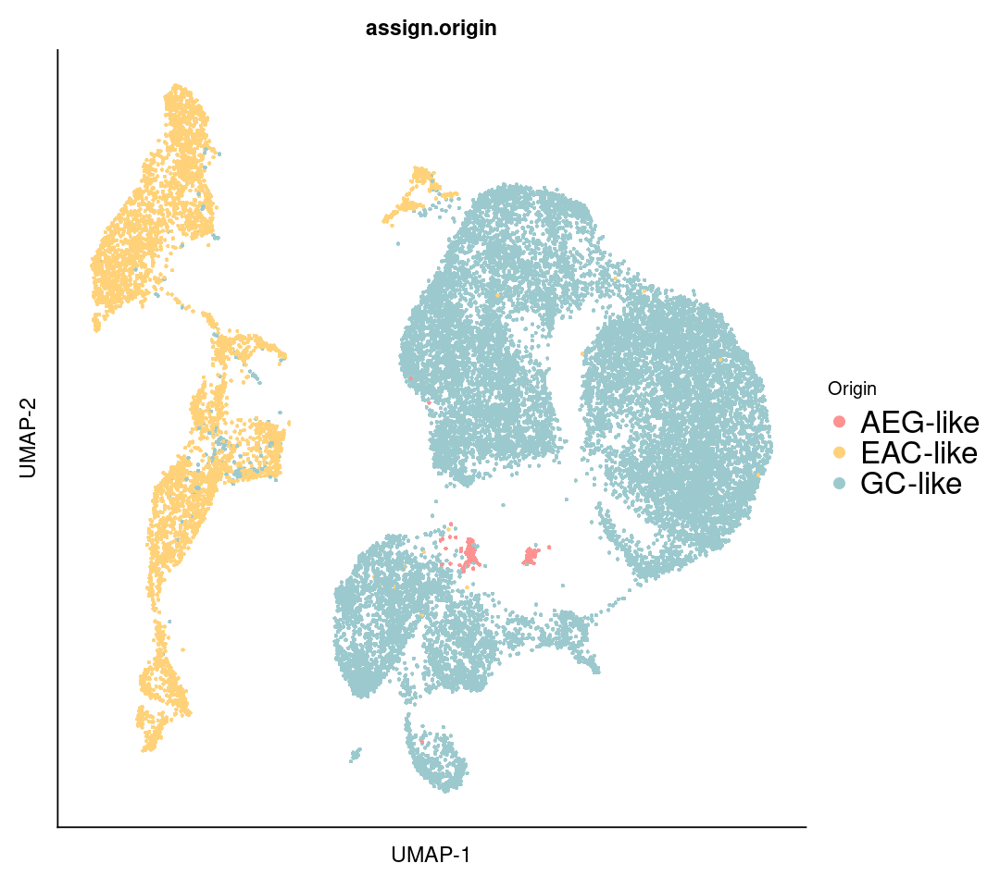

In [77]:
pdf(file = './Fig_pdf/Fig2f.pdf', width=9, height=8)
options(repr.plot.width=9, repr.plot.height=8)
p = DimPlot(Mal_obj, label = F, pt.size=5, group.by='assign.origin',
        # cols=c('#6b6fa0', '#6c81ad', '#7092b9', '#79a3c5', '#8cb2d0', '#c3b8d1', '#ffd27a', '#faa66e', '#eb7c62', '#d25653', '#ad3b3f', '#584700'),
            # cols=c('#919191', '#7ca7c0', '#8cbac2', '#9ecdc0', '#b4dfba', '#cff1ac', '#ffd27a', '#faa66e', '#eb7c62', '#d25653', '#ad3b3f', '#584700'),
            # cols=c('#234fc2', '#4169d3', '#5a85dc', '#6da2e3', '#7ec0e7', '#8bdfe9', '#ffd27a', '#faa66e', '#eb7c62', '#d25653', '#ad3b3f', '#584700'),
            # cols=c('#6b6fa0', '#788db0', '#88abbf', '#9cc9ce', '#bbe6da', '#ffd27a', '#ffcab9', '#fd9291', '#e75d6f', '#c52a52', '#93003a', '#584700'),
        # label.size=8,
        raster=T,
        raster.dpi=c(2048,2048)
       ) +
scale_color_manual(name='Origin', values = c("Mal_AGEJ_like" = "#fd9291", "Mal_EAC_like" = "#ffd27a", 'Mal_GC_like'='#9cc9ce'),labels=c("AEG-like", "EAC-like", "GC-like")) +
xlab('UMAP-1') + ylab('UMAP-2')+
theme(text=element_text(size=12),
      axis.text=element_text(size=0),
      axis.title=element_text(size=14),
      axis.ticks = element_blank(),
    legend.text=element_text(size=20))
p
dev.off()
p

In [79]:
table(Mal_obj@meta.data$assign.origin)


Mal_AGEJ_like  Mal_EAC_like   Mal_GC_like 
          163          4633         17596 

png 
  2

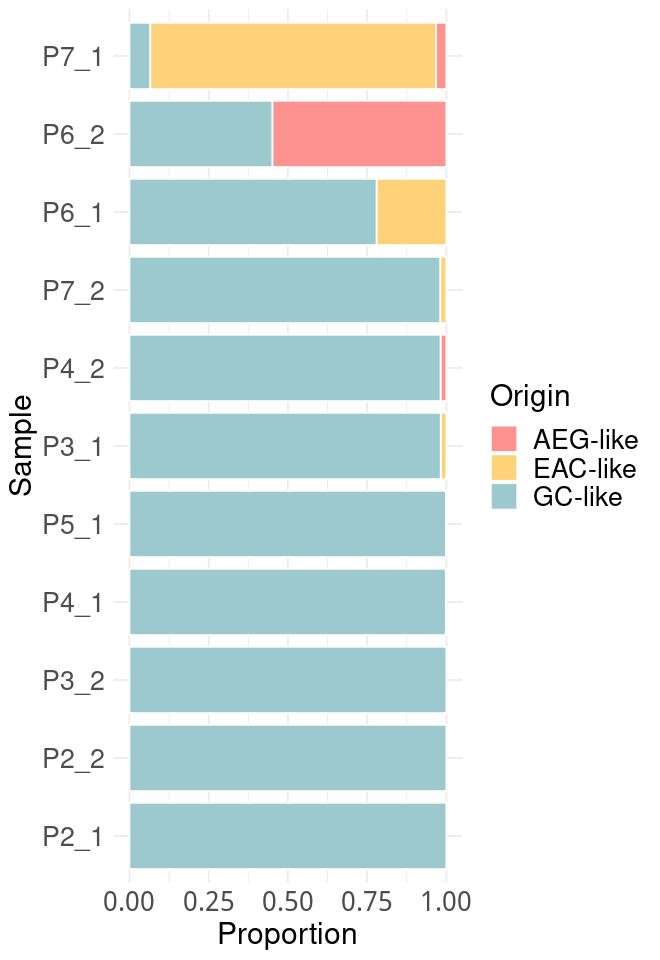

In [81]:
pdf(file = './Fig_pdf/Fig2f_2.pdf', width=5.5, height=8)
options(repr.plot.width = 5.5, repr.plot.height = 8)

plot_df = as.data.frame(Mal_obj@meta.data[,c('assign.origin', 'Sample', 'Patient')] %>%
                        group_by(assign.origin) %>% count(Sample))

p = ggplot(plot_df, aes(fill=assign.origin, y=n, x=Sample)) + 
  geom_bar(position="fill", stat="identity", color='white', width=0.85) + 
  theme_minimal() + theme(legend.text = element_text(size = 16), 
                          legend.title = element_text(size = 18), 
                          axis.text=element_text(size=16),
                          axis.title=element_text(size=18)) +
scale_fill_manual(name='Origin', values = c("Mal_AGEJ_like" = "#fd9291", "Mal_EAC_like" = "#ffd27a", 'Mal_GC_like'='#9cc9ce'),labels=c("AEG-like", "EAC-like", "GC-like")) +
# scale_fill_discrete(name = "Potential origin", labels = c("AEG-like", "EAC-like", "GC-like")) + 
  ylab('Proportion') +   coord_flip() +
scale_x_discrete(
  limits=c('P2_1','P2_2','P3_2','P4_1','P5_1','P3_1','P4_2','P7_2','P6_1','P6_2','P7_1'))
p
dev.off()
p

png 
  2

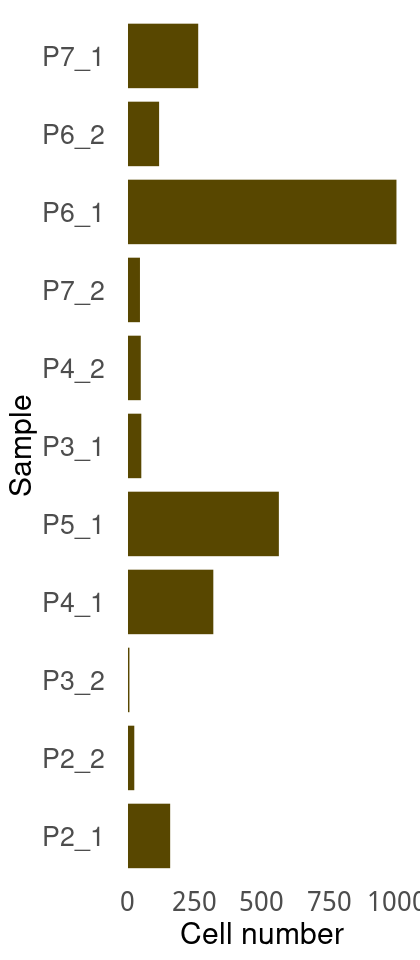

In [121]:
pdf(file = './Fig_pdf/Fig2f_3.pdf', width=3.5, height=8)
options(repr.plot.width = 3.5, repr.plot.height = 8)

plot_df = as.data.frame(Mal_obj@meta.data[,c('assign.origin', 'Sample', 'Patient')] %>%
                        count(Sample))
plot_df$n = c(163, 30, 56, 12, 323, 54, 566, 1002, 122, 267, 51)
p = ggplot(plot_df, aes(y=n, x=Sample)) + 
  geom_bar(stat="identity", color='white', width=0.85, fill='#584700') + 
  theme_minimal() + theme(
      panel.grid=element_blank(),
      legend.position='none',
      legend.text = element_text(size = 16), 
                          legend.title = element_text(size = 18), 
                          axis.text=element_text(size=16),
                          axis.title=element_text(size=18)) +
  ylab('Cell number') +   coord_flip() +
scale_x_discrete(
  limits=c('P2_1','P2_2','P3_2','P4_1','P5_1','P3_1','P4_2','P7_2','P6_1','P6_2','P7_1')) 
# scale_y_break(c(70,300)) + scale_y_break(c(600,2500))
p
dev.off()
p

In [123]:
Mal_obj@meta.data[,c('assign.origin', 'Sample', 'Patient')] %>%count(Sample)

Sample,n
<chr>,<int>
P2_1,463
P2_2,30
P3_1,56
P3_2,12
P4_1,3238
P4_2,54
P5_1,5662
P6_1,10029
P6_2,122


## Fig 2g

png 
  2

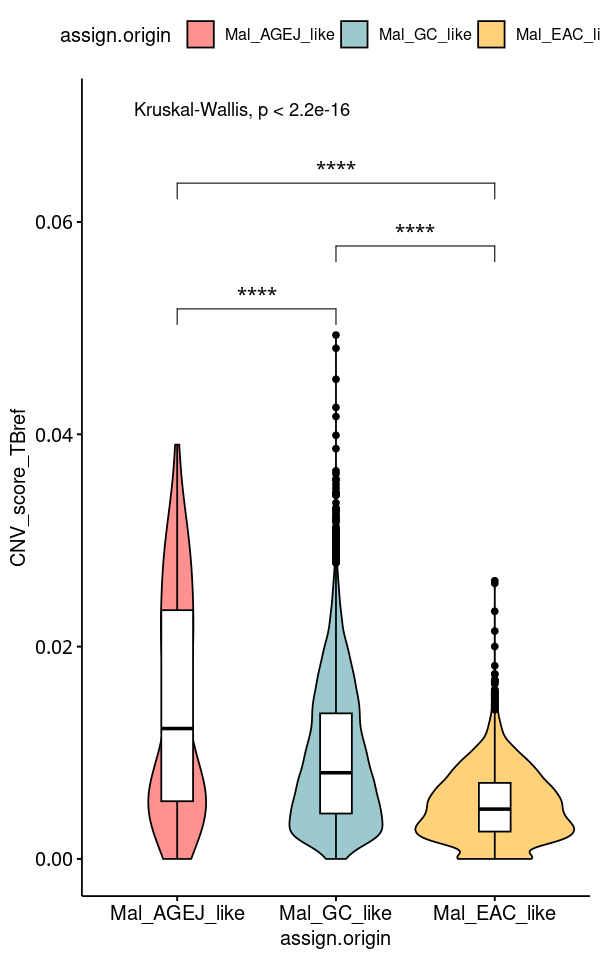

In [160]:
plot_df = Mal_obj@meta.data[,c('assign.origin','CNV_score_TBref')]
plot_df = plot_df[plot_df$CNV_score_TBref <= 0.05,]

pdf(file = './Fig_pdf/Fig2g.pdf', width=5, height=8)
options(repr.plot.width = 5, repr.plot.height = 8)
p = ggviolin(plot_df, x = "assign.origin", y = "CNV_score_TBref", fill = "assign.origin",
         palette = c("#fd9291", "#9cc9ce", "#ffd27a"),
             # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             order=c('Mal_AGEJ_like','Mal_GC_like','Mal_EAC_like'),
         add = "boxplot", add.params = list(fill = "white"))+
  stat_compare_means(comparisons = list(c('Mal_AGEJ_like','Mal_GC_like'),c('Mal_EAC_like','Mal_GC_like'),c('Mal_AGEJ_like','Mal_EAC_like')),
                     label = "p.signif")+ 
  stat_compare_means(label.y = 0.07) 
# "#fd9291", "Mal_EAC_like" = "#ffd27a", 'Mal_GC_like'='#9cc9ce'
p
dev.off()
p

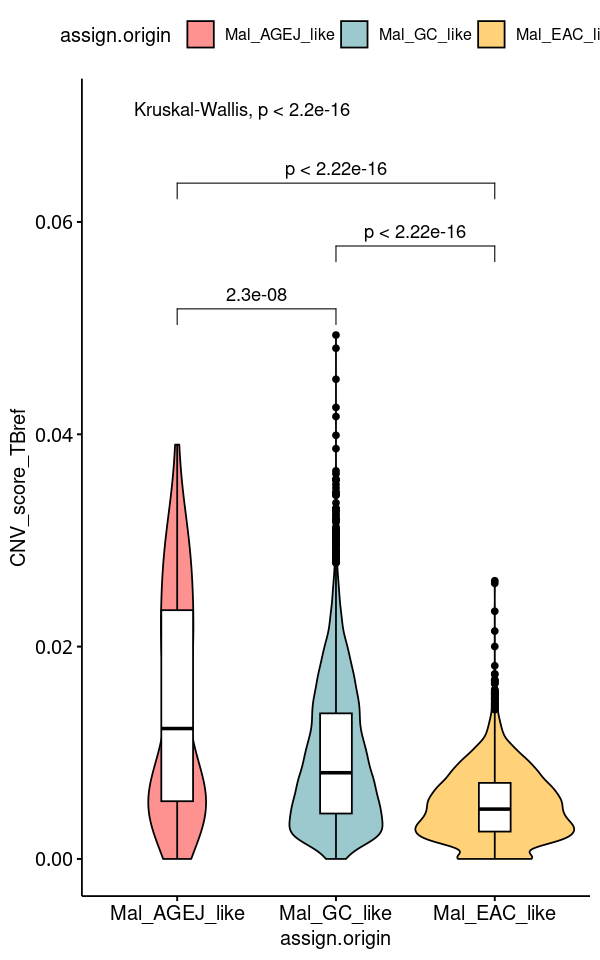

In [210]:
plot_df = Mal_obj@meta.data[,c('assign.origin','CNV_score_TBref')]
plot_df = plot_df[plot_df$CNV_score_TBref <= 0.05,]

# pdf(file = './Fig_pdf/Fig2g.pdf', width=5, height=8)
options(repr.plot.width = 5, repr.plot.height = 8)
p = ggviolin(plot_df, x = "assign.origin", y = "CNV_score_TBref", fill = "assign.origin",
         palette = c("#fd9291", "#9cc9ce", "#ffd27a"),
             # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             order=c('Mal_AGEJ_like','Mal_GC_like','Mal_EAC_like'),
         add = "boxplot", add.params = list(fill = "white"))+
  stat_compare_means(comparisons = list(c('Mal_AGEJ_like','Mal_GC_like'),c('Mal_EAC_like','Mal_GC_like'),c('Mal_AGEJ_like','Mal_EAC_like')),
                     label = "p")+ 
  stat_compare_means(label.y = 0.07) 
# "#fd9291", "Mal_EAC_like" = "#ffd27a", 'Mal_GC_like'='#9cc9ce'
p
# dev.off()
# p

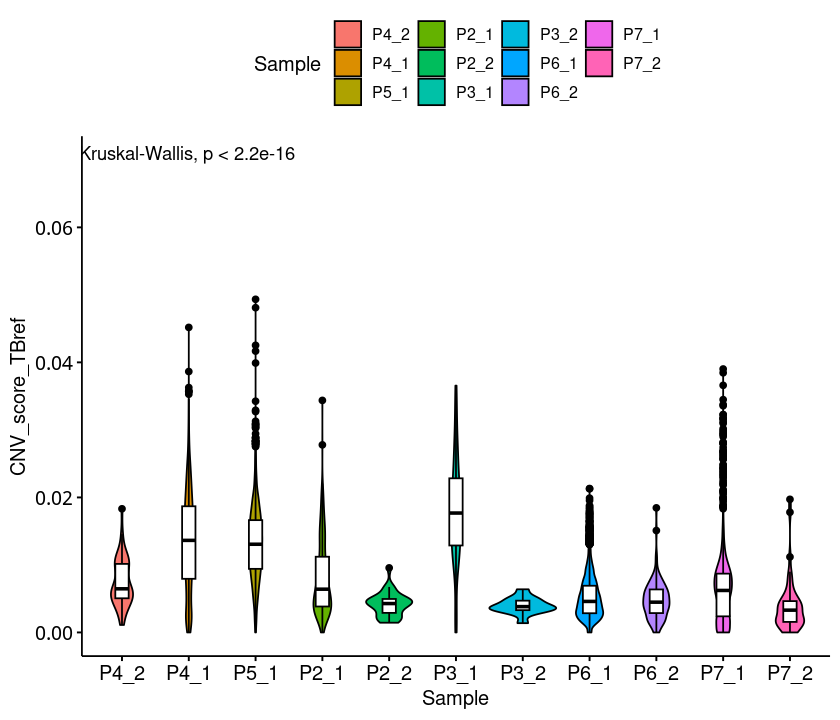

In [216]:
plot_df = Mal_obj@meta.data[,c('assign.origin','CNV_score_TBref','Sample')]
plot_df = plot_df[plot_df$CNV_score_TBref <= 0.05,]

# pdf(file = './Fig_pdf/Fig2g.pdf', width=5, height=8)
options(repr.plot.width = 7, repr.plot.height = 6)
p = ggviolin(plot_df, x = "Sample", y = "CNV_score_TBref", fill = "Sample",
         # palette = c("#fd9291", "#9cc9ce", "#ffd27a"),
             # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             # order=c('Mal_AGEJ_like','Mal_GC_like','Mal_EAC_like'),
         add = "boxplot", add.params = list(fill = "white"))+
  stat_compare_means(label.y = 0.07) 
# "#fd9291", "Mal_EAC_like" = "#ffd27a", 'Mal_GC_like'='#9cc9ce'
p
# dev.off()
# p

## Fig 2h

png 
  2

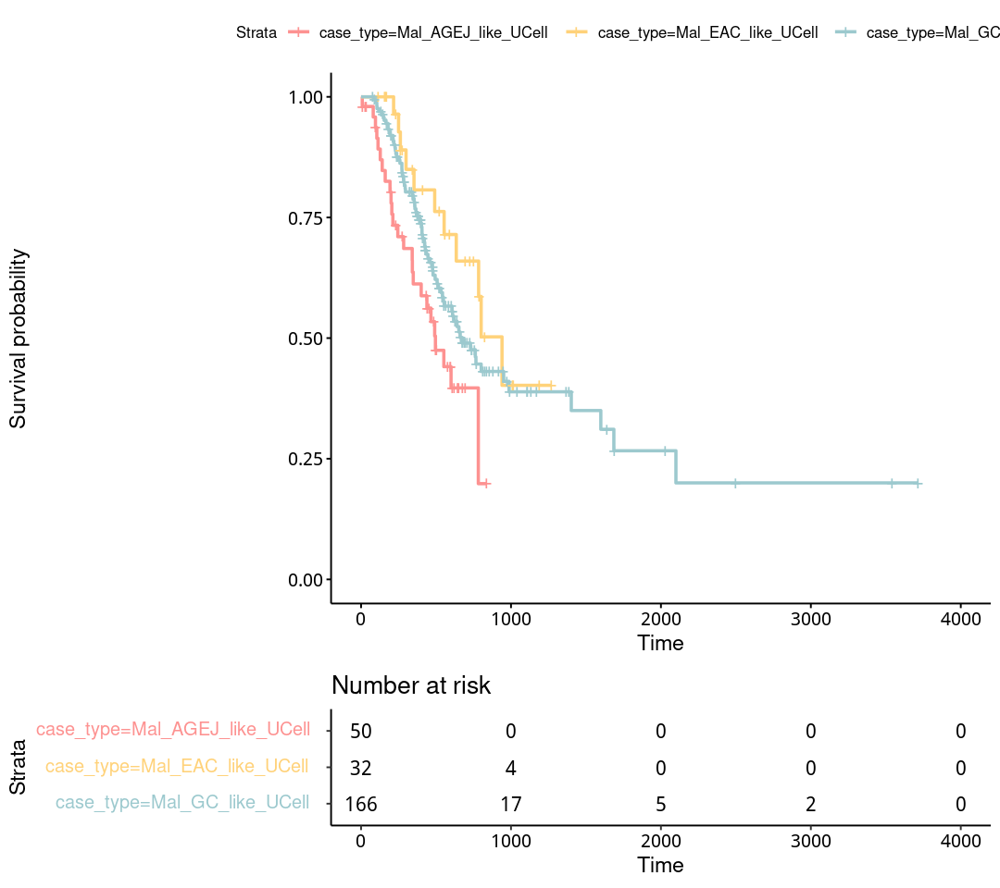

In [195]:
tmp_survival_1 = read.delim('~/project//TongjiHospital//public_datasets//TCGA_STAD_ESCA/survival_AGEJ_GC.tsv',
                            sep='\t',
                           check.names=F)
tmp_survival_2 = read.delim('~/project//TongjiHospital//public_datasets//TCGA_STAD_ESCA/survival_AGEJ_EAC.tsv',
                            sep='\t', 
                           check.names=F)

tmp_survival_merge = rbind(tmp_survival_1, tmp_survival_2[tmp_survival_2$case_type == 'Mal_EAC_like_UCell',])

pdf(file = './Fig_pdf/Fig2h.pdf', width=9, height=8)
options(repr.plot.width=9, repr.plot.height=8)

tmp_surv <- Surv(tmp_survival_merge$OS_MONTHS,tmp_survival_merge$OS_STATUS)
tmp_kmfit1 <- survfit(tmp_surv~case_type, data = tmp_survival_merge) 

p = ggsurvplot(tmp_kmfit1,
               palette = c("#fd9291", "#ffd27a", "#9cc9ce"),
               conf.int =F, pval = F, risk.table=T)
p
dev.off()
p

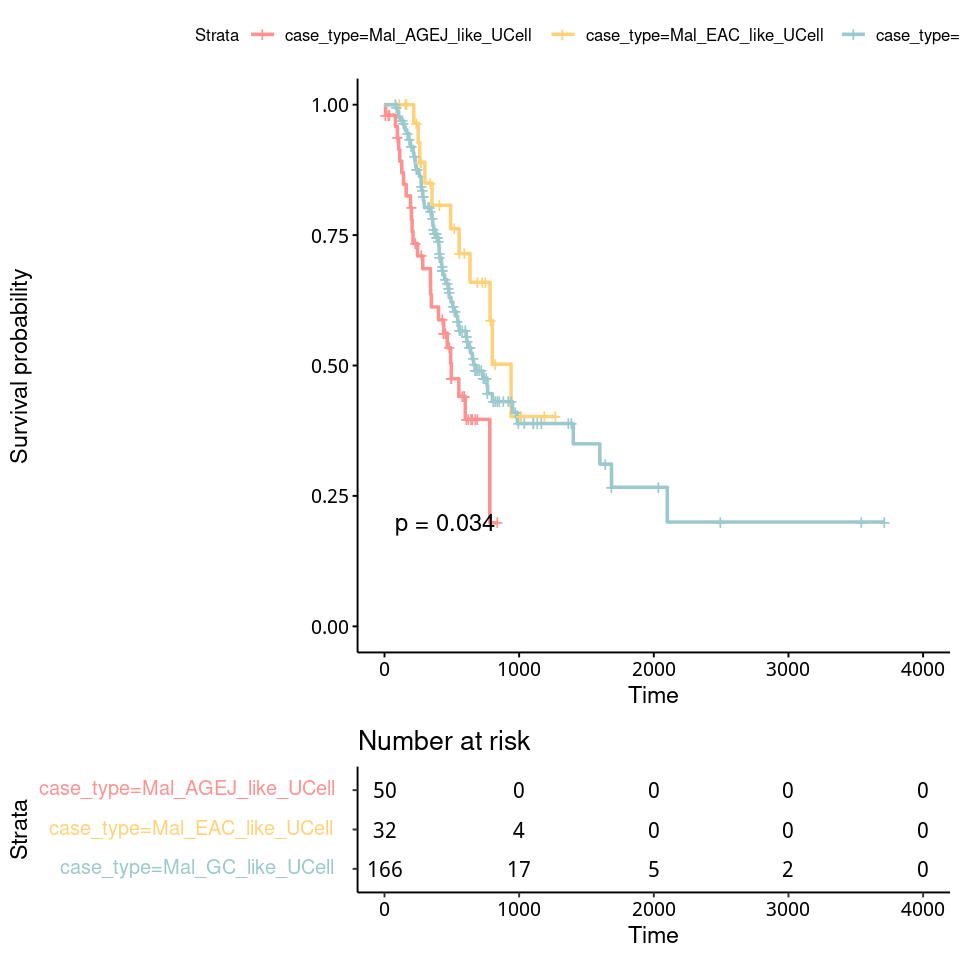

In [176]:
ggsurvplot(tmp_kmfit1,
               palette = c("#fd9291", "#ffd27a", "#9cc9ce"),
               conf.int =F, pval = T, risk.table=T)


In [ ]:
#Multivariate analyses

## Fig 2i

In [193]:
subset_markers = read.delim(file='./Epi_subset/Malignant_subset_markers.tsv', sep='\t',
           )

pdf(file = './Fig_pdf/Fig2i.pdf', width=8, height=8)

options(repr.plot.width=8, repr.plot.height=8)

diff.gene.Mal_subset = subset_markers[subset_markers$cluster == 'Mal_AGEJ_like',]
# diff.gene.Mal_subset = AGEJ_like_markers
# only label selected genes on the plot
# select by pvalue & log2FC
diff.gene.Mal_subset$log10_p_adj = -log10(diff.gene.Mal_subset$p_val_adj)
select_gene = rownames(diff.gene.Mal_subset[which(diff.gene.Mal_subset$log10_p_adj >= 150 & abs(diff.gene.Mal_subset$avg_log2FC) > 2),])

EnhancedVolcano(diff.gene.Mal_subset,
                lab = rownames(diff.gene.Mal_subset),
                selectLab = c(),
                title='',
                x = 'avg_log2FC',
                y = 'p_val_adj',
                col=c('gray', 'gray', 'gray', '#c52a52'),
                pointSize = 5,
                labSize = 0,
               # labhjust = -0.1,
               # labvjust = 0.5,
                colAlpha = 0.8)

dev.off()

Warning message:
“One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value...”


png 
  2

Warning message:
“One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value...”


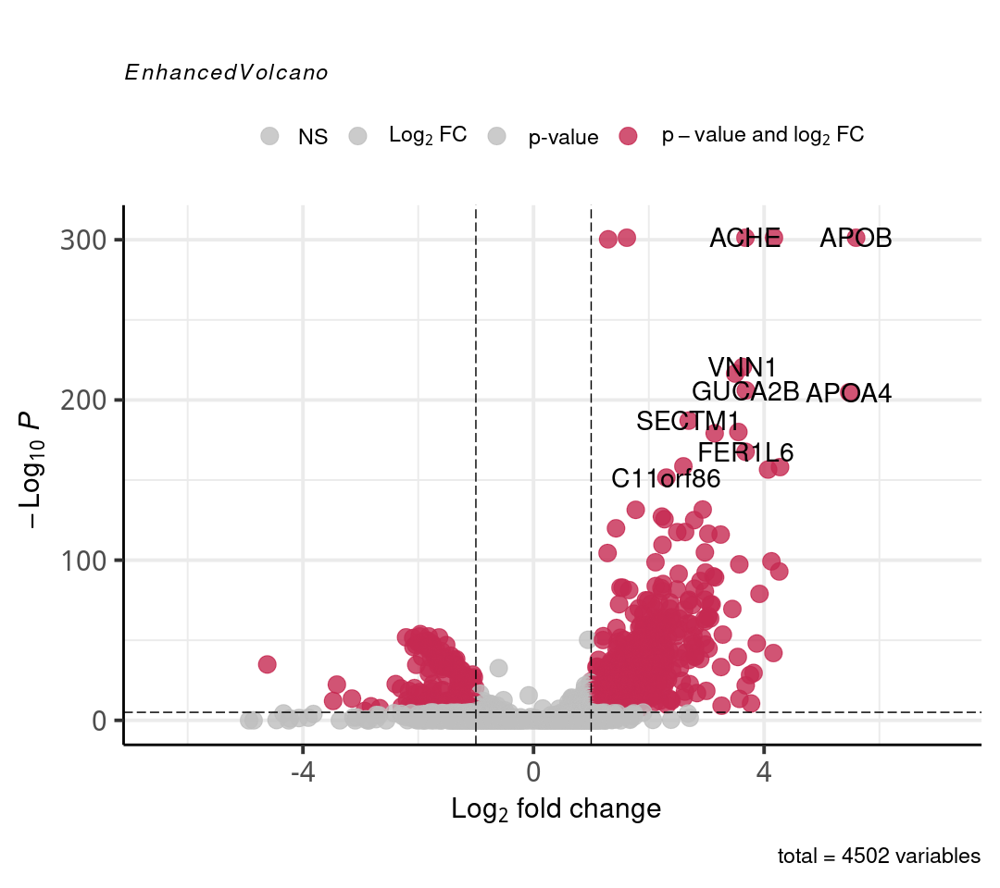

In [199]:
EnhancedVolcano(diff.gene.Mal_subset,
                lab = rownames(diff.gene.Mal_subset),
                selectLab = select_gene,
                title='',
                x = 'avg_log2FC',
                y = 'p_val_adj',
                # ylim=c(0,200),
                col=c('gray', 'gray', 'gray', '#c52a52'),
                pointSize = 5,
                labSize = 6,
               # labhjust = -0.1,
               # labvjust = 0.5,
                colAlpha = 0.8)


In [206]:
tail(diff.gene.Mal_subset[order(diff.gene.Mal_subset$avg_log2FC),], n = 10)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene,log10_p_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
CEACAM5.1,3.720415e-53,3.872780,0.804,0.435,1.067871e-48,Mal_AGEJ_like,CEACAM5,47.97148
TFF1,3.934553e-84,3.920224,0.730,0.189,1.129335e-79,Mal_AGEJ_like,TFF1,78.94718
MUC5AC.1,9.806261e-162,4.069311,0.528,0.052,2.814691e-157,Mal_AGEJ_like,MUC5AC,156.55057
MUC2,1.910874e-104,4.126985,0.288,0.023,5.484782e-100,Mal_AGEJ_like,MUC2,99.26084
CA1.1,3.443610e-47,4.162410,0.387,0.088,9.884193e-43,Mal_AGEJ_like,CA1,42.00506
TMPRSS15,0.000000e+00,4.171193,0.282,0.001,0.000000e+00,Mal_AGEJ_like,TMPRSS15,Inf
SLC26A3,4.107094e-98,4.263398,0.350,0.037,1.178859e-93,Mal_AGEJ_like,SLC26A3,92.92854
MUC3A.1,2.860711e-163,4.276576,0.877,0.172,8.211098e-159,Mal_AGEJ_like,MUC3A,158.08560
APOA4,5.921279e-210,5.476222,0.147,0.003,1.699585e-205,Mal_AGEJ_like,APOA4,204.76966


In [202]:
diff.gene.Mal_subset[select_gene,]

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene,log10_p_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
APOB,0.000000e+00,5.595700,0.294,0.006,0.000000e+00,Mal_AGEJ_like,APOB,Inf
TMPRSS15,0.000000e+00,4.171193,0.282,0.001,0.000000e+00,Mal_AGEJ_like,TMPRSS15,Inf
ACHE,0.000000e+00,3.676199,0.644,0.023,0.000000e+00,Mal_AGEJ_like,ACHE,Inf
VNN1,8.766946e-226,3.630826,0.528,0.038,2.516376e-221,Mal_AGEJ_like,VNN1,220.5992
RBP4,1.153564e-221,3.498053,0.393,0.021,3.311076e-217,Mal_AGEJ_like,RBP4,216.4800
GUCA2B,3.700609e-211,3.683508,0.141,0.002,1.062186e-206,Mal_AGEJ_like,GUCA2B,205.9738
APOA4,5.921279e-210,5.476222,0.147,0.003,1.699585e-205,Mal_AGEJ_like,APOA4,204.7697
SECTM1,2.933233e-192,2.691661,0.387,0.023,8.419260e-188,Mal_AGEJ_like,SECTM1,187.0747
CTSE,3.417344e-185,3.553427,0.583,0.056,9.808804e-181,Mal_AGEJ_like,CTSE,180.0084


In [200]:
select_gene

[1] "APOB"     "TMPRSS15" "ACHE"     "VNN1"     "RBP4"     "GUCA2B"  
 [7] "APOA4"    "SECTM1"   "CTSE"     "CDKN2B.1" "FER1L6"   "KLF2"    
[13] "MUC3A.1"  "MUC5AC.1" "C11orf86"

# Fig 3

## Fig 3a

In [242]:
cyto_res = readRDS('./Epi_subset/CytoTrace/results.rds')
Mal_obj@meta.data$CytoTrace = cyto_res$CytoTRACE[colnames(Mal_obj)]

png 
  2

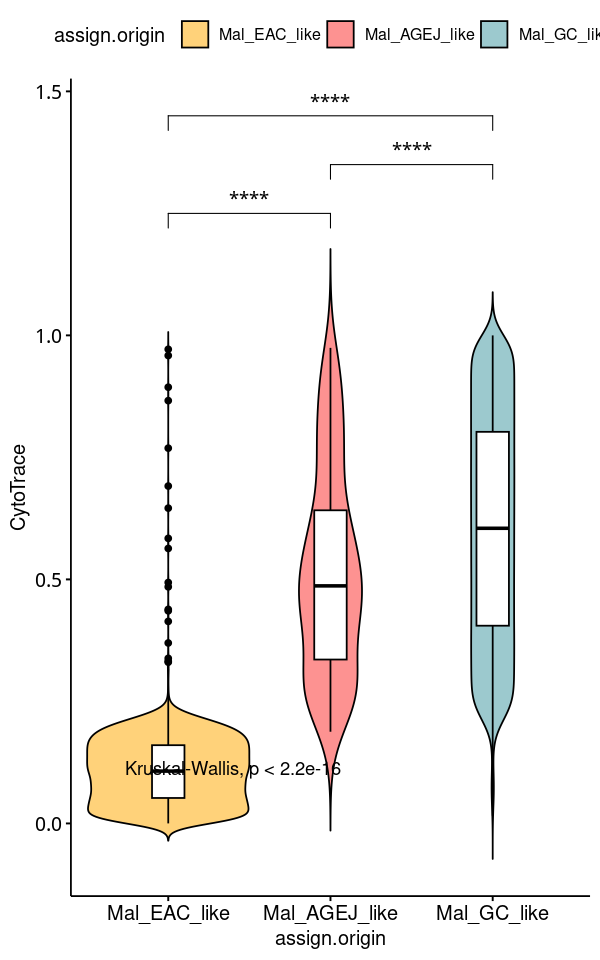

In [262]:
plot_df = Mal_obj@meta.data[,c('assign.origin','CytoTrace')]

pdf(file = './Fig_pdf/Fig3a.pdf', width=5, height=8)
options(repr.plot.width = 5, repr.plot.height = 8)
p = ggviolin(plot_df, x = "assign.origin", y = "CytoTrace", fill = "assign.origin",
         palette = c("#ffd27a", "#fd9291", "#9cc9ce"),
             # color='darkgrey',
             trim=F,
             width=1,
             # error.plot='none',
             error.plot='errorbar',
             remove='points',
             order=c('Mal_EAC_like','Mal_AGEJ_like','Mal_GC_like'),
         add = "boxplot", add.params = list(fill = "white"))+
  stat_compare_means(comparisons = list(c('Mal_AGEJ_like','Mal_EAC_like'), c('Mal_AGEJ_like','Mal_GC_like'),c('Mal_EAC_like','Mal_GC_like')),
                     label = "p.signif",
                     label.y=1.2, step.increase=0.1)+ 
  stat_compare_means(label.y = 0.1) 
# "#fd9291", "Mal_EAC_like" = "#ffd27a", 'Mal_GC_like'='#9cc9ce'
p
dev.off()
p

## Fig 3b

In [265]:
plotCytoGenes(cyto_res, numOfGenes = 10,
              colors = c("#fd9291", "#9cc9ce"),
              outputDir = './Fig_pdf/'
             )

png 
  2

## Fig 3c

In [141]:
EMT_genes = read.delim('../public_datasets//EMT_genes.csv',sep=',',header=F)

colnames(EMT_genes) = c('EMT')

EMT_sig_list = list(EMT=EMT_genes)

Mal_obj = AddModuleScore_UCell(Mal_obj, assay = 'SCT',slot = 'data',
                               features = EMT_sig_list, ncores = 4)


In [143]:
tmp_l = c()
tmp_source = c()
tmp_patient = c()
tmp_gep_type = c()
for (tmp_c in paste0(c('Epi2_terminal_diff','Oxd','Stress','EMT'),'_UCell')){
    tmp_l = c(tmp_l,Mal_obj@meta.data[,tmp_c])
    tmp_source = c(tmp_source, as.vector(Mal_obj@meta.data$assign.origin))
    tmp_patient = c(tmp_patient, as.vector(Mal_obj@meta.data$Patient))
    tmp_gep_type = c(tmp_gep_type, rep(tmp_c, dim(Mal_obj@meta.data)[1]))
}


plot_df = data.frame(GEP_usage = tmp_l,
                     SubType=tmp_source,
                     Patient=tmp_patient,
                     GEP_type = factor(tmp_gep_type,
                                       levels=c('Epi2_terminal_diff_UCell','EMT_UCell','Oxd_UCell','Stress_UCell'),
                                       labels=c('Terminal diff','EMT','Oxd','Stress response')
                                      ))

In [148]:
pdf(file = './Fig_pdf/Fig3c.pdf', width=10, height=8)
options(repr.plot.width=10, repr.plot.height=8)
p = ggboxplot(plot_df, x="SubType", y="GEP_usage", fill="SubType",
          bxp.errorbar=T, outlier.shape=NA,
          add=c('mean'),
              palette = c("#9cc9ce", "#fd9291", "#ffd27a"),
              add.params=list())
facet(p, facet.by='GEP_type', scales='free_y', nrow=2) + 
stat_compare_means(mapping=aes(group=SubType), comparisons = list(c('Mal_GC_like','Mal_AGEJ_like'),
                                                                   c('Mal_AGEJ_like','Mal_EAC_like'),
                                                                  c('Mal_GC_like','Mal_EAC_like')),
                   label = 'p.signif',
                   label.x=1.5,
                   # label.y = c(0.5), 
                   step.increase=0.15, bracket.size=0.5, size=6, tip.length=0.05) +
theme_bw() +
  theme(text=element_text(size=18),
        axis.text.x = element_text(size = 18,angle=90,hjust=1, vjust=0.5),
      strip.text.x = element_text(size = 18,face="bold"),
       panel.spacing.x = unit(0.75, "cm")) + 
scale_y_continuous(expand = expansion(mult = c(0.05, 0.15))) + 
scale_x_discrete(limits=c('Mal_EAC_like','Mal_AGEJ_like','Mal_GC_like'), labels=c('EAC-like','AEG-like','GAC-like'))

dev.off()

Warning message in (function (mapping = NULL, data = NULL, geom = "boxplot", position = "dodge2", :
“Ignoring unknown aesthetics: fill”


png 
  2

Warning message in (function (mapping = NULL, data = NULL, geom = "boxplot", position = "dodge2", :
“Ignoring unknown aesthetics: fill”


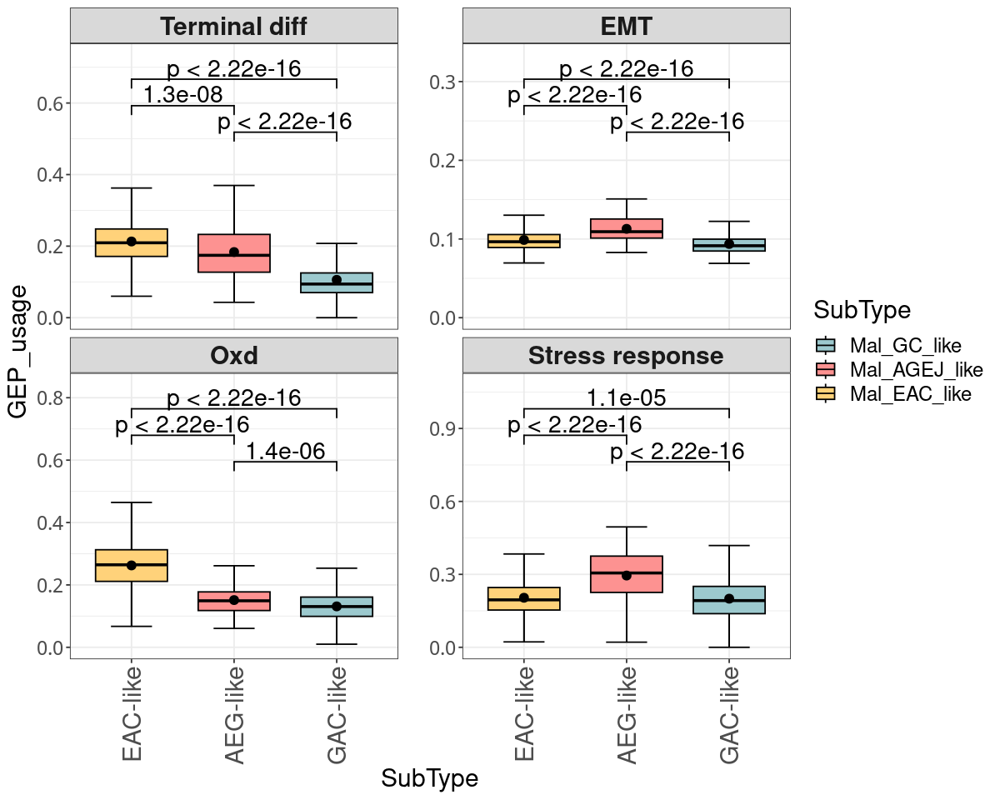

In [147]:
# pdf(file = './Fig_pdf/Fig3c_fat.pdf', width=10, height=8)
options(repr.plot.width=10, repr.plot.height=8)
p = ggboxplot(plot_df, x="SubType", y="GEP_usage", fill="SubType",
          bxp.errorbar=T, outlier.shape=NA,
          add=c('mean'),
              palette = c("#9cc9ce", "#fd9291", "#ffd27a"),
              add.params=list())
facet(p, facet.by='GEP_type', scales='free_y', nrow=2) + 
stat_compare_means(mapping=aes(group=SubType), comparisons = list(c('Mal_GC_like','Mal_AGEJ_like'),
                                                                   c('Mal_AGEJ_like','Mal_EAC_like'),
                                                                  c('Mal_GC_like','Mal_EAC_like')),
                   label = 'p.adj',
                   label.x=1.5,
                   # label.y = c(0.5), 
                   step.increase=0.15, bracket.size=0.5, size=6, tip.length=0.05) +
theme_bw() +
  theme(text=element_text(size=18),
        axis.text.x = element_text(size = 18,angle=90,hjust=1, vjust=0.5),
      strip.text.x = element_text(size = 18,face="bold"),
       panel.spacing.x = unit(0.75, "cm")) + 
scale_y_continuous(expand = expansion(mult = c(0.05, 0.15))) + 
scale_x_discrete(limits=c('Mal_EAC_like','Mal_AGEJ_like','Mal_GC_like'), labels=c('EAC-like','AEG-like','GAC-like'))

# dev.off()

## Fig 3d

In [279]:
l3_avg_compass_df = read.delim('./Compass/assign_level3_avg_SCT_reactions.tsv', sep='\t',
                               check.names = F, row.names=1)
reaction_metadata = read.delim("/fs//home//liuzhaoyang//biosoft/Compass/compass/Resources/Recon2_export/rxn_md.csv",
                                sep=',', row.names=1
                               )

# #This function is repeated here for clarity
# def get_reaction_consistencies(compass_reaction_penalties, min_range=1e-3):
#     """
#         Converts the raw penalties outputs of compass into scores per reactions where higher numbers indicate more activity
#     """
#     df = -np.log(compass_reaction_penalties + 1)
#     df = df[df.max(axis=1) - df.min(axis=1) >= min_range]
#     df = df - df.min().min()
#     return df

get_reaction_consistencies = function(compass_reaction_penalties, min_range=1e-3) {
    tmp_df = -log(compass_reaction_penalties+1)
    tmp_flag = apply(tmp_df, FUN = max, MARGIN = 1) - apply(tmp_df, FUN = min, MARGIN = 1)
    tmp_df = tmp_df[tmp_flag >= min_range,]
    tmp_df = tmp_df - min(tmp_df)
    
    return(tmp_df)
    
}

l3_avg_compass_score = get_reaction_consistencies(l3_avg_compass_df)

l3_avg_compass_score$rxn_name = gsub('_pos','',rownames(l3_avg_compass_score))
l3_avg_compass_score$rxn_name = gsub('_neg','',l3_avg_compass_score$rxn_name)

reaction_metadata$rxn_name = rownames(reaction_metadata)
reaction_metadata = reaction_metadata[reaction_metadata$rxn_name %in% l3_avg_compass_score$rxn_name,]

tmp_rownames = rownames(l3_avg_compass_score)
l3_avg_compass_score = full_join(l3_avg_compass_score, reaction_metadata, by = 'rxn_name',
                                 keep = TRUE)
rownames(l3_avg_compass_score) = tmp_rownames

# remove rxn with no EC number
l3_avg_compass_score = l3_avg_compass_score[l3_avg_compass_score$rxn_EC_number != 'N/A',]
# remove rxn with low confidence
l3_avg_compass_score = l3_avg_compass_score[l3_avg_compass_score$rxn_confidence %in% c('0','4'),]


In [288]:
# l3_avg_compass_score = read.delim('./Compass/l3_avg_compass_score.tsv', sep='\t', row.names=1)
tmp_df = l3_avg_compass_score[order(l3_avg_compass_score$subsystem), c('Mal-EAC-like','Mal-GC-like','Mal-AEG-like','subsystem')]
tmp_df$subsystem = with(tmp_df, reorder(subsystem, `Mal-AEG-like`, median))
top10_subsystem = tail(levels(tmp_df$subsystem), n=10)

tmp_df = l3_avg_compass_score[order(l3_avg_compass_score$subsystem), c('Mal-EAC-like','Mal-GC-like','Mal-AEG-like','subsystem')]
tmp_df = tmp_df[tmp_df$subsystem %in% unique(c(top10_subsystem, c('Cholesterol metabolism', 'Citric acid cycle',
                                        'Fatty acid oxidation',
  'Fatty acid synthesis', 'Glycolysis/gluconeogenesis', 'Galactose metabolism',
  'lutamate metabolism', 'Nucleotide interconversion', 
  'Oxidative phosphorylation', 'Purine catabolism', 'Urea cycle'
))),]

tmp_df = tmp_df %>% group_by(subsystem) %>% summarize(
    Mal_EAC_like = mean(`Mal-EAC-like`),
    Mal_AEG_like = mean(`Mal-AEG-like`),
    Mal_GC_like = mean(`Mal-GC-like`)   
)
tmp_df = as.data.frame(tmp_df)

rownames(tmp_df) = tmp_df$subsystem

pdf(file = './Fig_pdf/Fig3d.pdf', width=5, height=12)
options(repr.plot.width=5, repr.plot.height=12)
p = pheatmap(tmp_df[,2:4], 
             color=colorRampPalette(rev(c('#cf3759', '#ffffe0','#4771b2')))(200),
         border_color='white',
         treeheight_row=25,
             treeheight_col=25,
         cluster_rows=T, show_rownames=F, scale='row',
        cellwidth=35, cellheight=35, fontsize=20)
p
dev.off()

Warning message:
“The input is a data frame, convert it to the matrix.”


png 
  2

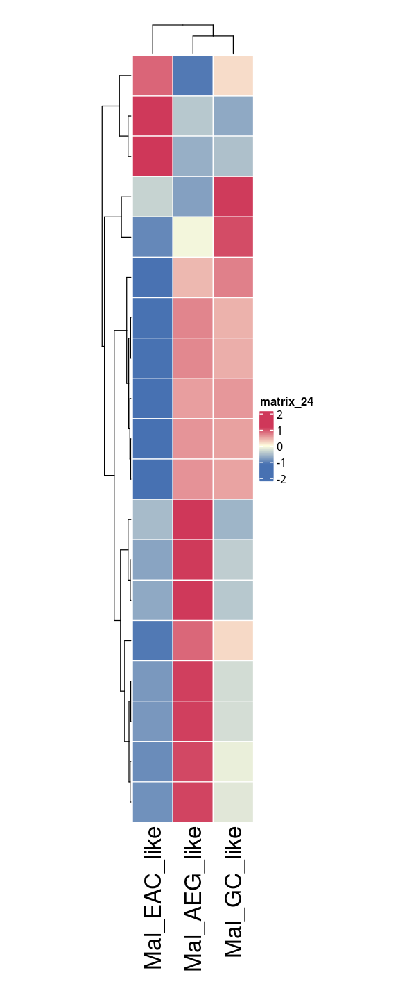

In [289]:
p

In [295]:
options(repr.plot.width=8, repr.plot.height=12)
p = pheatmap(tmp_df[,2:4], 
             color=colorRampPalette(rev(c('#cf3759', '#ffffe0','#4771b2')))(200),
         border_color='white',
         treeheight_row=25,
             treeheight_col=25,
         cluster_rows=T, show_rownames=T, scale='row',
        cellwidth=35, cellheight=35, fontsize=20)
p


Warning message:
“The input is a data frame, convert it to the matrix.”


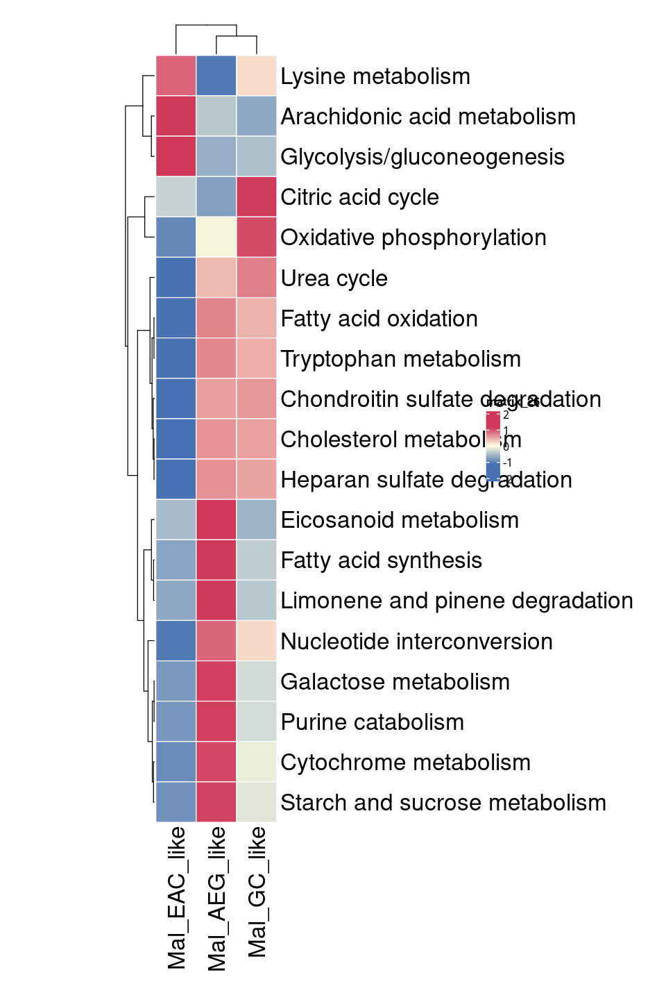

In [296]:
p

In [48]:
# ---------------------- #
# select top metabolites #
# ---------------------- #
compass_metabolite = read.delim('./Compass/mal_only_compass_metabolite_intense.tsv', sep='\t', row.names = 1, check.names = F)
compass_metabolite_zscore = read.delim('./Compass/mal_only_compass_metabolite_intense_zscore.tsv', sep='\t', row.names = 1, check.names = F)
met_md = read.delim('~/biosoft/Compass/compass/Resources/Recon2_export/met_md.csv', sep=',', row.names = 1, check.names = F)

colnames(compass_metabolite_zscore) = paste0(colnames(compass_metabolite_zscore),'-zscore')
compass_metabolite_zscore = compass_metabolite_zscore[rownames(compass_metabolite),]
compass_metabolite_zscore = cbind(compass_metabolite_zscore, compass_metabolite)

In [72]:
ntop=100
top_meta_list = list()
for (tmp_ct in c('Mal-EAC-like','Mal-GC-like','Mal-AEG-like')){
    tmp_intense = compass_metabolite_zscore[which((compass_metabolite_zscore[,tmp_ct] > 0) & (compass_metabolite_zscore[,paste0(tmp_ct,'-zscore')] > 0)),c(tmp_ct,paste0(tmp_ct,'-zscore'))]
    tmp_intense = head(tmp_intense[order(tmp_intense[,tmp_ct],tmp_intense[,paste0(tmp_ct,'-zscore')], decreasing=T),], n=ntop)
    tmp_com = unlist(lapply(rownames(tmp_intense), function(x) paste0(substr(x,1,(nchar(x)-2)),'[',substr(x,nchar(x),nchar(x)),']')))
    tmp_id = unique(met_md[tmp_com,'keggID'])
    tmp_id = tmp_id[nchar(tmp_id) > 0]
    top_meta_list[[tmp_ct]] = tmp_id
        
}
                            
# -------------------------- #
# enrich using MetaboAnalyst #
# -------------------------- #                            

In [107]:
ntop=10
select_terms = c()
for (tmp_ct in c('EAC-like','GAC-like','AEG-like')){
    tmp_df = read.delim(paste0('../Metabolomics/MetaboAnalyst/', gsub('-','_',tmp_ct), '/msea_ora_result.csv'), sep=',', row.names = 1, check.names = F)
    tmp_df[,tmp_ct] = tmp_df$hits / tmp_df$expected
    tmp_df$pathway = rownames(tmp_df)
    
    select_terms = c(select_terms, head(tmp_df[order(tmp_df[,tmp_ct], decreasing=T),], n=ntop)$pathway)
    
    if (tmp_ct == 'EAC-like'){
        plot_df = tmp_df[,c('pathway',tmp_ct)]
    } else {
        plot_df = full_join(plot_df, tmp_df[,c('pathway',tmp_ct)])
    }
}

plot_df = plot_df[plot_df$pathway %in% unique(select_terms),]
plot_df[is.na(plot_df)] = 0
rownames(plot_df) = plot_df$pathway

Joining with `by = join_by(pathway)`
Joining with `by = join_by(pathway)`


Warning message:
“The input is a data frame, convert it to the matrix.”


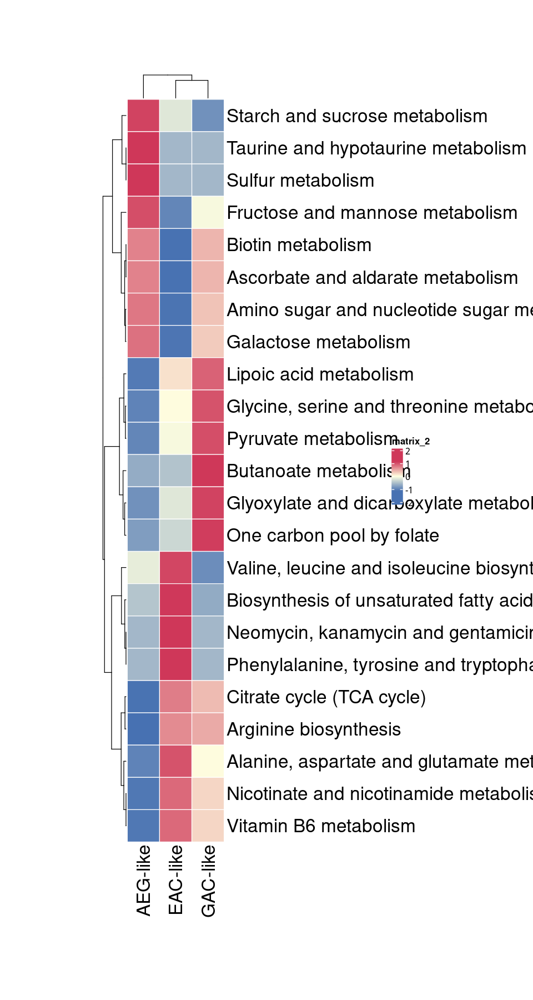

In [109]:
options(repr.plot.width=8, repr.plot.height=15)
p = pheatmap(plot_df[,2:4], 
             color=colorRampPalette(rev(c('#cf3759', '#ffffe0','#4771b2')))(200),
         border_color='white',
         treeheight_row=25,
             treeheight_col=25,
         cluster_rows=T, show_rownames=T, scale='row',
        cellwidth=35, cellheight=35, fontsize=20)
p

## Fig 3e

- Eicosanoid: 类花生酸
- limonene and pinene: 柠檬烯与蒎烯
- Heparin sulfate: 硫酸肝素
- starch and sucrose: 淀粉与蔗糖

In [2]:
compass_metabolite = read.delim('./Compass/mal_only_compass_metabolite_intense.tsv', sep='\t', row.names = 1, check.names = F)
compass_metabolite_zscore = read.delim('./Compass/mal_only_compass_metabolite_intense_zscore.tsv', sep='\t', row.names = 1, check.names = F)

In [175]:
plot_df = data.frame(list('Intense'=compass_metabolite[,'Mal-AEG-like'],
                        'zscore'=compass_metabolite_zscore[,'Mal-AEG-like']
                       ))
rownames(plot_df) = rownames(compass_metabolite)

plot_df$group = 'NS'
plot_df$group[((abs(plot_df$Intense) > 25) & (plot_df$`zscore` > 0.5))] = 'Up'
plot_df$group[((abs(plot_df$Intense) > 25) & (plot_df$`zscore` < -0.5))] = 'Down'
plot_df$met = rownames(plot_df)
select_met = rownames(plot_df[((abs(plot_df$Intense) > 25) & (abs(plot_df$`zscore`) > 0.5)),])

In [176]:
pdf(file = './Fig_pdf/Fig3e.pdf', width=9, height=8)
options(repr.plot.width=9, repr.plot.height=8)
p = ggscatter(plot_df, x = "Intense", y = "zscore", color = "group",
          size=8,
              alpha=0.75,
          # label='met',
          # label.select = select_met,
   palette = c("#9cc9ce", "lightgrey", "#fd9291") ) + 
geom_hline(yintercept=0.5, linetype="dashed", linewidth=0.65) + 
geom_hline(yintercept=-0.5, linetype="dashed", linewidth=0.65) + 
geom_vline(xintercept=25, linetype="dashed", linewidth=0.65) + 
geom_vline(xintercept=-25, linetype="dashed", linewidth=0.65) +
scale_x_continuous(limits=c(-250,250))+
theme_bw() +
  theme(text=element_text(size=18),
        axis.text.x = element_text(size = 18,angle=90,hjust=1, vjust=0.5),
      strip.text.x = element_text(size = 18,face="bold"))

p
dev.off()

png 
  2

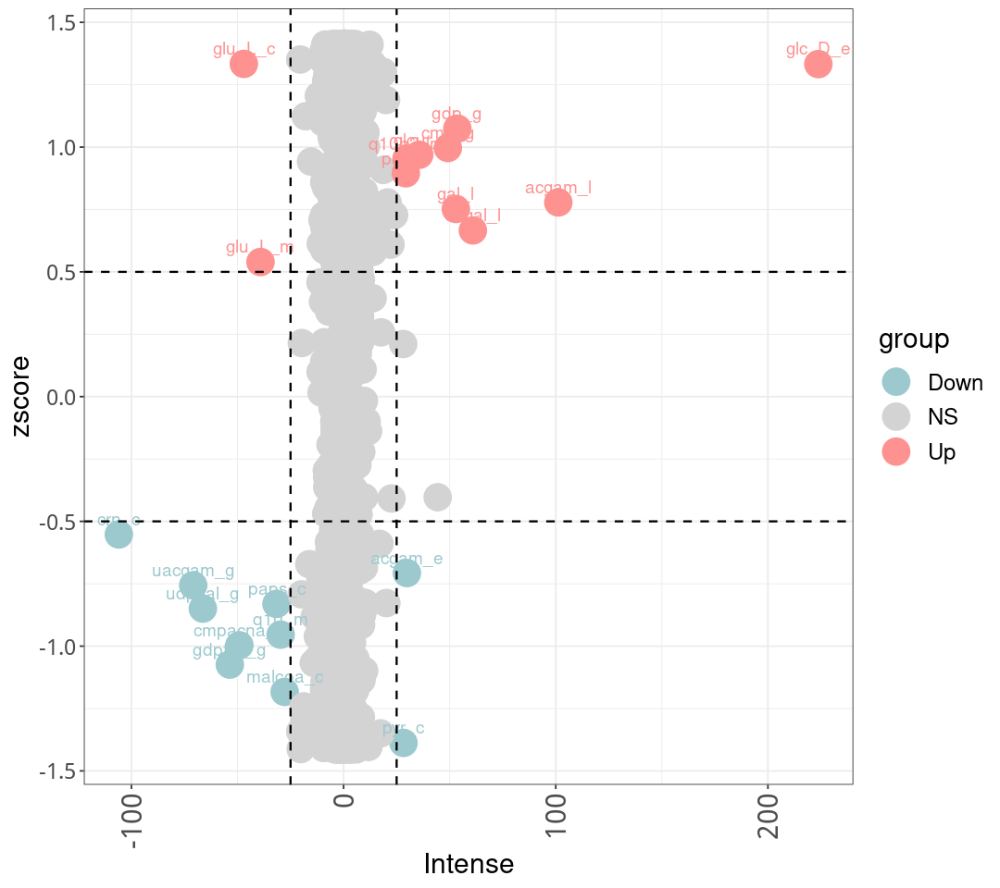

In [160]:
options(repr.plot.width=9, repr.plot.height=8)
ggscatter(plot_df, x = "Intense", y = "zscore", color = "group",
          size=8,
          label='met',
          label.select = select_met,
   palette = c("#9cc9ce", "lightgrey", "#fd9291") ) + 
geom_hline(yintercept=0.5, linetype="dashed", linewidth=0.65) + 
geom_hline(yintercept=-0.5, linetype="dashed", linewidth=0.65) + 
geom_vline(xintercept=25, linetype="dashed", linewidth=0.65) + 
geom_vline(xintercept=-25, linetype="dashed", linewidth=0.65) +
theme_bw() +
  theme(text=element_text(size=18),
        axis.text.x = element_text(size = 18,angle=90,hjust=1, vjust=0.5),
      strip.text.x = element_text(size = 18,face="bold"))

## Fig 3f

In [117]:
st1_obj = readRDS('./ST/735350_3/735350_3_res.rds')
st1_met = read.delim('./ST/735350_3/Compass//reactions_met.tsv', sep='\t', row.names=1, check.names = F)

st1_met = t(st1_met)

st1_obj@meta.data = cbind(st1_obj@meta.data,
                          apply(st1_met[rownames(st1_obj@meta.data),], FUN=as.numeric, MARGIN=2))

celltype_frac_df = read.table(file.path('./ST/735350_3/STRIDE//assign_level3/STRIDE_spot_celltype_frac.txt'), sep='\t', check.names = F, row.names = 1, header = T)
all_sample_meta = read.delim('./all_sample_meta.tsv', sep='\t', row.names=1, check.names=F)

# annotation by max cell type proportion
celltype_frac_df = celltype_frac_df[rownames(st1_obj@meta.data),]
st1_obj@meta.data$assign.max = colnames(celltype_frac_df)[apply(celltype_frac_df, FUN=which.max, 1)]

st1_obj@meta.data$assign.max[!(st1_obj@meta.data$assign.max %in% c('Mal_AGEJ_like','Mal_EAC_like','Mal_GC_like'))] = 'Normal'

In [118]:
st3_obj = readRDS('./ST/736083_3/736083_3_res.rds')
st3_met = read.delim('./ST/736083_3/Compass//reactions_met.tsv', sep='\t', row.names=1, check.names = F)

st3_met = t(st3_met)

st3_obj@meta.data = cbind(st3_obj@meta.data,
                          apply(st3_met[rownames(st3_obj@meta.data),], FUN=as.numeric, MARGIN=2))

celltype_frac_df = read.table(file.path('./ST/736083_3/STRIDE//assign_level3/STRIDE_spot_celltype_frac.txt'), sep='\t', check.names = F, row.names = 1, header = T)
all_sample_meta = read.delim('./all_sample_meta.tsv', sep='\t', row.names=1, check.names=F)

# annotation by max cell type proportion
celltype_frac_df = celltype_frac_df[rownames(st3_obj@meta.data),]
st3_obj@meta.data$assign.max = colnames(celltype_frac_df)[apply(celltype_frac_df, FUN=which.max, 1)]
for (tmp_c in levels(as.factor(st3_obj@meta.data$assign.max))){
    if (tmp_c %in% c('Mal_AGEJ_like','Mal_EAC_like','Mal_GC_like')){
        st3_obj@meta.data$assign.max[st3_obj@meta.data$assign.max == tmp_c] = 'Tumor'
    } else {
        st3_obj@meta.data$assign.max[st3_obj@meta.data$assign.max == tmp_c] = unique(all_sample_meta[all_sample_meta$assign.level3 == tmp_c, 'assign.level1'])
    }
    
}
st3_obj@meta.data$assign.max[st3_obj@meta.data$assign.max != 'Tumor'] = 'Normal'


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


png 
  2

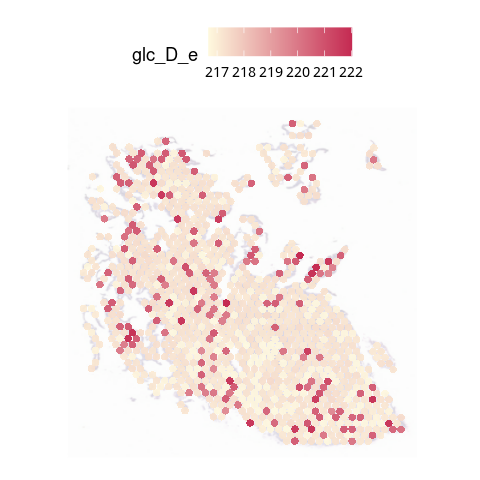

In [273]:
tmp_met = 'glc_D_e'

options(repr.plot.width=4, repr.plot.height=4)
SpatialPlot(st1_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=2.2,
            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = colorRampPalette(c('#fffadf','#c52a52'))(500)) 

pdf(file = './Fig_pdf/Fig3f_glucose_st1.pdf', width=4, height=4)
options(repr.plot.width=4, repr.plot.height=4)
p = SpatialPlot(st1_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=2.2,
                            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = colorRampPalette(c('#fffadf','#c52a52'))(500)) +
theme(legend.position = "none")
p
dev.off()


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


png 
  2

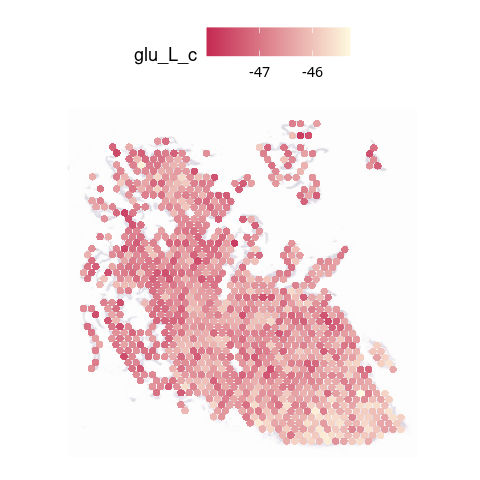

In [274]:
tmp_met = 'glu_L_c'

options(repr.plot.width=4, repr.plot.height=4)
SpatialPlot(st1_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=2.2,
            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = rev(colorRampPalette(c('#fffadf','#c52a52'))(500)))

pdf(file = './Fig_pdf/Fig3f_glutamate_st1.pdf', width=4, height=4)
options(repr.plot.width=4, repr.plot.height=4)
p = SpatialPlot(st1_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=2.2,
                            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = rev(colorRampPalette(c('#fffadf','#c52a52'))(500))) +
theme(legend.position = "none")
p
dev.off()


In [155]:
celltype_frac_df = read.table(file.path('./ST/735350_3/STRIDE//assign_level3/STRIDE_spot_celltype_frac.txt'), sep='\t', check.names = F, row.names = 1, header = T)
all_sample_meta = read.delim('./all_sample_meta.tsv', sep='\t', row.names=1, check.names=F)

# annotation by max cell type proportion
celltype_frac_df = celltype_frac_df[rownames(st1_obj@meta.data),]
st1_obj@meta.data$assign.max = colnames(celltype_frac_df)[apply(celltype_frac_df, FUN=which.max, 1)]
# for (tmp_c in levels(as.factor(st1_obj@meta.data$assign.max))){
#     if (tmp_c %in% c('Mal_AGEJ_like','Mal_EAC_like','Mal_GC_like')){
#         st1_obj@meta.data$assign.max[st1_obj@meta.data$assign.max == tmp_c] = 'Tumor'
#     } else {
#         st1_obj@meta.data$assign.max[st1_obj@meta.data$assign.max == tmp_c] = unique(all_sample_meta[all_sample_meta$assign.level3 == tmp_c, 'assign.level1'])
#     }
    
# }
# st1_obj@meta.data$assign.max[st1_obj@meta.data$assign.max != 'Tumor'] = 'Normal'

st1_obj@meta.data$assign.max[!(st1_obj@meta.data$assign.max %in% c('Mal_AGEJ_like','Mal_EAC_like','Mal_GC_like'))] = 'Normal'

select_features = c('glc_D_e','glc_D_l','gal_l','gln_L_c','sprm_c','glu_L_c')

tmp_max = c()
tmp_fc = c()
tmp_type = c()
for (tmp_f in select_features){
    tmp_max = c(tmp_max, st1_obj@meta.data[,'assign.max'])
    tmp_fc = c(tmp_fc, st1_obj@meta.data[,tmp_f])
    tmp_type = c(tmp_type, rep(tmp_f, dim(st1_obj@meta.data)[1]))
}
plot_df = data.frame(list(
    assign.max = tmp_max,
    intense = tmp_fc,
    type = tmp_type
)
)

png 
  2

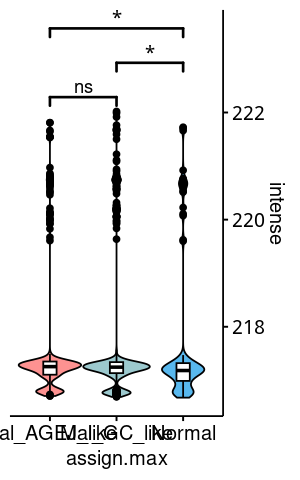

In [348]:
tmp_met = 'glc_D_e'

# pdf(file = './Fig_pdf/Fig3f_glucose_st1_boxplot.pdf', width=4, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         # palette = c("#fd9291", "#9cc9ce"),
        palette = c( "#fd9291","#9cc9ce","#58b8ee"),
         # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             # order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Mal_AGEJ_like','Mal_GC_like'),c('Mal_GC_like','Normal'),c('Mal_AGEJ_like','Normal')),
                     label = "p.signif", bracket.size=0.75)

pdf(file = './Fig_pdf/Fig3f_glucose_st1_boxplot.pdf', width=2.5, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
p = ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         # palette = c("#fd9291", "#9cc9ce"),
        palette = c( "#fd9291","#9cc9ce","#58b8ee"),
         # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             # order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Mal_AGEJ_like','Mal_GC_like'),c('Mal_GC_like','Normal'),c('Mal_AGEJ_like','Normal')),
                     label = "p.signif", bracket.size=0.75)
p
dev.off()

png 
  2

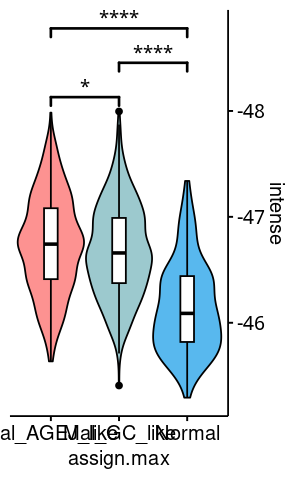

In [156]:
tmp_met = 'glu_L_c'

# pdf(file = './Fig_pdf/Fig3f_glucose_st1_boxplot.pdf', width=4, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         # palette = c("#fd9291", "#9cc9ce"),
        palette = c( "#fd9291","#9cc9ce","#58b8ee"),
             # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             # order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_reverse(position = "right")+
# scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Mal_AGEJ_like','Mal_GC_like'),c('Mal_GC_like','Normal'),c('Mal_AGEJ_like','Normal')),
                     label = "p.signif", bracket.size=0.75)

pdf(file = './Fig_pdf/Fig3f_glutamate_st1_boxplot.pdf', width=2.5, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
p = ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         # palette = c("#fd9291", "#9cc9ce"),
        palette = c( "#fd9291","#9cc9ce","#58b8ee"),
             # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             # order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_reverse(position = "right")+
# scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Mal_AGEJ_like','Mal_GC_like'),c('Mal_GC_like','Normal'),c('Mal_AGEJ_like','Normal')),
                     label = "p.signif", bracket.size=0.75)
p
dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


png 
  2

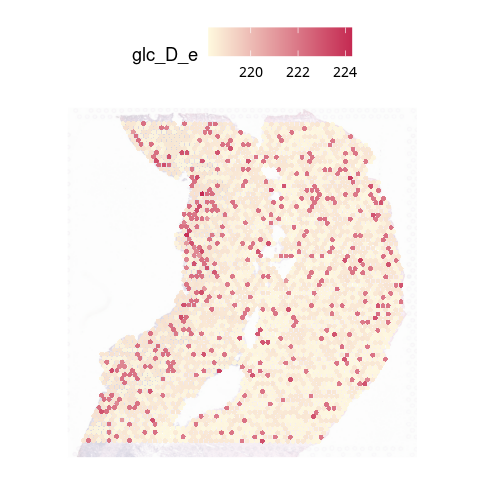

In [303]:
tmp_met = 'glc_D_e'

options(repr.plot.width=4, repr.plot.height=4)
SpatialPlot(st3_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=1.5,
            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = colorRampPalette(c('#fffadf','#c52a52'))(500)) +
theme_bw()

pdf(file = './Fig_pdf/Fig3f_glucose_st3.pdf', width=4, height=4)
options(repr.plot.width=4, repr.plot.height=4)
p = SpatialPlot(st3_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=1.5,
                            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = colorRampPalette(c('#fffadf','#c52a52'))(500)) +
theme(legend.position = "none")
p
dev.off()


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


png 
  2

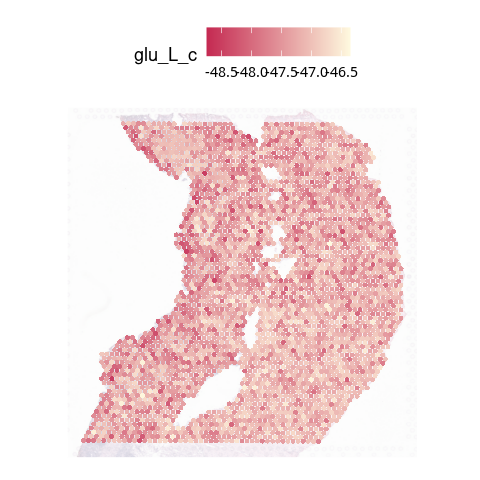

In [313]:
tmp_met = 'glu_L_c'

options(repr.plot.width=4, repr.plot.height=4)
SpatialPlot(st3_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=1.5, 
            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = rev(colorRampPalette(c('#fffadf','#c52a52'))(500)))
# scale_fill_gradientn(colours = rev(colorRampPalette(c('#fffadf','#ffbcaf','#c52a52'))(200)))
pdf(file = './Fig_pdf/Fig3f_glutamate_st3.pdf', width=4, height=4)
options(repr.plot.width=4, repr.plot.height=4)
p = SpatialPlot(st3_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=1.5,
                            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = rev(colorRampPalette(c('#fffadf','#c52a52'))(500))) +
theme(legend.position = "none")
p
dev.off()


In [153]:
celltype_frac_df = read.table(file.path('./ST/736083_3/STRIDE//assign_level3/STRIDE_spot_celltype_frac.txt'), sep='\t', check.names = F, row.names = 1, header = T)
all_sample_meta = read.delim('./all_sample_meta.tsv', sep='\t', row.names=1, check.names=F)

# annotation by max cell type proportion
celltype_frac_df = celltype_frac_df[rownames(st3_obj@meta.data),]
st3_obj@meta.data$assign.max = colnames(celltype_frac_df)[apply(celltype_frac_df, FUN=which.max, 1)]
for (tmp_c in levels(as.factor(st3_obj@meta.data$assign.max))){
    if (tmp_c %in% c('Mal_AGEJ_like','Mal_EAC_like','Mal_GC_like')){
        st3_obj@meta.data$assign.max[st3_obj@meta.data$assign.max == tmp_c] = 'Tumor'
    } else {
        st3_obj@meta.data$assign.max[st3_obj@meta.data$assign.max == tmp_c] = unique(all_sample_meta[all_sample_meta$assign.level3 == tmp_c, 'assign.level1'])
    }
    
}
st3_obj@meta.data$assign.max[st3_obj@meta.data$assign.max != 'Tumor'] = 'Normal'

select_features = c('glc_D_e','glc_D_l','gal_l','gln_L_c','sprm_c','glu_L_c')


tmp_max = c()
tmp_fc = c()
tmp_type = c()
for (tmp_f in select_features){
    tmp_max = c(tmp_max, st3_obj@meta.data[,'assign.max'])
    tmp_fc = c(tmp_fc, st3_obj@meta.data[,tmp_f])
    tmp_type = c(tmp_type, rep(tmp_f, dim(st3_obj@meta.data)[1]))
}
plot_df = data.frame(list(
    assign.max = tmp_max,
    intense = tmp_fc,
    type = tmp_type
)
)


png 
  2

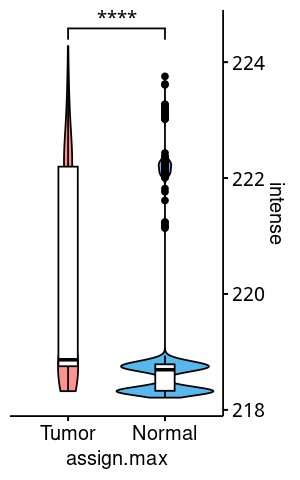

In [351]:
tmp_met = 'glc_D_e'

# pdf(file = './Fig_pdf/Fig3f_glucose_st1_boxplot.pdf', width=4, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         palette = c("#fd9291", "#58b8ee"),
             # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Tumor','Normal')),
                     label = "p.signif", bracket.size=0.5)

pdf(file = './Fig_pdf/Fig3f_glucose_st3_boxplot.pdf', width=2.5, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
p = ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         palette = c("#fd9291", "#58b8ee"),
             # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Tumor','Normal')),
                     label = "p.signif", bracket.size=0.5)
p
dev.off()

png 
  2

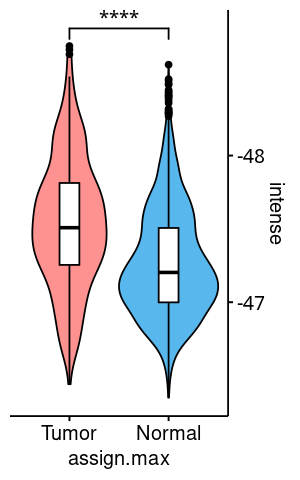

In [154]:
tmp_met = 'glu_L_c'

# pdf(file = './Fig_pdf/Fig3f_glucose_st1_boxplot.pdf', width=4, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         palette = c("#fd9291", "#58b8ee"),
             # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_reverse(position = "right")+
# scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Tumor','Normal')),
                     label = "p.signif", bracket.size=0.5)

pdf(file = './Fig_pdf/Fig3f_glutamate_st3_boxplot.pdf', width=2.5, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
p = ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         palette = c("#fd9291", "#58b8ee"),
             # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_reverse(position = "right")+
# scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Tumor','Normal')),
                     label = "p.signif", bracket.size=0.5)
p
dev.off()

- try adding GAC in ST 3

In [356]:
celltype_frac_df = read.table(file.path('./ST/736083_3/STRIDE//assign_level3/STRIDE_spot_celltype_frac.txt'), sep='\t', check.names = F, row.names = 1, header = T)
all_sample_meta = read.delim('./all_sample_meta.tsv', sep='\t', row.names=1, check.names=F)

# annotation by max cell type proportion
celltype_frac_df = celltype_frac_df[rownames(st3_obj@meta.data),]
st3_obj@meta.data$assign.max = colnames(celltype_frac_df)[apply(celltype_frac_df, FUN=which.max, 1)]
st3_obj@meta.data$assign.max[!(st3_obj@meta.data$assign.max %in% c('Mal_AGEJ_like','Mal_EAC_like','Mal_GC_like'))] = 'Normal'

select_features = c('glc_D_e','glc_D_l','gal_l','gln_L_c','sprm_c','glu_L_c')


tmp_max = c()
tmp_fc = c()
tmp_type = c()
for (tmp_f in select_features){
    tmp_max = c(tmp_max, st3_obj@meta.data[,'assign.max'])
    tmp_fc = c(tmp_fc, st3_obj@meta.data[,tmp_f])
    tmp_type = c(tmp_type, rep(tmp_f, dim(st3_obj@meta.data)[1]))
}
plot_df = data.frame(list(
    assign.max = tmp_max,
    intense = tmp_fc,
    type = tmp_type
)
)


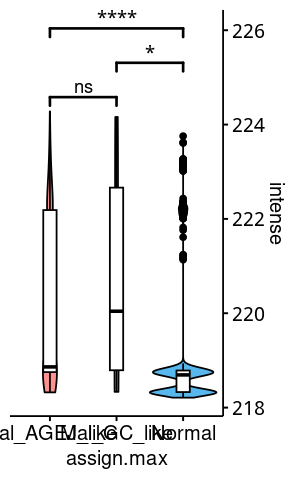

In [359]:
tmp_met = 'glc_D_e'

# pdf(file = './Fig_pdf/Fig3f_glucose_st1_boxplot.pdf', width=4, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         # palette = c("#fd9291", "#9cc9ce"),
        palette = c( "#fd9291","#9cc9ce","#58b8ee"),
         # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             order=c('Mal_AGEJ_like','Mal_GC_like','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Mal_AGEJ_like','Mal_GC_like'),c('Mal_GC_like','Normal'),c('Mal_AGEJ_like','Normal')),
                     label = "p.signif", bracket.size=0.75)


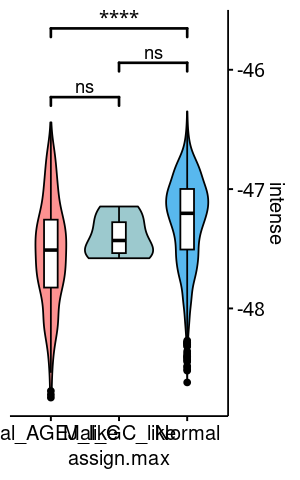

In [360]:
tmp_met = 'glu_L_c'

# pdf(file = './Fig_pdf/Fig3f_glucose_st1_boxplot.pdf', width=4, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         # palette = c("#fd9291", "#9cc9ce"),
        palette = c( "#fd9291","#9cc9ce","#58b8ee"),
         # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             order=c('Mal_AGEJ_like','Mal_GC_like','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Mal_AGEJ_like','Mal_GC_like'),c('Mal_GC_like','Normal'),c('Mal_AGEJ_like','Normal')),
                     label = "p.signif", bracket.size=0.75)


In [315]:
library(grid)
library(gridExtra) 

lgdplot= SpatialPlot(st3_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=1.5, 
            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = rev(colorRampPalette(c('#fffadf','#c52a52'))(500)))

legend <- cowplot::get_legend(lgdplot)

pdf(file = './Fig_pdf/Fig3f_legend.pdf', width=4, height=4)

grid.newpage()
grid.draw(legend)

dev.off()


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


png 
  2

## Fig 3g

In [133]:
quant_df = read.delim('../Metabolomics//data/Metabolite_l2_quant.tsv', sep='\t', row.names=1, check.names=F)
quant_only_df = quant_df[17:dim(quant_df)[2]]
rownames(quant_only_df) = quant_df$name

meta_df = data.frame(list(sample=colnames(quant_only_df), source=unlist(lapply(colnames(quant_only_df), function(x) strsplit(x, split='_')[[1]][2]))))
rownames(meta_df) = meta_df$sample

dge <- DGEList(counts=quant_only_df)
design = model.matrix(~ factor(meta_df$source))
keep <- filterByExpr(dge, design)
dge <- dge[keep,,keep.lib.sizes=FALSE]
dge <- calcNormFactors(dge)
logCPM <- cpm(dge, log=TRUE, prior.count=3)
fit <- lmFit(logCPM, design)
fit <- eBayes(fit, trend=TRUE)


all_meta_fc_df = topTable(fit, coef=ncol(design), n=10000)
top_meta_df = topTable(fit, coef=ncol(design), n=100)
top_meta_df = top_meta_df[top_meta_df$adj.P.Val <= 0.01,]
                                                                               
top_up_mets = rownames(top_meta_df[top_meta_df$logFC > 0,])
top_down_mets = rownames(top_meta_df[top_meta_df$logFC < 0,])

png 
  2

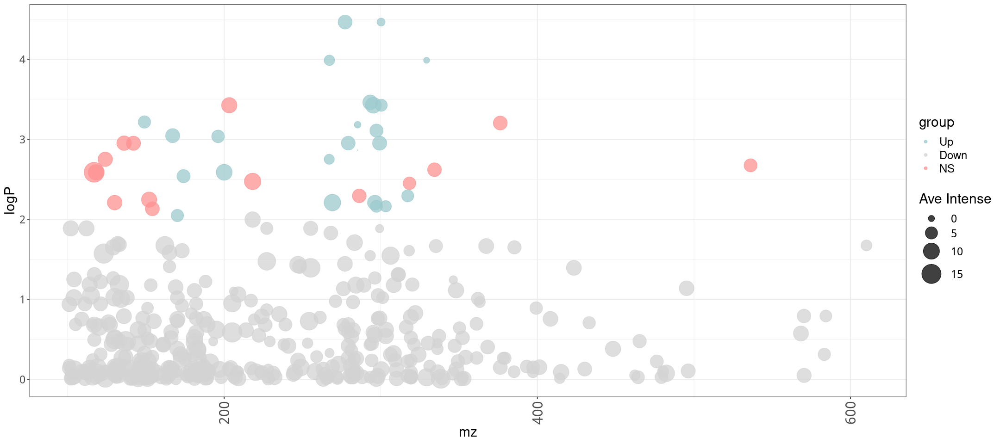

In [220]:
plot_df = quant_df[,c('name','mz')]
rownames(plot_df) = plot_df$name

plot_df = cbind(plot_df, all_meta_fc_df[rownames(plot_df),])

avg_T_intens = apply(logCPM[,grep('T', colnames(logCPM))], FUN=mean, MARGIN=1)
avg_T_intens = avg_T_intens[rownames(plot_df)]
plot_df$avg_T_intens = avg_T_intens

plot_df$logP = -log10(plot_df$adj.P.Val)

plot_df$group = 'NS'
plot_df$group[rownames(plot_df) %in% top_up_mets] = 'Up'
plot_df$group[rownames(plot_df) %in% top_down_mets] = 'Down'


pdf(file = './Fig_pdf/Fig3g.pdf', width=18, height=8)
options(repr.plot.width=18, repr.plot.height=8)

p = ggplot(plot_df, aes(x=mz, y=logP, size=avg_T_intens, color=group,)) +
    geom_point(alpha=0.75) +
scale_color_manual(name='group', values = c("Up" = "#fd9291", "Down" = "#9cc9ce", 'NS'='lightgrey'),labels=c("Up", "Down", "NS")) +
    scale_size(range = c(.1, 12), name="Ave Intense") + theme_bw() +
  theme(text=element_text(size=18),
        axis.text.x = element_text(size = 18,angle=90,hjust=1, vjust=0.5),
      strip.text.x = element_text(size = 18,face="bold"))
p
dev.off()
p

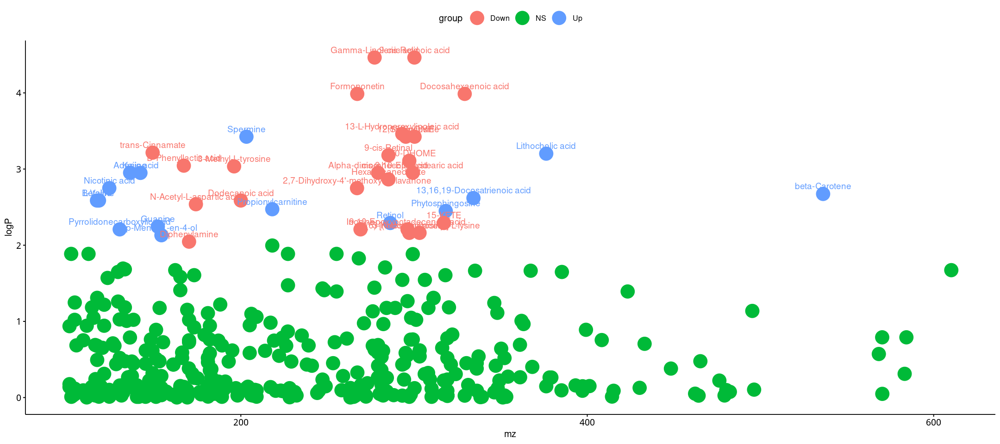

In [225]:
ggscatter(plot_df, x = "mz", y = "logP", color = "group",
          size=8,
          label='name',
          label.select = c(top_up_mets,top_down_mets))


## Fig 3h

In [211]:
subset_markers = read.delim(file='./Epi_subset/Malignant_subset_markers.tsv', sep='\t')
diff.gene.Mal_subset = subset_markers[subset_markers$cluster == 'Mal_AGEJ_like',]
diff.gene.Mal_subset$log10_p_adj = -log10(diff.gene.Mal_subset$p_val_adj)
diff.gene.Mal_subset = diff.gene.Mal_subset[diff.gene.Mal_subset$log10_p_adj >= 3,]
diff.gene.Mal_subset = diff.gene.Mal_subset[diff.gene.Mal_subset$avg_log2FC > 2,]

plot_df = diff.gene.Mal_subset[,c('gene','avg_log2FC')]

write.table(plot_df, file='./avg_log2FC.tsv', sep='\t',
            row.names=F, col.names=colnames(plot_df),
            quote=F
           )

In [213]:
head(top_meta_df)

,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
9-cis-Retinoic acid,-3.604415,2.956990,-7.023714,1.704494e-07,3.432985e-05,7.371739
Gamma-Linolenic acid,-3.667375,8.881264,-7.019896,1.720794e-07,3.432985e-05,7.362699
Docosahexaenoic acid,-6.239410,3.023753,-6.354502,9.272387e-07,1.030677e-04,5.759291
Formononetin,-2.056554,4.193066,-6.312368,1.033260e-06,1.030677e-04,5.656013
13-L-Hydroperoxylinoleic acid,-1.984986,9.076588,-5.760194,4.335085e-06,3.459398e-04,4.286407
Sphingosine,-3.449625,6.584355,-5.599444,6.611827e-06,3.760902e-04,3.882879


In [218]:
plot_df = all_meta_fc_df[((all_meta_fc_df$adj.P.Val < 0.05)& (all_meta_fc_df$logFC > 0)),]
plot_df$met = rownames(plot_df)
plot_df = plot_df[,c('met','logFC')]
write.table(plot_df, file='./met_logFC.tsv', sep='\t',
            row.names=F, col.names=colnames(plot_df),
            quote=F)

## Fig 3i

In [93]:
quant_df = read.delim('../Metabolomics//data/Metabolite_l2_quant.tsv', sep='\t', row.names=1, check.names=F)
quant_only_df = quant_df[17:dim(quant_df)[2]]
rownames(quant_only_df) = quant_df$name

meta_df = data.frame(list(sample=colnames(quant_only_df), source=unlist(lapply(colnames(quant_only_df), function(x) strsplit(x, split='_')[[1]][2]))))
rownames(meta_df) = meta_df$sample

log10_quant = as.matrix(log(quant_only_df))
# logCPM produced in Fig 3g
dge <- DGEList(counts=quant_only_df)
design = model.matrix(~ factor(meta_df$source))
keep <- filterByExpr(dge, design)
dge <- dge[keep,,keep.lib.sizes=FALSE]
dge <- calcNormFactors(dge)
logCPM <- cpm(dge, log=TRUE, prior.count=3)

plot_df = as.data.frame(log10_quant[c('L-Glutamic acid','L-Glutamine','L-Arginine','L-Proline','Spermidine','Spermine'),])
# plot_df = as.data.frame(logCPM[c('L-Glutamic acid','L-Glutamine','L-Arginine','L-Proline','Spermidine','Spermine'),])
plot_df$met = rownames(plot_df)
plot_df = dcast(melt(plot_df, id.var="met"), 1~variable+met)
plot_df = as.data.frame(t(plot_df[,2:dim(plot_df)[2]]))
colnames(plot_df) = c('intense')
plot_df$met = factor(unlist(lapply(rownames(plot_df), function(x) strsplit(x, split='_')[[1]][3])),
                                   levels=c('L-Glutamic acid','L-Glutamine','L-Arginine','L-Proline','Spermidine','Spermine'),
                                   labels=c('Glutamate','Glutamine','Arginine','Proline','Spermidine','Spermine'))
plot_df$source = unlist(lapply(rownames(plot_df), function(x) strsplit(x, split='_')[[1]][2]))
plot_df$sample = unlist(lapply(rownames(plot_df), function(x) strsplit(x, split='_')[[1]][1]))

png 
  2

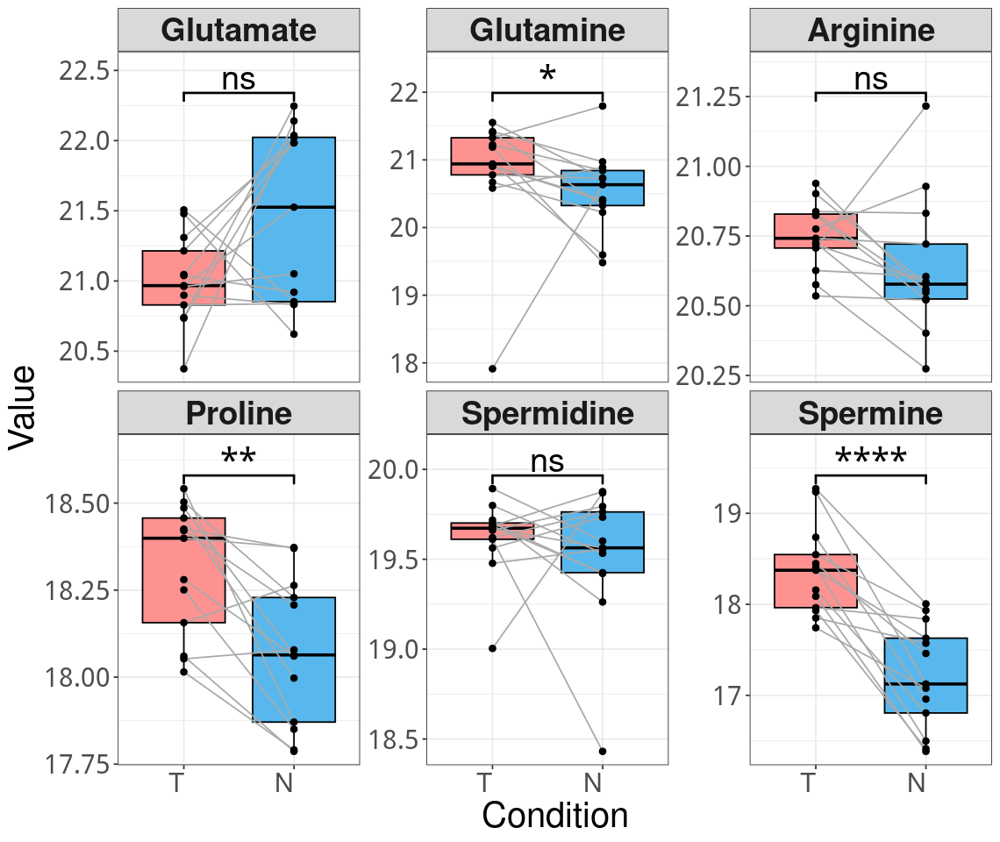

In [126]:
options(repr.plot.width=9.5, repr.plot.height=8)
ggpaired(plot_df, x = "source", y = 'intense', fill = "source",
         palette = c("#fd9291", "#58b8ee"),
             color='black',
             width=0.75,
         point.size=1.75,
         line.color='darkgrey',
             # error.plot='none',
             order=c('T','N'))+
  facet_wrap(~met,  ncol=3, scale='free_y')  + 
theme_bw()+
  theme(legend.text = element_text(size = 20), 
       legend.title = element_text(size = 24), 
       axis.text.x=element_text(size=18,angle=0,hjust=1),
       axis.text.y=element_text(size=18),
       axis.title=element_text(size=24),
        strip.text.x = element_text(size = 22,face="bold"),
        legend.position = "none") +
  stat_compare_means(comparisons = list(c('T','N')),
                     p.adjust.method = "bonferroni",
                     size=8,
                     label = "p.signif", bracket.size=0.75) + 
scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

pdf(file = './Fig_pdf/Fig3i.pdf', width=9.5, height=8)
options(repr.plot.width=9.5, repr.plot.height=8)
p = ggpaired(plot_df, x = "source", y = 'intense', fill = "source",
         palette = c("#fd9291", "#58b8ee"),
             color='black',
             width=0.75,
         point.size=1.75,
         line.color='darkgrey',
             # error.plot='none',
             order=c('T','N'))+
  facet_wrap(~met,  ncol=3, scale='free_y')  + 
theme_bw()+
  theme(legend.text = element_text(size = 20), 
       legend.title = element_text(size = 24), 
       axis.text.x=element_text(size=18,angle=0,hjust=1),
       axis.text.y=element_text(size=18),
       axis.title=element_text(size=24),
        strip.text.x = element_text(size = 22,face="bold"),
        legend.position = "none") +
  stat_compare_means(comparisons = list(c('T','N')),
                     p.adjust.method = "bonferroni",
                     size=8,
                     label = "p.signif", bracket.size=0.75) + 
scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))
p
dev.off()

In [74]:
stat.test <- plot_df[!(plot_df$sample == 'P5'),]  %>% 
group_by(met) %>%
  wilcox_test(intense ~ source, ref.group='N',p.adjust.method = 'bonferroni', paired = T) %>%
  add_significance()
stat.test

met,.y.,group1,group2,n1,n2,statistic,p,p.signif
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<chr>
L-Arginine,intense,N,T,12,12,17,0.092300,ns
L-Glutamic acid,intense,N,T,12,12,66,0.034200,*
L-Glutamine,intense,N,T,12,12,20,0.151000,ns
L-Proline,intense,N,T,12,12,1,0.000977,***
Spermidine,intense,N,T,12,12,30,0.519000,ns
Spermine,intense,N,T,12,12,0,0.000488,***


In [71]:
stat.test <- plot_df  %>% 
group_by(met) %>%
  wilcox_test(intense ~ source, ref.group='N',p.adjust.method = 'bonferroni', paired = T) %>%
  add_significance()
stat.test

met,.y.,group1,group2,n1,n2,statistic,p,p.signif
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<chr>
L-Arginine,intense,N,T,13,13,48,6.42e-02,ns
L-Glutamic acid,intense,N,T,13,13,118,9.08e-02,ns
L-Glutamine,intense,N,T,13,13,42,2.95e-02,*
L-Proline,intense,N,T,13,13,34,8.60e-03,**
Spermidine,intense,N,T,13,13,70,4.79e-01,ns
Spermine,intense,N,T,13,13,8,1.29e-05,****


## Fig 3j

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


png 
  2

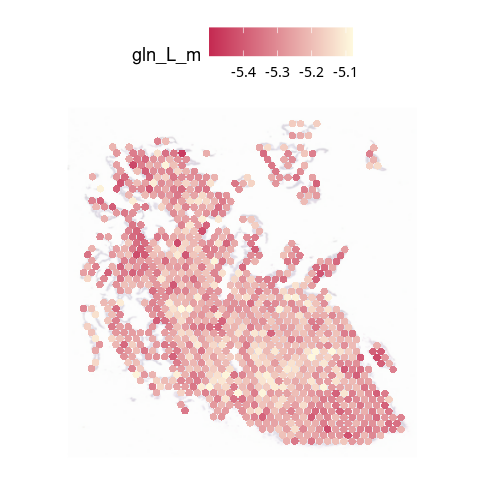

In [144]:
tmp_met = 'gln_L_m'

options(repr.plot.width=4, repr.plot.height=4)
SpatialPlot(st1_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=2.2,
            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = rev(colorRampPalette(c('#fffadf','#c52a52'))(500)))

pdf(file = './Fig_pdf/Fig3j_glutamine_st1.pdf', width=4, height=4)
options(repr.plot.width=4, repr.plot.height=4)
p = SpatialPlot(st1_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=2.2,
                            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = rev(colorRampPalette(c('#fffadf','#c52a52'))(500))) +
theme(legend.position = "none")
p
dev.off()


png 
  2

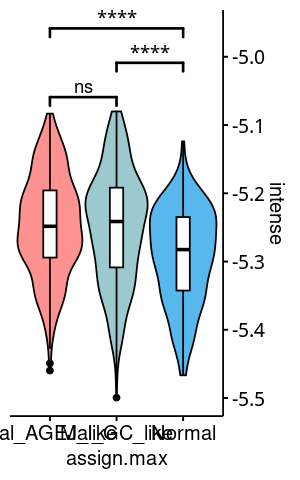

In [145]:
celltype_frac_df = read.table(file.path('./ST/735350_3/STRIDE//assign_level3/STRIDE_spot_celltype_frac.txt'), sep='\t', check.names = F, row.names = 1, header = T)
all_sample_meta = read.delim('./all_sample_meta.tsv', sep='\t', row.names=1, check.names=F)

# annotation by max cell type proportion
celltype_frac_df = celltype_frac_df[rownames(st1_obj@meta.data),]
st1_obj@meta.data$assign.max = colnames(celltype_frac_df)[apply(celltype_frac_df, FUN=which.max, 1)]
# for (tmp_c in levels(as.factor(st1_obj@meta.data$assign.max))){
#     if (tmp_c %in% c('Mal_AGEJ_like','Mal_EAC_like','Mal_GC_like')){
#         st1_obj@meta.data$assign.max[st1_obj@meta.data$assign.max == tmp_c] = 'Tumor'
#     } else {
#         st1_obj@meta.data$assign.max[st1_obj@meta.data$assign.max == tmp_c] = unique(all_sample_meta[all_sample_meta$assign.level3 == tmp_c, 'assign.level1'])
#     }
    
# }
# st1_obj@meta.data$assign.max[st1_obj@meta.data$assign.max != 'Tumor'] = 'Normal'

st1_obj@meta.data$assign.max[!(st1_obj@meta.data$assign.max %in% c('Mal_AGEJ_like','Mal_EAC_like','Mal_GC_like'))] = 'Normal'

select_features = c('glc_D_e','glc_D_l','gal_l','gln_L_c','gln_L_m','sprm_c','glu_L_c')

tmp_max = c()
tmp_fc = c()
tmp_type = c()
for (tmp_f in select_features){
    tmp_max = c(tmp_max, st1_obj@meta.data[,'assign.max'])
    tmp_fc = c(tmp_fc, st1_obj@meta.data[,tmp_f])
    tmp_type = c(tmp_type, rep(tmp_f, dim(st1_obj@meta.data)[1]))
}
plot_df = data.frame(list(
    assign.max = tmp_max,
    intense = tmp_fc,
    type = tmp_type
)
)

tmp_met = 'gln_L_m'

# pdf(file = './Fig_pdf/Fig3f_glucose_st1_boxplot.pdf', width=4, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         # palette = c("#fd9291", "#9cc9ce"),
        palette = c( "#fd9291","#9cc9ce","#58b8ee"),
         # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             # order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Mal_AGEJ_like','Mal_GC_like'),c('Mal_GC_like','Normal'),c('Mal_AGEJ_like','Normal')),
                     label = "p.signif", bracket.size=0.75)

pdf(file = './Fig_pdf/Fig3j_glutamine_st1_boxplot.pdf', width=2.5, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
p = ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         # palette = c("#fd9291", "#9cc9ce"),
        palette = c( "#fd9291","#9cc9ce","#58b8ee"),
         # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             # order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Mal_AGEJ_like','Mal_GC_like'),c('Mal_GC_like','Normal'),c('Mal_AGEJ_like','Normal')),
                     label = "p.signif", bracket.size=0.75)
p
dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


png 
  2

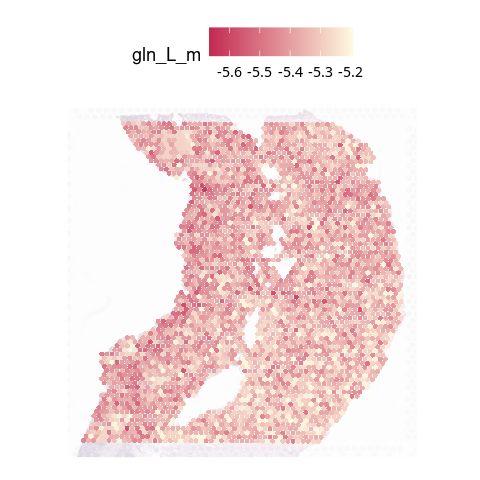

In [143]:
tmp_met = 'gln_L_m'

options(repr.plot.width=4, repr.plot.height=4)
SpatialPlot(st3_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=1.5, 
            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = rev(colorRampPalette(c('#fffadf','#c52a52'))(500)))
# scale_fill_gradientn(colours = rev(colorRampPalette(c('#fffadf','#ffbcaf','#c52a52'))(200)))
pdf(file = './Fig_pdf/Fig3j_glutamine_st3.pdf', width=4, height=4)
options(repr.plot.width=4, repr.plot.height=4)
p = SpatialPlot(st3_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=1.5,
                            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = rev(colorRampPalette(c('#fffadf','#c52a52'))(500))) +
theme(legend.position = "none")
p
dev.off()


png 
  2

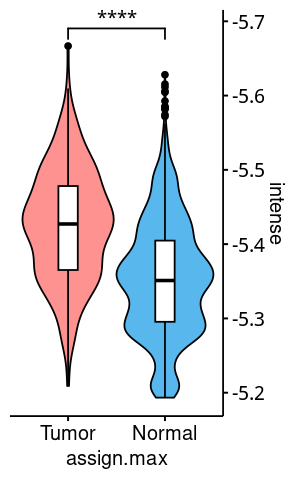

In [157]:
celltype_frac_df = read.table(file.path('./ST/736083_3/STRIDE//assign_level3/STRIDE_spot_celltype_frac.txt'), sep='\t', check.names = F, row.names = 1, header = T)
all_sample_meta = read.delim('./all_sample_meta.tsv', sep='\t', row.names=1, check.names=F)

# annotation by max cell type proportion
celltype_frac_df = celltype_frac_df[rownames(st3_obj@meta.data),]
st3_obj@meta.data$assign.max = colnames(celltype_frac_df)[apply(celltype_frac_df, FUN=which.max, 1)]
for (tmp_c in levels(as.factor(st3_obj@meta.data$assign.max))){
    if (tmp_c %in% c('Mal_AGEJ_like','Mal_EAC_like','Mal_GC_like')){
        st3_obj@meta.data$assign.max[st3_obj@meta.data$assign.max == tmp_c] = 'Tumor'
    } else {
        st3_obj@meta.data$assign.max[st3_obj@meta.data$assign.max == tmp_c] = unique(all_sample_meta[all_sample_meta$assign.level3 == tmp_c, 'assign.level1'])
    }
    
}
st3_obj@meta.data$assign.max[st3_obj@meta.data$assign.max != 'Tumor'] = 'Normal'

select_features = c('glc_D_e','glc_D_l','gal_l','gln_L_c','gln_L_m','sprm_c','glu_L_c')


tmp_max = c()
tmp_fc = c()
tmp_type = c()
for (tmp_f in select_features){
    tmp_max = c(tmp_max, st3_obj@meta.data[,'assign.max'])
    tmp_fc = c(tmp_fc, st3_obj@meta.data[,tmp_f])
    tmp_type = c(tmp_type, rep(tmp_f, dim(st3_obj@meta.data)[1]))
}
plot_df = data.frame(list(
    assign.max = tmp_max,
    intense = tmp_fc,
    type = tmp_type
)
)

tmp_met = 'gln_L_m'
.
# pdf(file = './Fig_pdf/Fig3f_glucose_st1_boxplot.pdf', width=4, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         palette = c("#fd9291", "#58b8ee"),
             # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_reverse(position = "right")+
# scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Tumor','Normal')),
                     label = "p.signif", bracket.size=0.5)

pdf(file = './Fig_pdf/Fig3j_glutamine_st3_boxplot.pdf', width=2.5, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
p = ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         palette = c("#fd9291", "#58b8ee"),
             # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_reverse(position = "right")+
# scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Tumor','Normal')),
                     label = "p.signif", bracket.size=0.5)
p
dev.off()

## Fig 3k

In [159]:
Epi_obj = readRDS('/fs/home/liuzhaoyang/project//TongjiHospital//add_new_new_samples///Epi_SCT_harmony.rds')

Epi_obj@meta.data$assign.level2[!(Epi_obj@meta.data$assign.level2 %in% c('Mal_AGEJ_like','Mal_EAC_like','Mal_GC_like'))] = 'Normal'
Idents(Epi_obj) = Epi_obj@meta.data$assign.level2

png 
  2

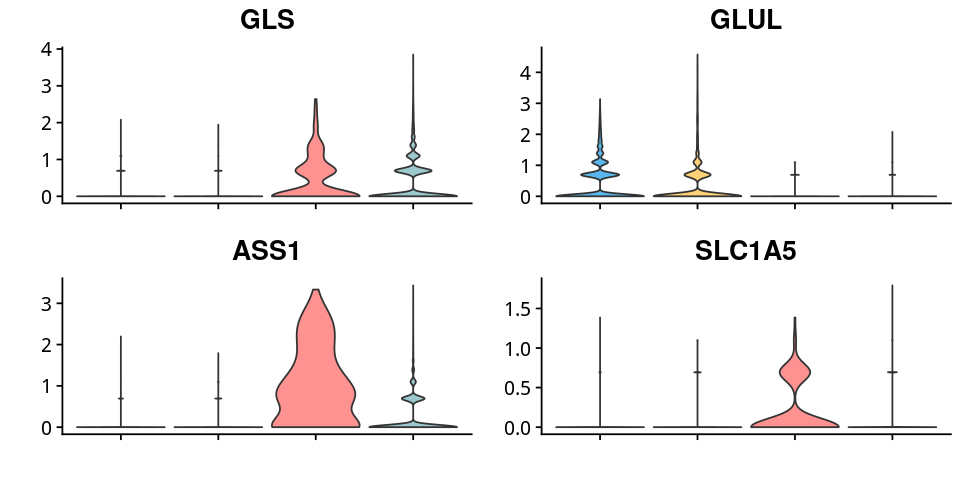

In [198]:
pdf(file = './Fig_pdf/Fig3j_genes.pdf', width=8, height=4)
options(repr.plot.width=8, repr.plot.height=4)
p = VlnPlot(Epi_obj, features = c('GLS','GLUL','ASS1','SLC1A5'), ncol=2, pt.size=0, combine=F)
p <- lapply(X = p, FUN = function(x) x + 
            scale_x_discrete(limits=c('Normal','Mal_EAC_like','Mal_AGEJ_like','Mal_GC_like'),
                             labels=c('Normal','EAC-like','AEG-like','GAC-like')) +
            scale_fill_manual(name='Identity',
                               values = c('Normal' = '#58b8ee',
                                          'Mal_EAC_like' = '#ffd27a',
                                          'Mal_AGEJ_like'='#fd9291',
                                          'Mal_GC_like'='#9cc9ce'),
                               labels=c('Normal','EAC-like','AEG-like','GAC-like')) +
            xlab('') + ylab('') +
                             theme(legend.position='none',
                                   axis.text.x = element_blank(),
                                   plot.margin=unit(c(0,0,0,0),"cm")
                                  ))
p <- wrap_plots(plots = p, ncol=2)
p
dev.off()
p

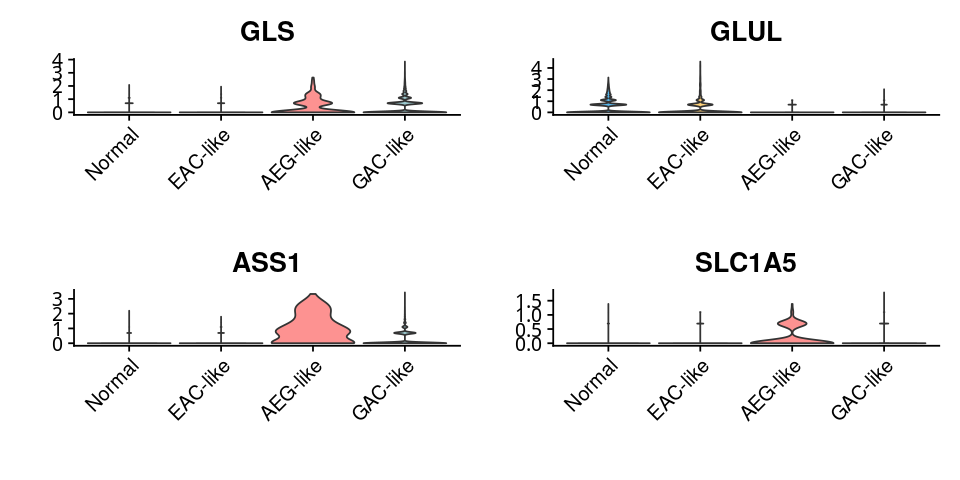

In [189]:
p = VlnPlot(Epi_obj, features = c('GLS','GLUL','ASS1','SLC1A5'), ncol=2, pt.size=0, combine=F)
p <- lapply(X = p, FUN = function(x) x + 
            scale_x_discrete(limits=c('Normal','Mal_EAC_like','Mal_AGEJ_like','Mal_GC_like'),
                             labels=c('Normal','EAC-like','AEG-like','GAC-like')) +
            scale_fill_manual(name='Identity',
                               values = c('Normal' = '#58b8ee',
                                          'Mal_EAC_like' = '#ffd27a',
                                          'Mal_AGEJ_like'='#fd9291',
                                          'Mal_GC_like'='#9cc9ce'),
                               labels=c('Normal','EAC-like','AEG-like','GAC-like')) +
            xlab('') + ylab('') +
                             theme(legend.position='none'
                                  ))
p <- wrap_plots(plots = p, ncol=2)
p


png 
  2

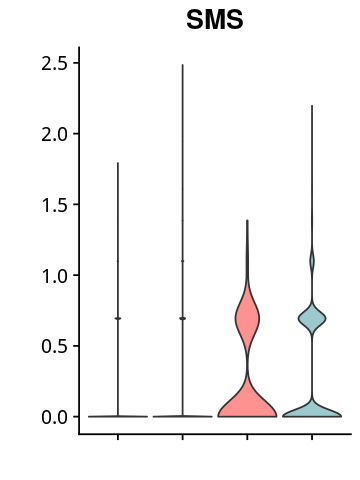

In [205]:
pdf(file = './Fig_pdf/Fig3k.pdf', width=3, height=4)
options(repr.plot.width=3, repr.plot.height=4)
p = VlnPlot(Epi_obj, features = c('SMS'), ncol=2, pt.size=0, combine=F)
p <- lapply(X = p, FUN = function(x) x + 
            scale_x_discrete(limits=c('Normal','Mal_EAC_like','Mal_AGEJ_like','Mal_GC_like'),
                             labels=c('Normal','EAC-like','AEG-like','GAC-like')) +
            scale_fill_manual(name='Identity',
                               values = c('Normal' = '#58b8ee',
                                          'Mal_EAC_like' = '#ffd27a',
                                          'Mal_AGEJ_like'='#fd9291',
                                          'Mal_GC_like'='#9cc9ce'),
                               labels=c('Normal','EAC-like','AEG-like','GAC-like')) +
            xlab('') + ylab('') +
                             theme(legend.position='none',
                                   axis.text.x = element_blank(),
                                   plot.margin=unit(c(0,0,0,0),"cm")
                                  ))
p <- wrap_plots(plots = p, ncol=1)
p
dev.off()
p

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


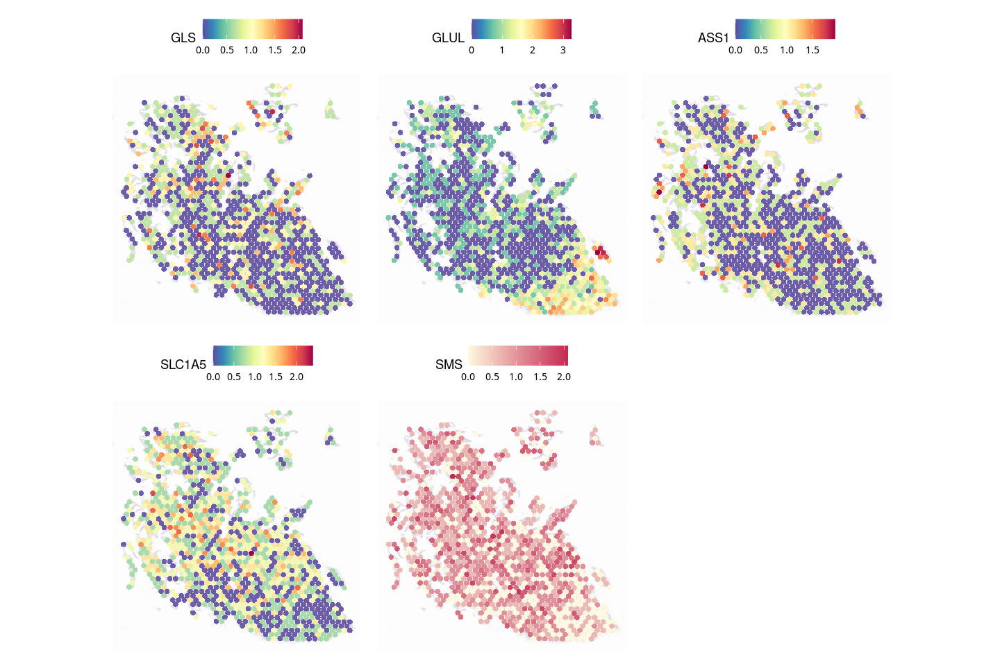

In [226]:
options(repr.plot.width=12, repr.plot.height=8)

SpatialPlot(st1_obj,features = c('GLS','GLUL','ASS1','SLC1A5','SMS'), ncol = 3, alpha = c(0.9, 1),
                    pt.size.factor=2.2, 
            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = colorRampPalette(c('#fffadf','#c52a52'))(500))


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


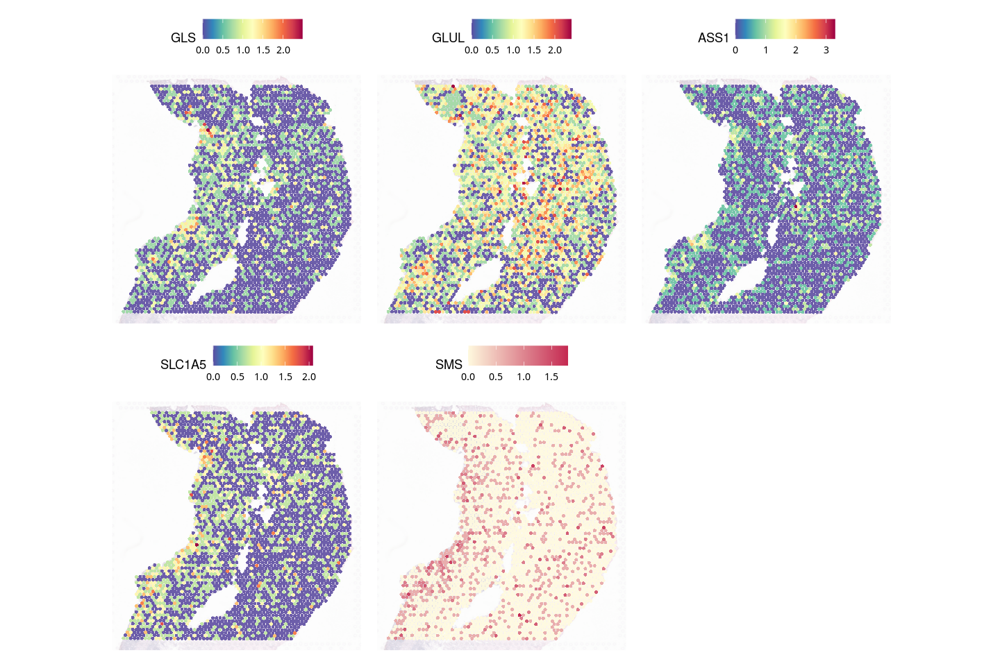

In [193]:
options(repr.plot.width=12, repr.plot.height=8)

SpatialPlot(st3_obj,features = c('GLS','GLUL','ASS1','SLC1A5','SMS'), ncol = 3, alpha = c(0.9, 1),
                    pt.size.factor=1.5, 
            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = colorRampPalette(c('#fffadf','#c52a52'))(500))


## Fig 3l

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


png 
  2

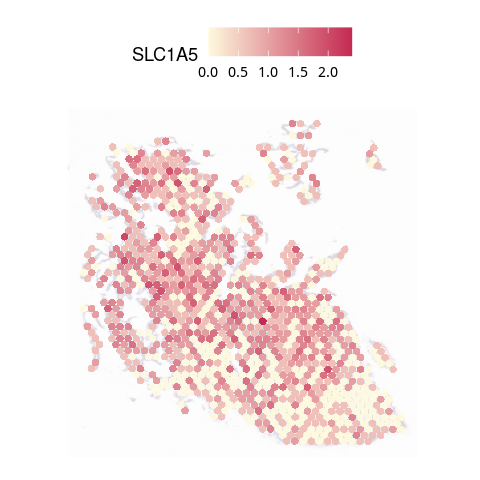

In [253]:
options(repr.plot.width=4, repr.plot.height=4)

SpatialPlot(st1_obj,features = c('SLC1A5'), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=2.2, 
            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = colorRampPalette(c('#fffadf','#c52a52'))(500))

pdf(file = './Fig_pdf/Fig3l_st1.pdf', width=4, height=4)
options(repr.plot.width=4, repr.plot.height=4)
p = SpatialPlot(st1_obj,features = c('SLC1A5'), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=2.2,
                            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = colorRampPalette(c('#fffadf','#c52a52'))(500)) +
theme(legend.position = "none")
p
dev.off()


png 
  2

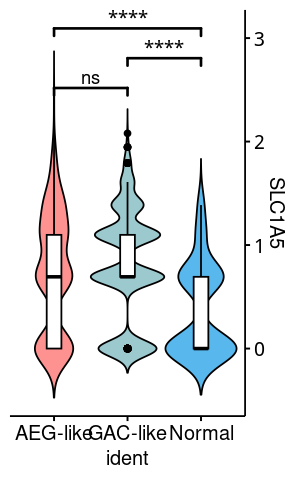

In [250]:
Idents(st1_obj) = factor(st1_obj@meta.data$assign.max, levels = c('Mal_AGEJ_like','Mal_GC_like','Normal'), labels = c('AEG-like','GAC-like','Normal'))
p = VlnPlot(st1_obj, features = c('SLC1A5'), pt.size=0)
plot_df = p[[1]]$data


options(repr.plot.width=2.5, repr.plot.height=4)
ggviolin(plot_df, x = "ident", y = 'SLC1A5', fill = "ident",
         # palette = c("#fd9291", "#9cc9ce"),
        palette = c( "#fd9291","#9cc9ce","#58b8ee"),
         # color='darkgrey',
             trim=F,
             width=1,
             # error.plot='none',
             remove='points',
             # order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('AEG-like','GAC-like'),c('GAC-like','Normal'),c('AEG-like','Normal')),
                     label = "p.signif", bracket.size=0.75)

pdf(file = './Fig_pdf/Fig3l_st1_boxplot.pdf', width=2.5, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
p = ggviolin(plot_df, x = "ident", y = 'SLC1A5', fill = "ident",
         # palette = c("#fd9291", "#9cc9ce"),
        palette = c( "#fd9291","#9cc9ce","#58b8ee"),
         # color='darkgrey',
             trim=F,
             width=1,
             # error.plot='none',
             remove='points',
             # order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('AEG-like','GAC-like'),c('GAC-like','Normal'),c('AEG-like','Normal')),
                     label = "p.signif", bracket.size=0.75)
p
dev.off()


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


png 
  2

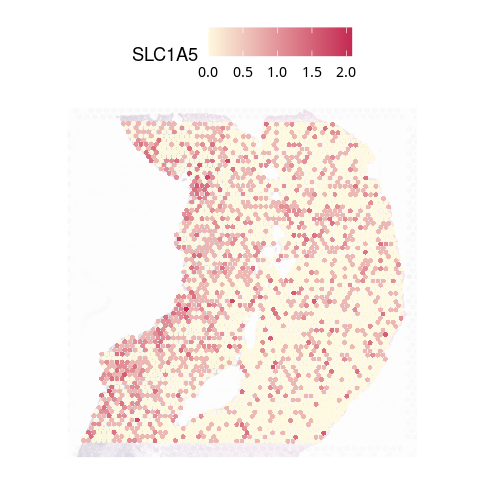

In [254]:
options(repr.plot.width=4, repr.plot.height=4)

SpatialPlot(st3_obj,features = c('SLC1A5'), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=1.5, 
            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = colorRampPalette(c('#fffadf','#c52a52'))(500))

pdf(file = './Fig_pdf/Fig3l_st3.pdf', width=4, height=4)
options(repr.plot.width=4, repr.plot.height=4)
p = SpatialPlot(st3_obj,features = c('SLC1A5'), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=1.5,
                            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = colorRampPalette(c('#fffadf','#c52a52'))(500)) +
theme(legend.position = "none")
p
dev.off()


png 
  2

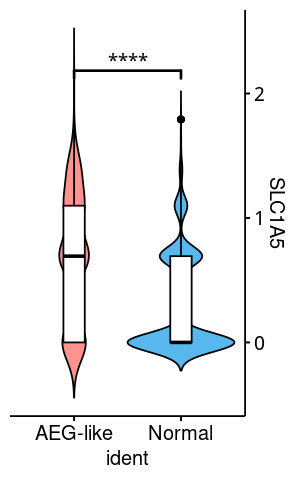

In [252]:

Idents(st1_obj) = factor(st3_obj@meta.data$assign.max, levels = c('Mal_AGEJ_like','Mal_GC_like','Normal'), labels = c('AEG-like','GAC-like','Normal'))
p = VlnPlot(st3_obj, features = c('SLC1A5'), pt.size=0)
plot_df = p[[1]]$data


options(repr.plot.width=2.5, repr.plot.height=4)
ggviolin(plot_df, x = "ident", y = 'SLC1A5', fill = "ident",
         # palette = c("#fd9291", "#9cc9ce"),
        palette = c( "#fd9291","#58b8ee"),
         # color='darkgrey',
             trim=F,
             width=1,
             # error.plot='none',
             remove='points',
             # order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('AEG-like','Normal')),
                     label = "p.signif", bracket.size=0.75)

pdf(file = './Fig_pdf/Fig3l_st3_boxplot.pdf', width=2.5, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
p = ggviolin(plot_df, x = "ident", y = 'SLC1A5', fill = "ident",
         # palette = c("#fd9291", "#9cc9ce"),
        palette = c( "#fd9291","#58b8ee"),
         # color='darkgrey',
             trim=F,
             width=1,
             # error.plot='none',
             remove='points',
             # order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('AEG-like','Normal')),
                     label = "p.signif", bracket.size=0.75)
p
dev.off()


## Fig 3m

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


png 
  2

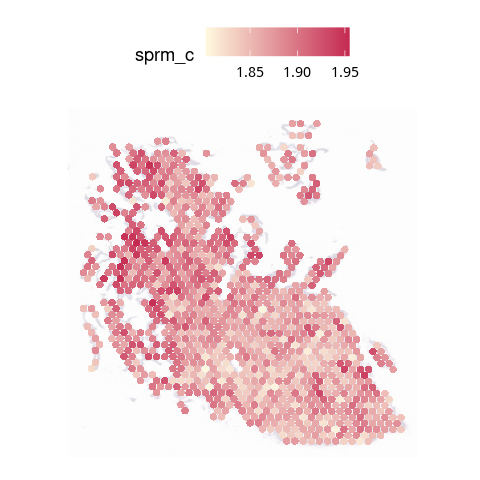

In [261]:
tmp_met = 'sprm_c'

options(repr.plot.width=4, repr.plot.height=4)
SpatialPlot(st1_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=2.2,
            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = colorRampPalette(c('#fffadf','#c52a52'))(500))

pdf(file = './Fig_pdf/Fig3m_st1.pdf', width=4, height=4)
options(repr.plot.width=4, repr.plot.height=4)
p = SpatialPlot(st1_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=2.2,
                            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = colorRampPalette(c('#fffadf','#c52a52'))(500)) +
theme(legend.position = "none")
p
dev.off()


png 
  2

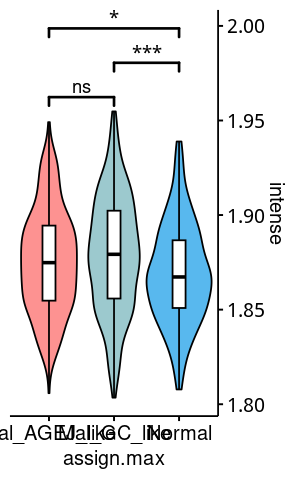

In [263]:
select_features = c('glc_D_e','glc_D_l','gal_l','gln_L_c','gln_L_m','sprm_c','glu_L_c')

tmp_max = c()
tmp_fc = c()
tmp_type = c()
for (tmp_f in select_features){
    tmp_max = c(tmp_max, st1_obj@meta.data[,'assign.max'])
    tmp_fc = c(tmp_fc, st1_obj@meta.data[,tmp_f])
    tmp_type = c(tmp_type, rep(tmp_f, dim(st1_obj@meta.data)[1]))
}
plot_df = data.frame(list(
    assign.max = tmp_max,
    intense = tmp_fc,
    type = tmp_type
)
)

tmp_met = 'sprm_c'

# pdf(file = './Fig_pdf/Fig3f_glucose_st1_boxplot.pdf', width=4, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         # palette = c("#fd9291", "#9cc9ce"),
        palette = c( "#fd9291","#9cc9ce","#58b8ee"),
         # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             # order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Mal_AGEJ_like','Mal_GC_like'),c('Mal_GC_like','Normal'),c('Mal_AGEJ_like','Normal')),
                     label = "p.signif", bracket.size=0.75)

pdf(file = './Fig_pdf/Fig3_st1_boxplot.pdf', width=2.5, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
p = ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         # palette = c("#fd9291", "#9cc9ce"),
        palette = c( "#fd9291","#9cc9ce","#58b8ee"),
         # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             # order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Mal_AGEJ_like','Mal_GC_like'),
                                        c('Mal_GC_like','Normal'),
                                        c('Mal_AGEJ_like','Normal')),
                     method.args = list(alternative = "greater"),
                     label = "p.signif", bracket.size=0.75)
p
dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


png 
  2

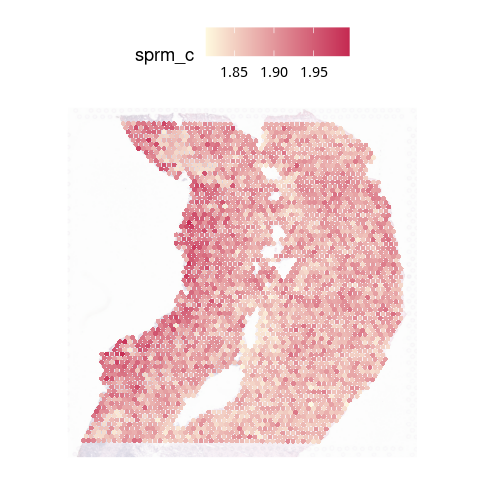

In [123]:
tmp_met = 'sprm_c'

options(repr.plot.width=4, repr.plot.height=4)
SpatialPlot(st3_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=1.5, 
            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = colorRampPalette(c('#fffadf','#c52a52'))(500))
# scale_fill_gradientn(colours = rev(colorRampPalette(c('#fffadf','#ffbcaf','#c52a52'))(200)))
pdf(file = './Fig_pdf/Fig3m_spermine_st3.pdf', width=4, height=4)
options(repr.plot.width=4, repr.plot.height=4)
p = SpatialPlot(st3_obj,features = c(tmp_met), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=1.5,
                            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = colorRampPalette(c('#fffadf','#c52a52'))(500)) +
theme(legend.position = "none")
p
dev.off()


png 
  2

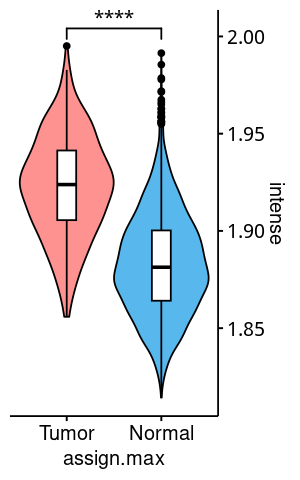

In [124]:
select_features = c('sprm_c')

tmp_max = c()
tmp_fc = c()
tmp_type = c()
for (tmp_f in select_features){
    tmp_max = c(tmp_max, st3_obj@meta.data[,'assign.max'])
    tmp_fc = c(tmp_fc, st3_obj@meta.data[,tmp_f])
    tmp_type = c(tmp_type, rep(tmp_f, dim(st3_obj@meta.data)[1]))
}
plot_df = data.frame(list(
    assign.max = tmp_max,
    intense = tmp_fc,
    type = tmp_type
)
)

tmp_met = 'sprm_c'

# pdf(file = './Fig_pdf/Fig3f_glucose_st1_boxplot.pdf', width=4, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         palette = c("#fd9291", "#58b8ee"),
             # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Tumor','Normal')),
                     label = "p.signif", bracket.size=0.5)

pdf(file = './Fig_pdf/Fig3m_spermine_st3_boxplot.pdf', width=2.5, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
p = ggviolin(plot_df[plot_df$type == tmp_met,], x = "assign.max", y = 'intense', fill = "assign.max",
         palette = c("#fd9291", "#58b8ee"),
             # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             order=c('Tumor','Normal'),
         add = "boxplot", add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('Tumor','Normal')),
                     label = "p.signif", bracket.size=0.5)
p
dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


png 
  2

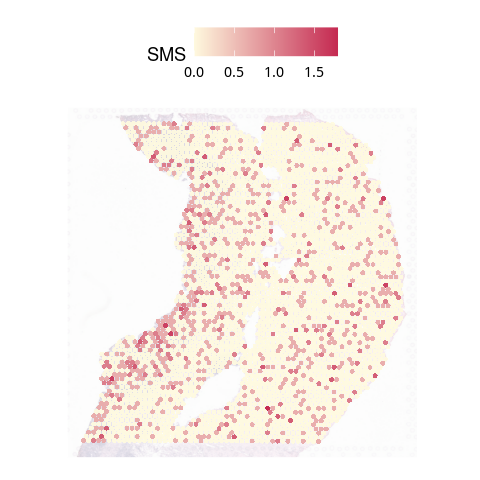

In [114]:
options(repr.plot.width=4, repr.plot.height=4)

SpatialPlot(st3_obj,features = c('SMS'), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=1.5, 
            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = colorRampPalette(c('#fffadf','#c52a52'))(500))

pdf(file = './Fig_pdf/Fig3m_st3_SMS.pdf', width=4, height=4)
options(repr.plot.width=4, repr.plot.height=4)
p = SpatialPlot(st3_obj,features = c('SMS'), ncol = 1, alpha = c(0.9, 1),
                    pt.size.factor=1.5,
                            stroke=NA,
                 image.alpha = 0.2, combine=T) + scale_fill_gradientn(colours = colorRampPalette(c('#fffadf','#c52a52'))(500)) +
theme(legend.position = "none")
p
dev.off()


png 
  2

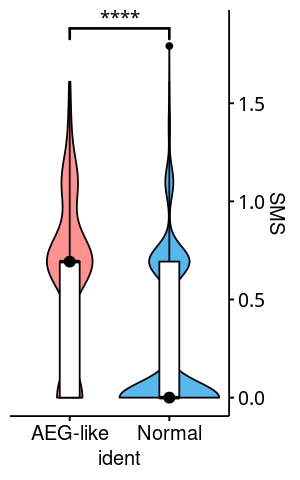

In [134]:
Idents(st3_obj) = factor(st3_obj@meta.data$assign.max, levels = c('Tumor','Normal'), labels = c('AEG-like','Normal'))
p = VlnPlot(st3_obj, features = c('SMS'), pt.size=0)
plot_df = p[[1]]$data


options(repr.plot.width=2.5, repr.plot.height=4)
ggviolin(plot_df[plot_df$SMS > 0,], x = "ident", y = 'SMS', fill = "ident",
         # palette = c("#fd9291", "#9cc9ce"),
        palette = c( "#fd9291","#58b8ee"),
         # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             # order=c('Tumor','Normal'),
         add = c("boxplot",'median'), add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('AEG-like','Normal')),
                     label = "p.signif", bracket.size=0.75)

pdf(file = './Fig_pdf/Fig3m_st3_boxplot_SMS.pdf', width=2.5, height=4)
options(repr.plot.width=2.5, repr.plot.height=4)
p = ggviolin(plot_df[plot_df$SMS > 0,], x = "ident", y = 'SMS', fill = "ident",
         # palette = c("#fd9291", "#9cc9ce"),
        palette = c( "#fd9291","#58b8ee"),
         # color='darkgrey',
             trim=T,
             width=1,
             # error.plot='none',
             remove='points',
             # order=c('Tumor','Normal'),
         add = c("boxplot",'median'), add.params = list(fill = "white"))+
scale_y_continuous(position = "right") +
  # facet_wrap(~type,  ncol=3, scale='free_y')  + 
  theme(strip.text.x = element_text(size = 16,face="bold"), legend.position = "none") +
  stat_compare_means(comparisons = list(c('AEG-like','Normal')),
                     label = "p.signif", bracket.size=0.75)
p
dev.off()


# Fig 4

In [206]:
T_obj = readRDS('~/project/TongjiHospital/add_new_new_samples/Immune_subset/T_SCT_harmony.rds')
B_obj = readRDS('~/project/TongjiHospital/add_new_new_samples/Immune_subset/B_SCT_harmony.rds')
Mye_obj = readRDS('~/project/TongjiHospital/add_new_new_samples/Immune_subset/Mono_Macro_SCT_harmony.rds')

In [ ]:
saveRDS(T_obj, file='~/project/TongjiHospital/add_new_new_samples/Immune_subset/T_SCT_harmony.rds')
saveRDS(B_obj, file='~/project/TongjiHospital/add_new_new_samples/Immune_subset/B_SCT_harmony.rds')
saveRDS(Mye_obj, file='~/project/TongjiHospital/add_new_new_samples/Immune_subset/Mono_Macro_SCT_harmony.rds')

## Fig 4a

png 
  2

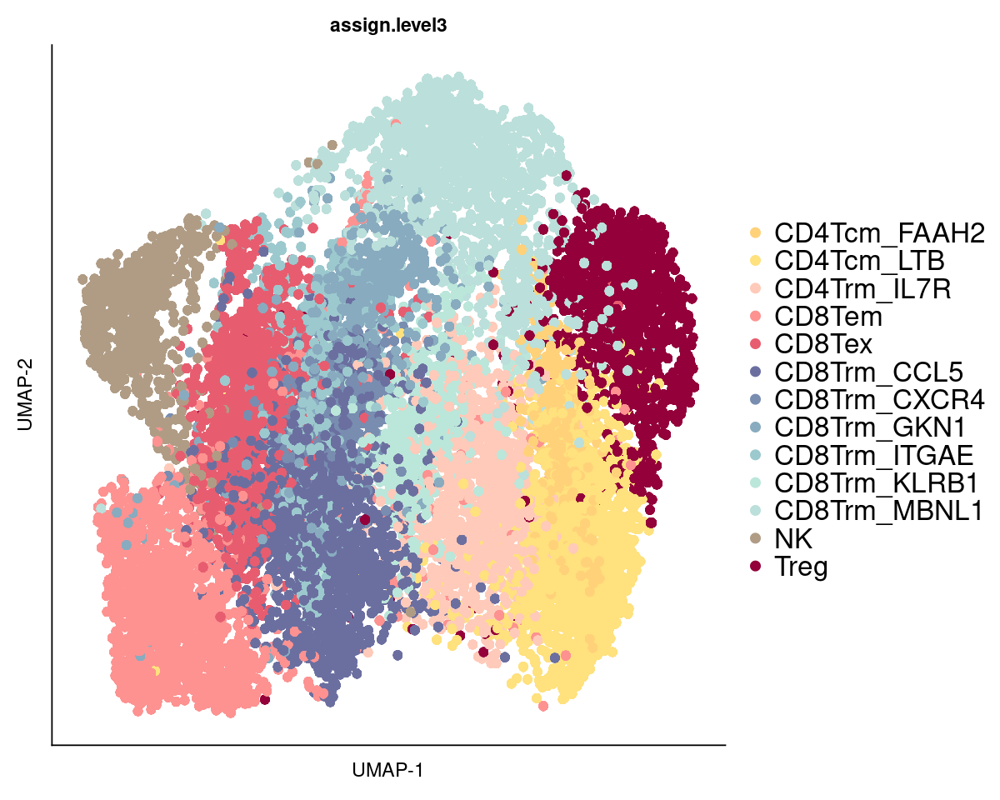

In [226]:
pdf(file = './Fig_pdf/Fig4a.pdf', width=10, height=8)
options(repr.plot.width=10, repr.plot.height=8)
p = DimPlot(T_obj, label = F, pt.size=15, group.by='assign.level3',
            cols=
        # cols=c('#6b6fa0', '#6c81ad', '#7092b9', '#79a3c5', '#8cb2d0', '#c3b8d1', '#ffd27a', '#faa66e', '#eb7c62', '#d25653', '#ad3b3f', '#584700'),
            # cols=c('#919191', '#7ca7c0', '#8cbac2', '#9ecdc0', '#b4dfba', '#cff1ac', '#ffd27a', '#faa66e', '#eb7c62', '#d25653', '#ad3b3f', '#584700'),
            # cols=c('#234fc2', '#4169d3', '#5a85dc', '#6da2e3', '#7ec0e7', '#8bdfe9', '#ffd27a', '#faa66e', '#eb7c62', '#d25653', '#ad3b3f', '#584700'),
            # cols=c('#6b6fa0', '#788db0', '#88abbf', '#9cc9ce', '#bbe6da', '#ffd27a', '#ffcab9', '#fd9291', '#e75d6f', '#c52a52', '#93003a', '#584700'),
           # cols= c('#6b6fa0', '#788db0', '#88abbf', '#9cc9ce', '#bbe6da', '#ffd27a', '#ffcab9', '#fd9291', '#e75d6f', '#c52a52', '#93003a', '#584700','#584700'),
            c('#ffd27a', '#ffe17d', '#ffcab9', '#fd9291', '#e75d6f', '#6b6fa0', '#788db0', '#88abbf', '#9cc9ce', '#bbe6da', '#bbdfda', '#B09C85D8', '#93003a'),
            # c('#3C5488D8','#4DBBD5D8','#00A087D8','#8491B47F', '#B09C85D8','#ffd241','#ffa24d','#E64B35D8'),
        # label.size=8,
        raster=T,
        raster.dpi=c(2048,2048)
       ) +
xlab('UMAP-1') + ylab('UMAP-2')+
theme(text=element_text(size=12),
      axis.text=element_text(size=0),
      axis.title=element_text(size=14),
      axis.ticks = element_blank(),
    legend.text=element_text(size=20))
p
dev.off()
p

In [229]:
levels(as.factor(T_obj@meta.data$assign.level3))

[1] "CD4Tcm_FAAH2" "CD4Tcm_LTB"   "CD4Trm_IL7R"  "CD8Tem"       "CD8Tex"      
 [6] "CD8Trm_CCL5"  "CD8Trm_CXCR4" "CD8Trm_GKN1"  "CD8Trm_ITGAE" "CD8Trm_KLRB1"
[11] "CD8Trm_MBNL1" "NK"           "Treg"

In [227]:
dim(T_obj)

[1] 28703 12893

In [225]:
table(T_obj@meta.data$assign.level2)


CD4Tcm CD4Trm CD8Tem CD8Tex CD8Trm     NK   Treg 
  1977   1069   1645   1179   5053    802   1168 

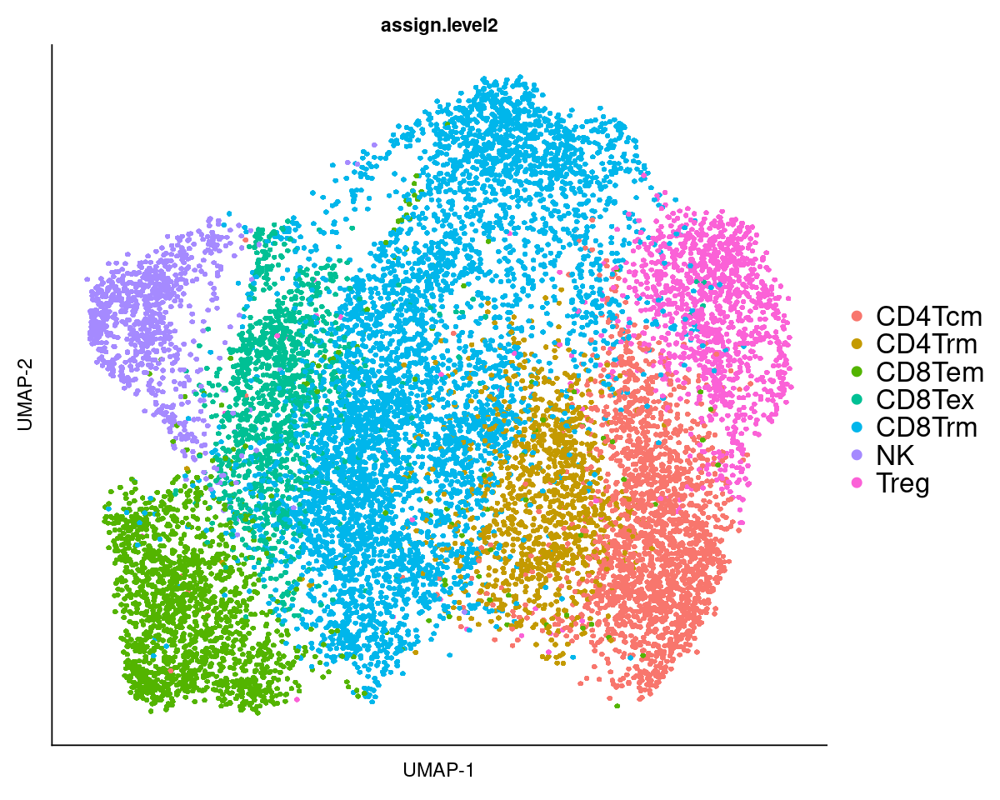

In [210]:
p = DimPlot(T_obj, label = F, pt.size=7, group.by='assign.level2',
        # cols=c('#6b6fa0', '#6c81ad', '#7092b9', '#79a3c5', '#8cb2d0', '#c3b8d1', '#ffd27a', '#faa66e', '#eb7c62', '#d25653', '#ad3b3f', '#584700'),
            # cols=c('#919191', '#7ca7c0', '#8cbac2', '#9ecdc0', '#b4dfba', '#cff1ac', '#ffd27a', '#faa66e', '#eb7c62', '#d25653', '#ad3b3f', '#584700'),
            # cols=c('#234fc2', '#4169d3', '#5a85dc', '#6da2e3', '#7ec0e7', '#8bdfe9', '#ffd27a', '#faa66e', '#eb7c62', '#d25653', '#ad3b3f', '#584700'),
            # cols=c('#6b6fa0', '#788db0', '#88abbf', '#9cc9ce', '#bbe6da', '#ffd27a', '#ffcab9', '#fd9291', '#e75d6f', '#c52a52', '#93003a', '#584700'),
        # label.size=8,
        raster=T,
        raster.dpi=c(2048,2048)
       ) +
xlab('UMAP-1') + ylab('UMAP-2')+
theme(text=element_text(size=12),
      axis.text=element_text(size=0),
      axis.title=element_text(size=14),
      axis.ticks = element_blank(),
    legend.text=element_text(size=20))
p


In [234]:
table(T_obj@meta.data$Source)


       1        2 adjacent    tumor 
    2943     1424     2423     6103 

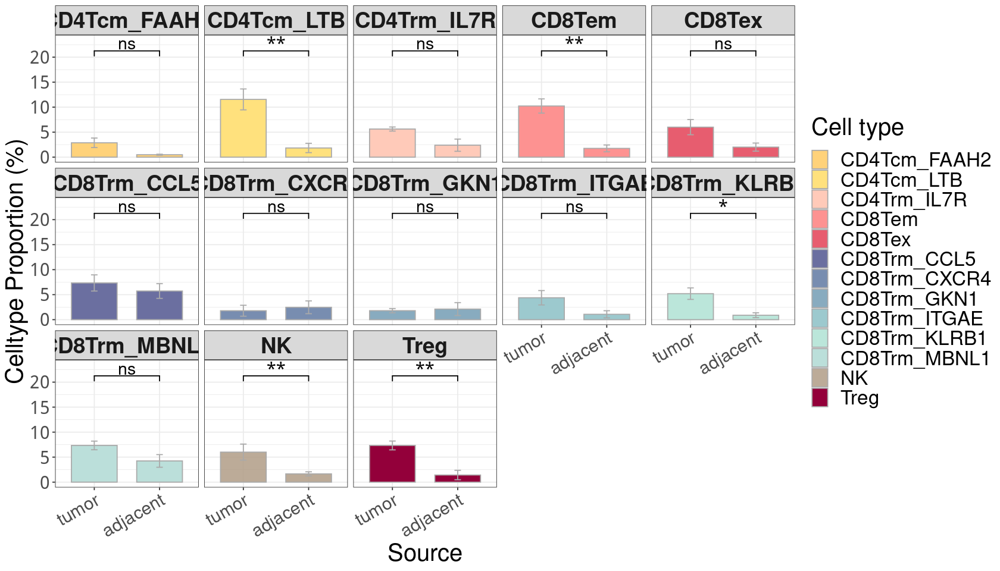

In [265]:
T_obj@meta.data$Source = gsub(1,'tumor',T_obj@meta.data$Source)
T_obj@meta.data$Source = gsub(2,'adjacent',T_obj@meta.data$Source)

ct_sample_count_df = T_obj@meta.data[,c('Source','assign.level3','Sample','Patient')] %>%
                        group_by(Source) %>% count(Patient,assign.level3)
colnames(ct_sample_count_df) = c('Source','Sample','Cell type','n')

sample_count_df = T_obj@meta.data[,c('Patient','Source')] %>% count(Patient)
colnames(sample_count_df) = c('Sample','Sample_freq')

plot_df = merge(ct_sample_count_df, sample_count_df)
plot_df$Celltype_Proportion = plot_df$n/plot_df$Sample_freq*100

options(repr.plot.width=14, repr.plot.height=8)
p <- ggbarplot(plot_df, x = "Source", y = "Celltype_Proportion",color= "darkgrey",
          position = position_dodge(0.8), 
               palette=c('#ffd27a', '#ffe17d', '#ffcab9', '#fd9291', '#e75d6f', '#6b6fa0', '#788db0', '#88abbf', '#9cc9ce', '#bbe6da', '#bbdfda', '#B09C85D8', '#93003a'),
               fill='Cell type', add = "mean_se") +
  theme_bw() + 
  theme(legend.text = element_text(size = 20), 
       legend.title = element_text(size = 24), 
       axis.text.x=element_text(size=18,angle=30,hjust=1),
       axis.text.y=element_text(size=18),
       axis.title=element_text(size=24)) +
  facet_wrap(~`Cell type`,  ncol=5)  + 
  theme(strip.text.x = element_text(size = 22,face="bold")) +
  ylab('Celltype Proportion (%)') +
  scale_x_discrete(limits=c("tumor", "adjacent")) +
  stat_compare_means(comparisons = list(c('tumor','adjacent')),
                   label = 'p.signif',
                   label.x=1.5,
                   step.increase=0.1, bracket.size=0.5,
                     size=6, tip.length=0.05,hide.ns = F) + 
scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))
print(p)
# ggsave('./Fig_pdf/Fig1d.pdf', width=14, height=8, dpi=500, bg='transparent')
# dev.off()


## Fig 4b

png 
  2

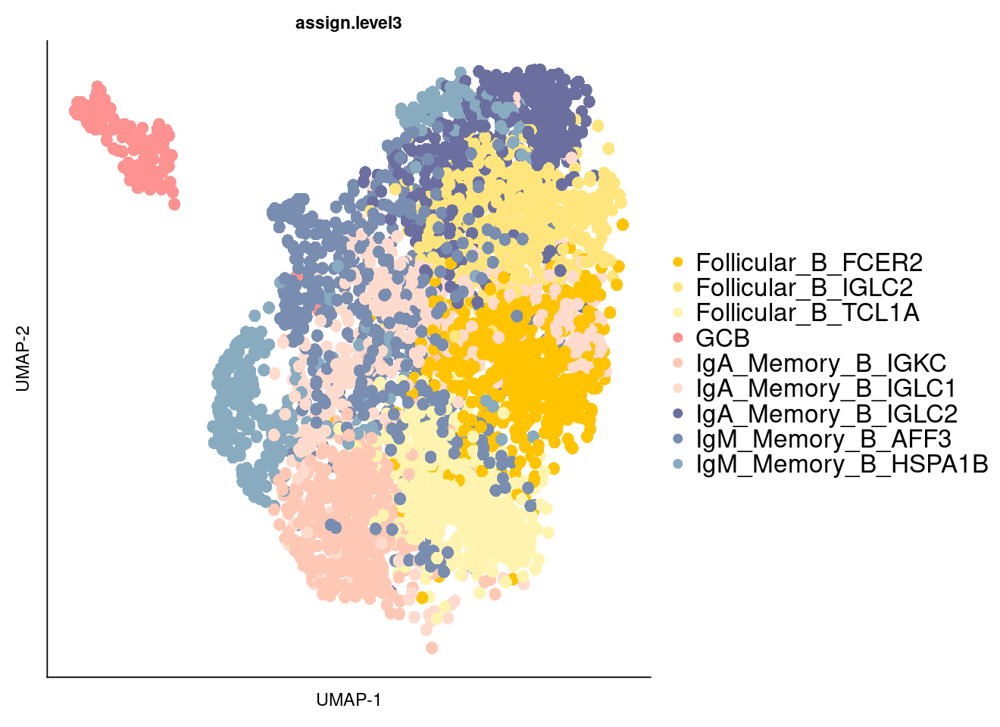

In [248]:
pdf(file = './Fig_pdf/Fig4b.pdf', width=11, height=8)
options(repr.plot.width=11, repr.plot.height=8)
p = DimPlot(B_obj, label = F, pt.size=20, group.by='assign.level3',
            cols=
        # cols=c('#6b6fa0', '#6c81ad', '#7092b9', '#79a3c5', '#8cb2d0', '#c3b8d1', '#ffd27a', '#faa66e', '#eb7c62', '#d25653', '#ad3b3f', '#584700'),
            # cols=c('#919191', '#7ca7c0', '#8cbac2', '#9ecdc0', '#b4dfba', '#cff1ac', '#ffd27a', '#faa66e', '#eb7c62', '#d25653', '#ad3b3f', '#584700'),
            # cols=c('#234fc2', '#4169d3', '#5a85dc', '#6da2e3', '#7ec0e7', '#8bdfe9', '#ffd27a', '#faa66e', '#eb7c62', '#d25653', '#ad3b3f', '#584700'),
            # cols=c('#6b6fa0', '#788db0', '#88abbf', '#9cc9ce', '#bbe6da', '#ffd27a', '#ffcab9', '#fd9291', '#e75d6f', '#c52a52', '#93003a', '#584700'),
           # cols= c('#6b6fa0', '#788db0', '#88abbf', '#9cc9ce', '#bbe6da', '#ffd27a', '#ffcab9', '#fd9291', '#e75d6f', '#c52a52', '#93003a', '#584700','#584700'),
            c('#ffc300',  '#ffe57c', '#fff4af', '#fd9291', '#ffc8b5', '#ffdbce', '#6b6fa0', '#788db0', '#88abbf'),
            # c('#3C5488D8','#4DBBD5D8','#00A087D8','#8491B47F', '#B09C85D8','#ffd241','#ffa24d','#E64B35D8'),
        # label.size=8,
        raster=T,
        raster.dpi=c(2048,2048)
       ) +
xlab('UMAP-1') + ylab('UMAP-2')+
theme(text=element_text(size=12),
      axis.text=element_text(size=0),
      axis.title=element_text(size=14),
      axis.ticks = element_blank(),
    legend.text=element_text(size=20))
p
dev.off()
p

In [249]:
table(B_obj@meta.data$assign.level2)


Follicular_B          GCB IgA_Memory_B IgM_Memory_B 
        1813          171         1338          952 

Warning message in stats::qt(ci/2 + 0.5, data_sum$length - 1):
“产生了NaNs”
Warning message in wilcox.test.default(c(0.0377216144851, 1.41010575793185, 37.8151260504202, :
“无法精確計算带连结的p值”
Warning message in wilcox.test.default(c(11.6, 11.2410411165598, 13.1609870740306, :
“无法精確計算带连结的p值”
Warning message in wilcox.test.default(c(9.2, 3.4703885326292, 10.8108108108108, :
“无法精確計算带连结的p值”


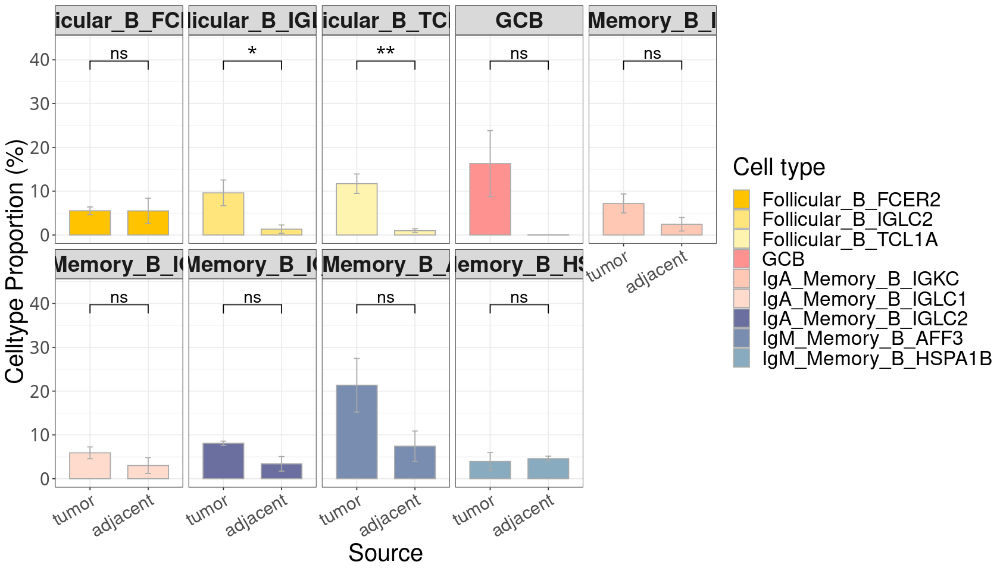

In [264]:
B_obj@meta.data$Source = gsub(1,'tumor',B_obj@meta.data$Source)
B_obj@meta.data$Source = gsub(2,'adjacent',B_obj@meta.data$Source)

ct_sample_count_df = B_obj@meta.data[,c('Source','assign.level3','Sample','Patient')] %>%
                        group_by(Source) %>% count(Patient,assign.level3)
colnames(ct_sample_count_df) = c('Source','Sample','Cell type','n')

sample_count_df = B_obj@meta.data[,c('Patient','Source')] %>% count(Patient)
colnames(sample_count_df) = c('Sample','Sample_freq')

plot_df = merge(ct_sample_count_df, sample_count_df)
plot_df$Celltype_Proportion = plot_df$n/plot_df$Sample_freq*100
plot_df[is.na(plot_df)] = 0

options(repr.plot.width=14, repr.plot.height=8)
p <- ggbarplot(plot_df, x = "Source", y = "Celltype_Proportion",color= "darkgrey",
          position = position_dodge(0.8), 
               palette=c('#ffc300',  '#ffe57c', '#fff4af', '#fd9291', '#ffc8b5', '#ffdbce', '#6b6fa0', '#788db0', '#88abbf'),
               fill='Cell type', add = "mean_se") +
  theme_bw() + 
  theme(legend.text = element_text(size = 20), 
       legend.title = element_text(size = 24), 
       axis.text.x=element_text(size=18,angle=30,hjust=1),
       axis.text.y=element_text(size=18),
       axis.title=element_text(size=24)) +
  facet_wrap(~`Cell type`,  ncol=5)  + 
  theme(strip.text.x = element_text(size = 22,face="bold")) +
  ylab('Celltype Proportion (%)') +
  scale_x_discrete(limits=c("tumor", "adjacent")) +
stat_compare_means(comparisons = list(c('tumor','adjacent')),
                   label = 'p.signif',
                   label.x=1.5,
                   step.increase=0.1, bracket.size=0.5,
                     size=6, tip.length=0.05,hide.ns = F) + 
scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))
print(p)
# ggsave('./Fig_pdf/Fig1d.pdf', width=14, height=8, dpi=500, bg='transparent')
# dev.off()


Warning message in stats::qt(ci/2 + 0.5, data_sum$length - 1):
“产生了NaNs”


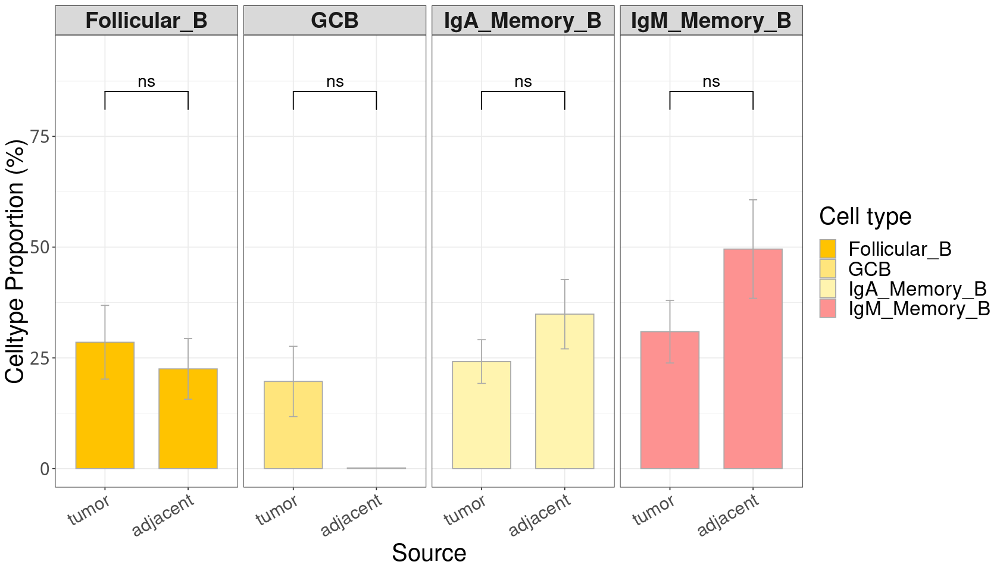

In [252]:
B_obj@meta.data$Source = gsub(1,'tumor',B_obj@meta.data$Source)
B_obj@meta.data$Source = gsub(2,'adjacent',B_obj@meta.data$Source)

ct_sample_count_df = B_obj@meta.data[,c('Source','assign.level2','Sample','Patient')] %>%
                        group_by(Source) %>% count(Sample,assign.level2)
colnames(ct_sample_count_df) = c('Source','Sample','Cell type','n')

sample_count_df = B_obj@meta.data[,c('Sample','Source')] %>% count(Sample)
colnames(sample_count_df) = c('Sample','Sample_freq')

plot_df = merge(ct_sample_count_df, sample_count_df)
plot_df$Celltype_Proportion = plot_df$n/plot_df$Sample_freq*100
plot_df[is.na(plot_df)] = 0

options(repr.plot.width=14, repr.plot.height=8)
p <- ggbarplot(plot_df, x = "Source", y = "Celltype_Proportion",color= "darkgrey",
          position = position_dodge(0.8), 
               palette=c('#ffc300',  '#ffe57c', '#fff4af', '#fd9291', '#ffc8b5', '#ffdbce', '#6b6fa0', '#788db0', '#88abbf'),
               fill='Cell type', add = "mean_se") +
  theme_bw() + 
  theme(legend.text = element_text(size = 20), 
       legend.title = element_text(size = 24), 
       axis.text.x=element_text(size=18,angle=30,hjust=1),
       axis.text.y=element_text(size=18),
       axis.title=element_text(size=24)) +
  facet_wrap(~`Cell type`,  ncol=5)  + 
  theme(strip.text.x = element_text(size = 22,face="bold")) +
  ylab('Celltype Proportion (%)') +
  # scale_x_discrete(limits=c("chemo", "no_treatment")) +
  stat_compare_means(comparisons = list(c('tumor','adjacent')),
                   label = 'p.signif',
                   label.x=1.5,
                   step.increase=0.1, bracket.size=0.5,
                     size=6, tip.length=0.05,hide.ns = F) + 
scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))
print(p)
# ggsave('./Fig_pdf/Fig1d.pdf', width=14, height=8, dpi=500, bg='transparent')
# dev.off()


## Fig 4c

png 
  2

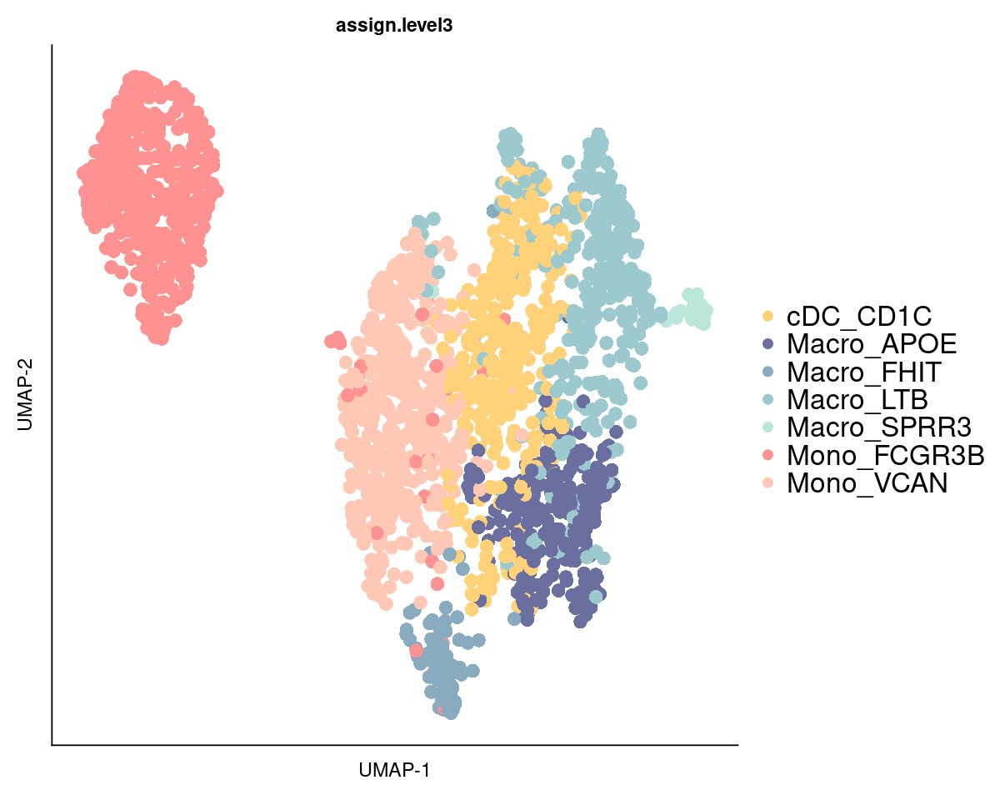

In [257]:
pdf(file = './Fig_pdf/Fig4c.pdf', width=10, height=8)
options(repr.plot.width=10, repr.plot.height=8)
p = DimPlot(Mye_obj, label = F, pt.size=20, group.by='assign.level3',
            cols=
            c('#ffd27a','#6b6fa0', '#88abbf', '#9cc9ce', '#bbe6da', '#fd9291', '#ffc8b5'),
        raster=T,
        raster.dpi=c(2048,2048)
       ) +
xlab('UMAP-1') + ylab('UMAP-2')+
theme(text=element_text(size=12),
      axis.text=element_text(size=0),
      axis.title=element_text(size=14),
      axis.ticks = element_blank(),
    legend.text=element_text(size=20))
p
dev.off()
p

In [268]:
table(Mye_obj@meta.data$assign.level2)


  cDC Macro  Mono 
  353   709   977 

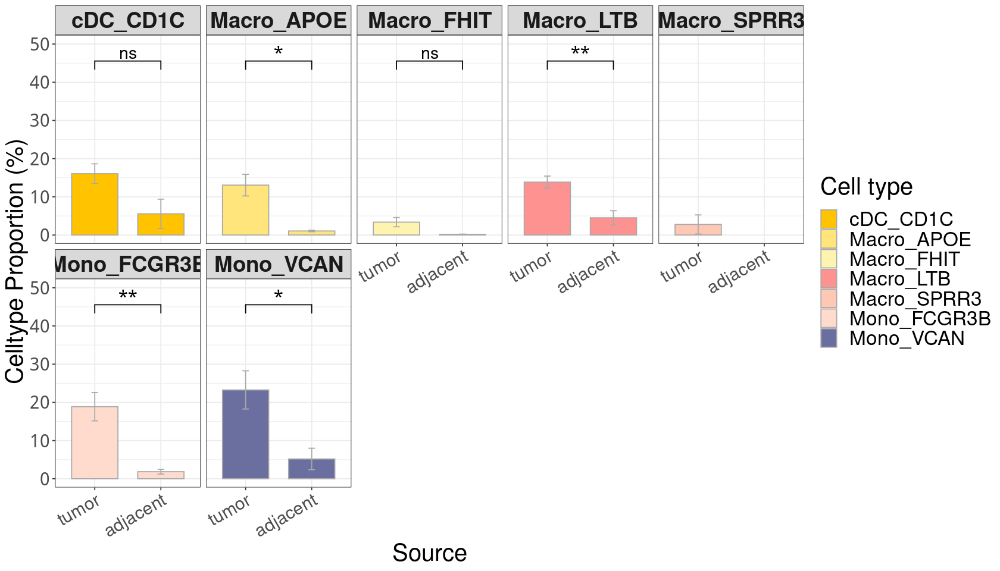

In [262]:
Mye_obj@meta.data$Source = gsub(1,'tumor',Mye_obj@meta.data$Source)
Mye_obj@meta.data$Source = gsub(2,'adjacent',Mye_obj@meta.data$Source)

ct_sample_count_df = Mye_obj@meta.data[,c('Source','assign.level3','Sample','Patient')] %>%
                        group_by(Source) %>% count(Patient,assign.level3)
colnames(ct_sample_count_df) = c('Source','Sample','Cell type','n')

sample_count_df = Mye_obj@meta.data[,c('Patient','Source')] %>% count(Patient)
colnames(sample_count_df) = c('Sample','Sample_freq')

plot_df = merge(ct_sample_count_df, sample_count_df)
plot_df$Celltype_Proportion = plot_df$n/plot_df$Sample_freq*100
plot_df[is.na(plot_df)] = 0

options(repr.plot.width=14, repr.plot.height=8)
p <- ggbarplot(plot_df, x = "Source", y = "Celltype_Proportion",color= "darkgrey",
          position = position_dodge(0.8), 
               palette=c('#ffc300',  '#ffe57c', '#fff4af', '#fd9291', '#ffc8b5', '#ffdbce', '#6b6fa0', '#788db0', '#88abbf'),
               fill='Cell type', add = "mean_se") +
  theme_bw() + 
  theme(legend.text = element_text(size = 20), 
       legend.title = element_text(size = 24), 
       axis.text.x=element_text(size=18,angle=30,hjust=1),
       axis.text.y=element_text(size=18),
       axis.title=element_text(size=24)) +
  facet_wrap(~`Cell type`,  ncol=5)  + 
  theme(strip.text.x = element_text(size = 22,face="bold")) +
  ylab('Celltype Proportion (%)') +
  scale_x_discrete(limits=c("tumor", "adjacent")) +
  stat_compare_means(comparisons = list(c('tumor','adjacent')),
                   label = 'p.signif',
                   label.x=1.5,
                   step.increase=0.1, bracket.size=0.5,
                     size=6, tip.length=0.05,hide.ns = F) + 
scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))
print(p)
# ggsave('./Fig_pdf/Fig1d.pdf', width=14, height=8, dpi=500, bg='transparent')
# dev.off()


## Fig 4d

In [276]:
all_sample_obj = get(load('./CellChat/Malignant_CCI/full_set/assign_level3_cellchat.rds'))
all_sample_obj = netAnalysis_computeCentrality(all_sample_obj)


In [277]:
saveRDS(all_sample_obj, file='./CellChat/Malignant_CCI/full_set/assign_level3_cellchat.rds')

In [331]:
p = netAnalysis_signalingRole_scatter(all_sample_obj)
plot_df = p$data

# keep only immune cells
Immune_celltypes = plot_df$labels
Immune_celltypes = Immune_celltypes[!Immune_celltypes %in% c('Mal_GC_like','Endothelial','Fibroblasts','Mal_AGEJ_like','Mal_EAC_like','Myofibroblasts')]

plot_df = plot_df[plot_df$labels %in% Immune_celltypes, ]

all_sample_meta = read.delim('/fs/home/liuzhaoyang/project/TongjiHospital/add_new_new_samples/assign_levels_mapping.tsv')
colnames(all_sample_meta) = c('assign.level1','labels_l2','labels')
plot_df = merge(plot_df, all_sample_meta, by = 'labels')
plot_df$labels_l2 = gsub('CD4T.*','CD4T', plot_df$labels_l2)
plot_df$labels_l2 = gsub('CD8T.*','CD8T', plot_df$labels_l2)
plot_df$labels_l2 = factor(plot_df$labels_l2,
                           levels=c('CD4T','CD8T','Treg','Follicular_B','IgA_Memory_B','IgM_Memory_B','GCB','Plasma','Mono','Macro','cDC','NK','Mast')
                          )


Signaling role analysis on the aggregated cell-cell communication network from all signaling pathways



In [333]:
pdf(file = './Fig_pdf/Fig4d.pdf', width=10, height=8)
options(repr.plot.width=10, repr.plot.height=8)
p = ggscatter(
  plot_df, x = "x", y = "y", 
    palette=c('#ffd27a', '#ffe17d', '#ffcab9', '#fd9291', '#e75d6f', '#6b6fa0', '#788db0', '#88abbf', '#9cc9ce', '#bbe6da', '#bbdfda', '#B09C85D8', '#93003a'),
  color = "labels_l2", size = "Count", 
    alpha=0.75,
    # label='labels',
    # label.select =c('Macro_APOE','CD8Tex','CD8Trm_CXCR4','CD8Trm_ITGAE','cDC_CD1C','CD8Trm_CCL5'),
    font.label = c(20, "plain"),
    font.family = "Arial",
    repel= T,
    xlab='Outgoing CCI strength',
    ylab='Incoming CCI strength'
) + 
scale_size_continuous(range = c(2, 15)) +
theme_bw() +
  theme(text=element_text(size=20),
        axis.text.x = element_text(size = 16),
        axis.text.y = element_text(size = 16),
        legend.title=element_text(size=20),
        legend.text=element_text(size=18)) +
guides(colour = guide_legend(override.aes = list(size=6)))
p
dev.off()

png 
  2

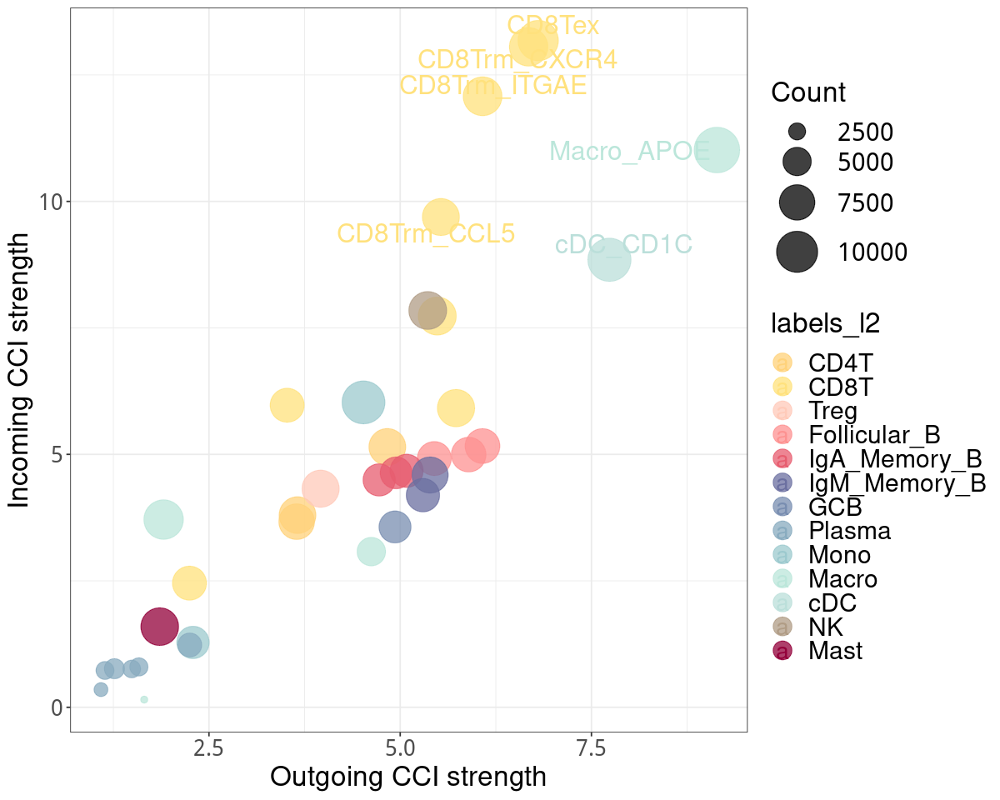

In [334]:
p = ggscatter(
  plot_df, x = "x", y = "y", 
    palette=c('#ffd27a', '#ffe17d', '#ffcab9', '#fd9291', '#e75d6f', '#6b6fa0', '#788db0', '#88abbf', '#9cc9ce', '#bbe6da', '#bbdfda', '#B09C85D8', '#93003a'),
  color = "labels_l2", size = "Count", 
    alpha=0.75,
    label='labels',
    label.select =c('Macro_APOE','CD8Tex','CD8Trm_CXCR4','CD8Trm_ITGAE','cDC_CD1C','CD8Trm_CCL5'),
    font.label = c(20, "plain"),
    font.family = "Arial",
    repel= T,
    xlab='Outgoing CCI strength',
    ylab='Incoming CCI strength'
) + 
scale_size_continuous(range = c(2, 15)) +
theme_bw() +
  theme(text=element_text(size=20),
        axis.text.x = element_text(size = 16),
        axis.text.y = element_text(size = 16),
        legend.title=element_text(size=20),
        legend.text=element_text(size=18)) +
guides(colour = guide_legend(override.aes = list(size=6)))
p


## Fig 4e

In [337]:
P7_obj <- readRDS('/fs/home/liuzhaoyang/project/TongjiHospital/add_new_new_samples/CellChat/Malignant_CCI/sample_level/P7_1/assign_level3_cellchat.rds')

# P7_obj = netAnalysis_computeCentrality(P7_obj)
# saveRDS(P7_obj, file='/fs/home/liuzhaoyang/project/TongjiHospital/add_new_new_samples/CellChat/Malignant_CCI/sample_level/P7_1/assign_level3_cellchat.rds')

In [464]:
p = netAnalysis_signalingRole_heatmap(P7_obj,pattern = "outgoing")
plot_df = p@matrix

plot_df = plot_df[,c('Macro_APOE','CD8Tex','CD8Trm_CXCR4','CD8Trm_ITGAE','cDC_CD1C','CD8Trm_CCL5')]
plot_df = plot_df[rowSums(is.na(plot_df)) != ncol(plot_df),]

n_top = 10
tmp_display  = c()
for (tmp_ct in colnames(plot_df)){
    tmp_display = c(tmp_display, rownames(plot_df[order(plot_df[,tmp_ct], decreasing = T),])[1:n_top])
}
tmp_display = unique(tmp_display)
plot_df = plot_df[tmp_display,]
plot_df[is.na(plot_df)] = 0
plot_df = plot_df[rowMax(plot_df) > 0.3, ]


title = NULL
width = 6
height = 15
font.size = 14
font.size.title = 16
cluster.rows = T
cluster.cols = T

color.use <- scPalette(length(colnames(plot_df)))
  
  # color.heatmap.use = colorRampPalette(rev(c('#6b6fa0', '#9cc9ce','#ffffff')))(200)
color.heatmap.use = colorRampPalette(rev(c('#3e68af', '#9ccfde','#ffffff')))(200)

  df<- data.frame(group = colnames(plot_df)); rownames(df) <- colnames(plot_df)
  names(color.use) <- colnames(plot_df)
  col_annotation <- HeatmapAnnotation(df = df, col = list(group = color.use),which = "column",
                                      show_legend = FALSE, show_annotation_name = FALSE,
                                      simple_anno_size = grid::unit(0.2, "cm"))
  ha2 = HeatmapAnnotation(Strength = anno_barplot(colSums(plot_df), border = F,gp = gpar(fill = color.use, col=color.use)), show_annotation_name = FALSE,height=unit(1.5,'cm'))

  pSum <- rowSums(plot_df)
  pSum.original <- pSum
  pSum <- -1/log(pSum)
  pSum[is.na(pSum)] <- 0
  idx1 <- which(is.infinite(pSum) | pSum < 0)
  if (length(idx1) > 0) {
    values.assign <- seq(max(pSum)*1.1, max(pSum)*1.5, length.out = length(idx1))
    position <- sort(pSum.original[idx1], index.return = TRUE)$ix
    pSum[idx1] <- values.assign[match(1:length(idx1), position)]
  }

  ha1 = rowAnnotation(Strength = anno_barplot(pSum, border = FALSE), show_annotation_name = FALSE,width=unit(2.5,'cm'))

  if (min(plot_df, na.rm = T) == max(plot_df, na.rm = T)) {
    legend.break <- max(plot_df, na.rm = T)
  } else {
    legend.break <- c(round(min(plot_df, na.rm = T), digits = 1), round(max(plot_df, na.rm = T), digits = 1))
  }

In [465]:
pdf(file = './Fig_pdf/Fig4e_outgoing.pdf', width=6, height=12)

options(repr.plot.width=6, repr.plot.height=12)
p = Heatmap(plot_df, col = color.heatmap.use, na_col = "white", name = "Relative strength",
                bottom_annotation = col_annotation, top_annotation = ha2, right_annotation = ha1,
                cluster_rows = cluster.rows,cluster_columns = cluster.rows,
        show_row_dend=F, show_column_dend=F,
            show_column_names=F, show_row_names=F,
                row_names_side = "left",row_names_rot = 0,row_names_gp = gpar(fontsize = font.size),column_names_gp = gpar(fontsize = font.size),
            column_title = title,column_title_gp = gpar(fontsize = font.size.title),column_names_rot = 90,
                heatmap_legend_param = list(title_gp = gpar(fontsize = 16, fontface = "plain"),title_position = "leftcenter-rot",
                                            border = NA, at = legend.break,
                                            legend_height = unit(30, "mm"),labels_gp = gpar(fontsize = 16),grid_width = unit(5, "mm")))
p
dev.off()

png 
  2

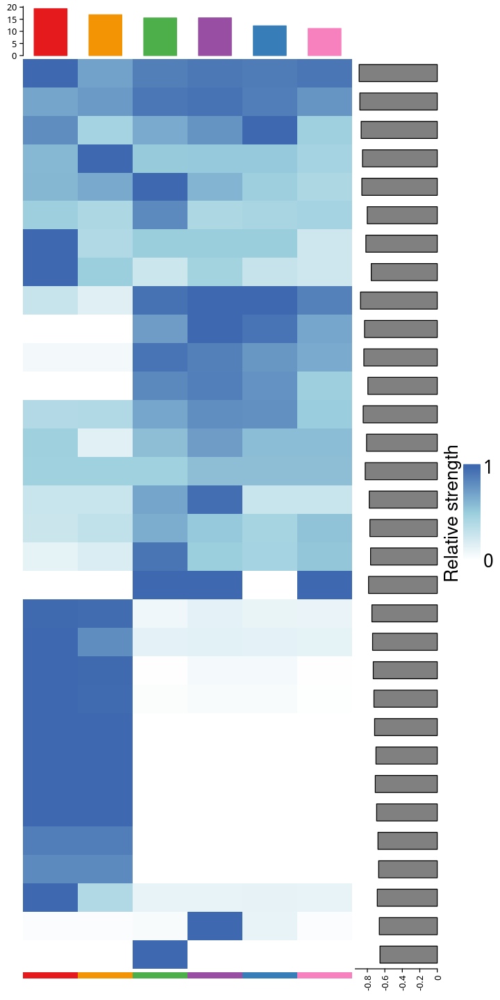

In [466]:
p

In [425]:
options(repr.plot.width=4, repr.plot.height=12)
p = Heatmap(plot_df, col = color.heatmap.use, na_col = "white", name = "Relative strength",
                bottom_annotation = col_annotation, top_annotation = ha2, right_annotation = ha1,
                cluster_rows = cluster.rows,cluster_columns = cluster.rows,
        show_row_dend=F, show_column_dend=F,
            show_column_names=T, show_row_names=T,
                row_names_side = "left",row_names_rot = 0,row_names_gp = gpar(fontsize = font.size),column_names_gp = gpar(fontsize = font.size),
            column_title = title,column_title_gp = gpar(fontsize = font.size.title),column_names_rot = 90,
                heatmap_legend_param = list(title_gp = gpar(fontsize = 16, fontface = "plain"),title_position = "leftcenter-rot",
                                            border = NA, at = legend.break,
                                            legend_height = unit(30, "mm"),labels_gp = gpar(fontsize = 16),grid_width = unit(5, "mm")))


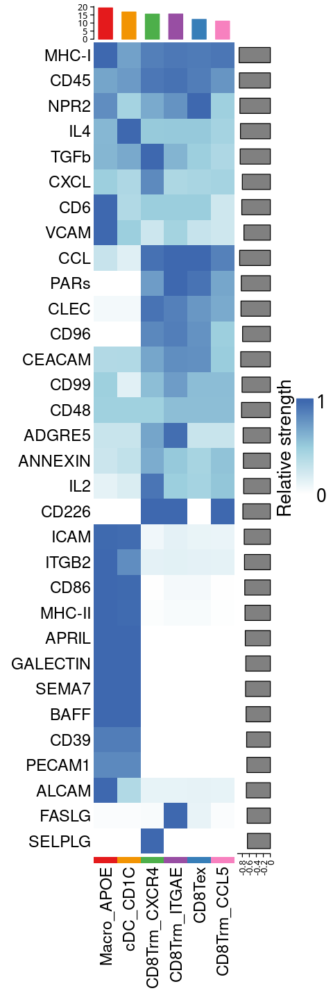

In [426]:
p

In [467]:
p = netAnalysis_signalingRole_heatmap(P7_obj,pattern = "incoming")
plot_df = p@matrix

plot_df = plot_df[,c('Macro_APOE','CD8Tex','CD8Trm_CXCR4','CD8Trm_ITGAE','cDC_CD1C','CD8Trm_CCL5')]
plot_df = plot_df[rowSums(is.na(plot_df)) != ncol(plot_df),]

n_top = 10
tmp_display  = c()
for (tmp_ct in colnames(plot_df)){
    tmp_display = c(tmp_display, rownames(plot_df[order(plot_df[,tmp_ct], decreasing = T),])[1:n_top])
}
tmp_display = unique(tmp_display)
plot_df = plot_df[tmp_display,]
plot_df[is.na(plot_df)] = 0
plot_df = plot_df[rowMax(plot_df) > 0.3, ]


title = NULL
width = 6
height = 15
font.size = 14
font.size.title = 16
cluster.rows = T
cluster.cols = T

color.use <- scPalette(length(colnames(plot_df)))
  
  # color.heatmap.use = colorRampPalette(rev(c('#6b6fa0', '#9cc9ce','#ffffff')))(200)
color.heatmap.use = colorRampPalette(rev(c('#3e68af', '#9ccfde','#ffffff')))(200)

  df<- data.frame(group = colnames(plot_df)); rownames(df) <- colnames(plot_df)
  names(color.use) <- colnames(plot_df)
  col_annotation <- HeatmapAnnotation(df = df, col = list(group = color.use),which = "column",
                                      show_legend = FALSE, show_annotation_name = FALSE,
                                      simple_anno_size = grid::unit(0.2, "cm"))
  ha2 = HeatmapAnnotation(Strength = anno_barplot(colSums(plot_df), border = F,gp = gpar(fill = color.use, col=color.use)), show_annotation_name = FALSE,height=unit(1.5,'cm'))

  pSum <- rowSums(plot_df)
  pSum.original <- pSum
  pSum <- -1/log(pSum)
  pSum[is.na(pSum)] <- 0
  idx1 <- which(is.infinite(pSum) | pSum < 0)
  if (length(idx1) > 0) {
    values.assign <- seq(max(pSum)*1.1, max(pSum)*1.5, length.out = length(idx1))
    position <- sort(pSum.original[idx1], index.return = TRUE)$ix
    pSum[idx1] <- values.assign[match(1:length(idx1), position)]
  }

  ha1 = rowAnnotation(Strength = anno_barplot(pSum, border = FALSE), show_annotation_name = FALSE, width=unit(2.5,'cm'))

  if (min(plot_df, na.rm = T) == max(plot_df, na.rm = T)) {
    legend.break <- max(plot_df, na.rm = T)
  } else {
    legend.break <- c(round(min(plot_df, na.rm = T), digits = 1), round(max(plot_df, na.rm = T), digits = 1))
  }

pdf(file = './Fig_pdf/Fig4e_incoming.pdf', width=6, height=12)

options(repr.plot.width=6, repr.plot.height=12)
p = Heatmap(plot_df, col = color.heatmap.use, na_col = "white", name = "Relative strength",
                bottom_annotation = col_annotation, top_annotation = ha2, right_annotation = ha1,
                cluster_rows = cluster.rows,cluster_columns = cluster.rows,
        show_row_dend=F, show_column_dend=F,
            show_column_names=F, show_row_names=F,
                row_names_side = "left",row_names_rot = 0,row_names_gp = gpar(fontsize = font.size),column_names_gp = gpar(fontsize = font.size),
            column_title = title,column_title_gp = gpar(fontsize = font.size.title),column_names_rot = 90,
                heatmap_legend_param = list(title_gp = gpar(fontsize = 16, fontface = "plain"),title_position = "leftcenter-rot",
                                            border = NA, at = legend.break,
                                            legend_height = unit(30, "mm"),labels_gp = gpar(fontsize = 16),grid_width = unit(5, "mm")))
p
dev.off()

png 
  2

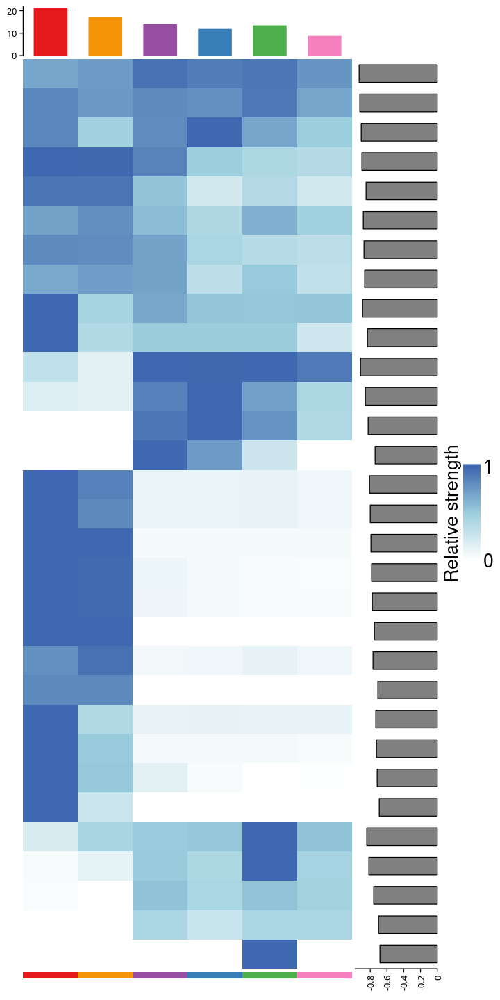

In [468]:
p

In [430]:
options(repr.plot.width=4, repr.plot.height=12)
p = Heatmap(plot_df, col = color.heatmap.use, na_col = "white", name = "Relative strength",
                bottom_annotation = col_annotation, top_annotation = ha2, right_annotation = ha1,
                cluster_rows = cluster.rows,cluster_columns = cluster.rows,
        show_row_dend=F, show_column_dend=F,
            show_column_names=T, show_row_names=T,
                row_names_side = "left",row_names_rot = 0,row_names_gp = gpar(fontsize = font.size),column_names_gp = gpar(fontsize = font.size),
            column_title = title,column_title_gp = gpar(fontsize = font.size.title),column_names_rot = 90,
                heatmap_legend_param = list(title_gp = gpar(fontsize = 16, fontface = "plain"),title_position = "leftcenter-rot",
                                            border = NA, at = legend.break,
                                            legend_height = unit(30, "mm"),labels_gp = gpar(fontsize = 16),grid_width = unit(5, "mm")))


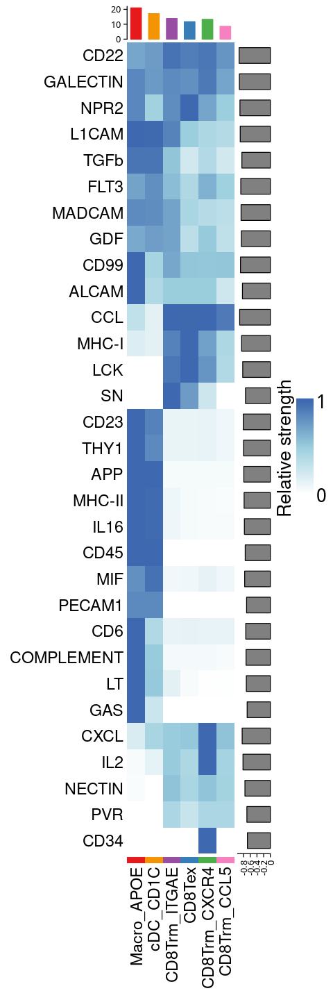

In [431]:
p

## Fig 4f

In [504]:
options(repr.plot.width=10, repr.plot.height=5)
signaling = c("MHC-I")
slot.name = "netP"
measure = c("outdeg","indeg","flowbet","info")
measure.name = c("Sender","Receiver","Mediator","Influencer")
color.use = NULL
color.heatmap = "BuGn"
width = 6.5
height = 1.4
font.size = 16
font.size.title = 18
cluster.rows = FALSE
cluster.cols = FALSE
# p = netAnalysis_signalingRole_network(P7_obj, signaling = 'MHC-I', width = 21, height = 5, font.size = 15,
#                                   # measure = c("outdeg", "indeg", "flowbet"),
#                                   # measure.name = c("Sender", "Receiver", "Mediator"),
#                                  cluster.rows = T, cluster.cols = T)

  centr <- slot(P7_obj, slot.name)$centr[signaling]
  for(i in 1:length(centr)) {
    centr0 <- centr[[i]]
    mat <- matrix(unlist(centr0), ncol = length(centr0), byrow = FALSE)
    mat <- t(mat)
    rownames(mat) <- names(centr0); colnames(mat) <- names(centr0$outdeg)
    if (!is.null(measure)) {
      mat <- mat[measure,]
      if (!is.null(measure.name)) {
        rownames(mat) <- measure.name
      }
    }
    mat <- sweep(mat, 1L, apply(mat, 1, max), '/', check.margin = FALSE)

    if (is.null(color.use)) {
      color.use <- scPalette(length(colnames(mat)))
    }
    color.heatmap.use = colorRampPalette(rev(c('#3e68af', '#9ccfde','#ffffff')))(500)


    df<- data.frame(group = colnames(mat)); rownames(df) <- colnames(mat)
    cell.cols.assigned <- setNames(color.use, unique(as.character(df$group)))
    col_annotation <- HeatmapAnnotation(df = df, col = list(group = cell.cols.assigned),which = "column",
                                        show_legend = FALSE, show_annotation_name = FALSE,
                                        simple_anno_size = grid::unit(0.2, "cm"))

    ht1 = Heatmap(mat, col = color.heatmap.use, na_col = "white", name = "Importance",
                  bottom_annotation = col_annotation,
                  cluster_rows = cluster.rows,cluster_columns = cluster.rows,
                  row_names_side = "left",row_names_rot = 0,row_names_gp = gpar(fontsize = font.size),column_names_gp = gpar(fontsize = font.size),
                  width = unit(width, "cm"), height = unit(height, "cm"),
                  column_title = paste0(names(centr[i]), " signaling pathway network"),column_title_gp = gpar(fontsize = font.size.title),column_names_rot = 45,
                  heatmap_legend_param = list(title = "Importance", title_gp = gpar(fontsize = 8, fontface = "plain"),title_position = "leftcenter-rot",
                                              border = NA, at = c(round(min(mat, na.rm = T), digits = 1), round(max(mat, na.rm = T), digits = 1)),
                                              legend_height = unit(20, "mm"),labels_gp = gpar(fontsize = 8),grid_width = unit(2, "mm")))
}

mat = mat[,c('Macro_APOE','CD8Tex','CD8Trm_CXCR4','CD8Trm_ITGAE','cDC_CD1C','CD8Trm_CCL5')]

pdf(file = './Fig_pdf/Fig4f.pdf', width=7, height=4)
options(repr.plot.width=7, repr.plot.height=4)
p = Heatmap(mat, col = color.heatmap.use, na_col = "white", name = "Importance",
                  # bottom_annotation = col_annotation,
                  cluster_rows = F, cluster_columns = T,
                  row_names_side = "left",row_names_rot = 0,row_names_gp = gpar(fontsize = font.size),column_names_gp = gpar(fontsize = font.size),
        show_column_dend=F,
                  # width = unit(width, "cm"), height = unit(height, "cm"),
                  column_title = paste0(names(centr[i]), " signaling pathway network"),column_title_gp = gpar(fontsize = font.size.title),column_names_rot = 45,
                  heatmap_legend_param = list(title = "Importance", title_gp = gpar(fontsize = 8, fontface = "plain"),title_position = "leftcenter-rot",
                                              border = NA, at = c(round(min(mat, na.rm = T), digits = 1), round(max(mat, na.rm = T), digits = 1)),
                                              legend_height = unit(20, "mm"),labels_gp = gpar(fontsize = 8),grid_width = unit(2, "mm")))
p
dev.off()

png 
  2

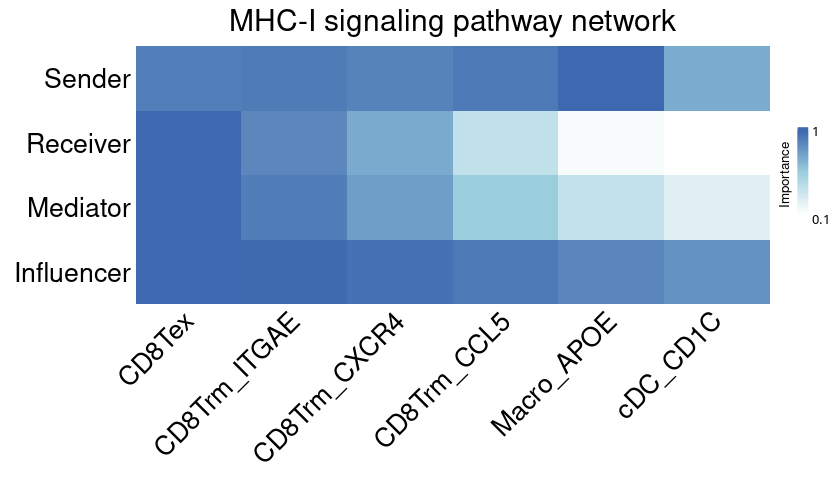

In [505]:
p

## Fig 4g

Comparing communications on a single object 




png 
  2

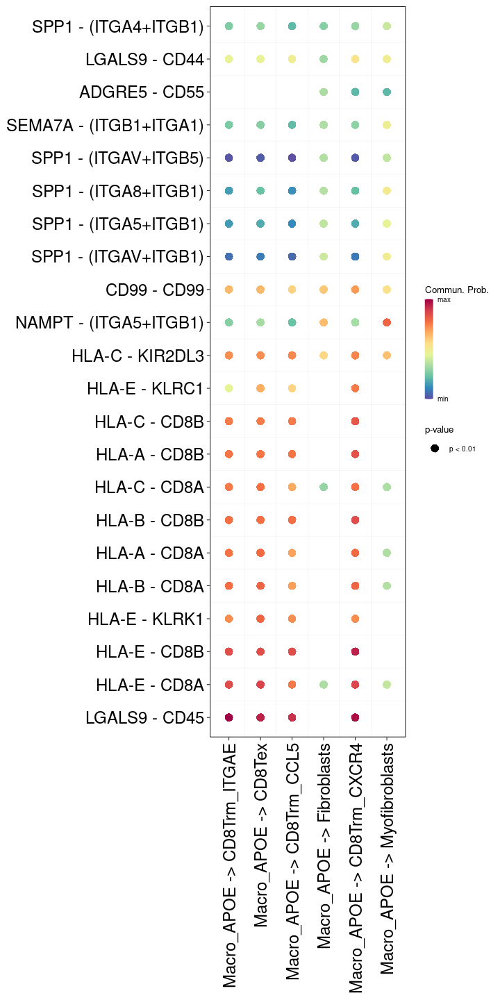

In [519]:
# manually filter sig top n LRs 
n_top=10

cc_pval = all_sample_obj@net$pval
cc_prob = all_sample_obj@net$prob

sources.use = c('Macro_APOE')
targets.use = c('CD8Tex','CD8Trm_CXCR4','CD8Trm_ITGAE','CD8Trm_CCL5','Fibroblasts','Myofibroblasts')

select_lrs = c()
tmp_cci_df = data.frame()
for (tmp_t in targets.use){
    tmp_pval = cc_pval[sources.use,tmp_t,]
    tmp_prob = cc_prob[sources.use,tmp_t,]
    tmp_prob = tmp_prob[which(tmp_pval < 0.01)]
    tmp_prob = sort(tmp_prob, decreasing = T)
    select_lrs = c(select_lrs, names(tmp_prob[1:n_top]))
    
}

select_lrs = data.frame(unique(select_lrs))
colnames(select_lrs) = c('interaction_name')

pdf(file = './Fig_pdf/Fig4g.pdf', width=6, height=12)
options(repr.plot.width=6,repr.plot.height=12)
tmp_cci_df = netVisual_bubble(all_sample_obj, sources.use = sources.use,
                 targets.use = targets.use,
                pairLR.use = select_lrs,
                              color.heatmap=c('Spectral'),
                 remove.isolate = T,
                 n.colors=10,
                 thresh=0.01,
                min.dataset = 0.05,
                font.size=18,
                 angle.x=90,
                 sort.by.source.priority=T,
                            return.data=T,
                             )

tmp_cci_df$gg.ob
dev.off()
tmp_cci_df$gg.ob

In [675]:
# manually filter sig top n LRs 
n_top=10

cc_pval = all_sample_obj@net$pval
cc_prob = all_sample_obj@net$prob

sources.use = c('Macro_APOE')
targets.use = c('CD8Tex','CD8Trm_CXCR4','CD8Trm_ITGAE','CD8Trm_CCL5','Fibroblasts','Myofibroblasts')

select_lrs = c()
tmp_cci_df = data.frame()
for (tmp_t in targets.use){
    tmp_pval = cc_pval[sources.use,tmp_t,]
    tmp_prob = cc_prob[sources.use,tmp_t,]
    tmp_prob = tmp_prob[which(tmp_pval < 0.01)]
    tmp_prob = sort(tmp_prob, decreasing = T)
    select_lrs = c(select_lrs, names(tmp_prob[1:n_top]))
    
}

select_lrs = data.frame(unique(select_lrs))
colnames(select_lrs) = c('interaction_name')

tmp_cci_df = netVisual_bubble(all_sample_obj, sources.use = sources.use,
                 targets.use = targets.use,
                pairLR.use = select_lrs,
                              color.heatmap=c('Spectral'),
                 remove.isolate = T,
                 n.colors=10,
                 thresh=0.01,
                min.dataset = 0.05,
                font.size=18,
                 angle.x=90,
                 sort.by.source.priority=T,
                            return.data=T,
                             )



Comparing communications on a single object 




In [676]:
max(tmp_cci_df$communication$prob)

[1] 0.3062243

In [677]:
min(tmp_cci_df$communication$prob)

[1] 0.09195846

## Fig 4i

png 
  2

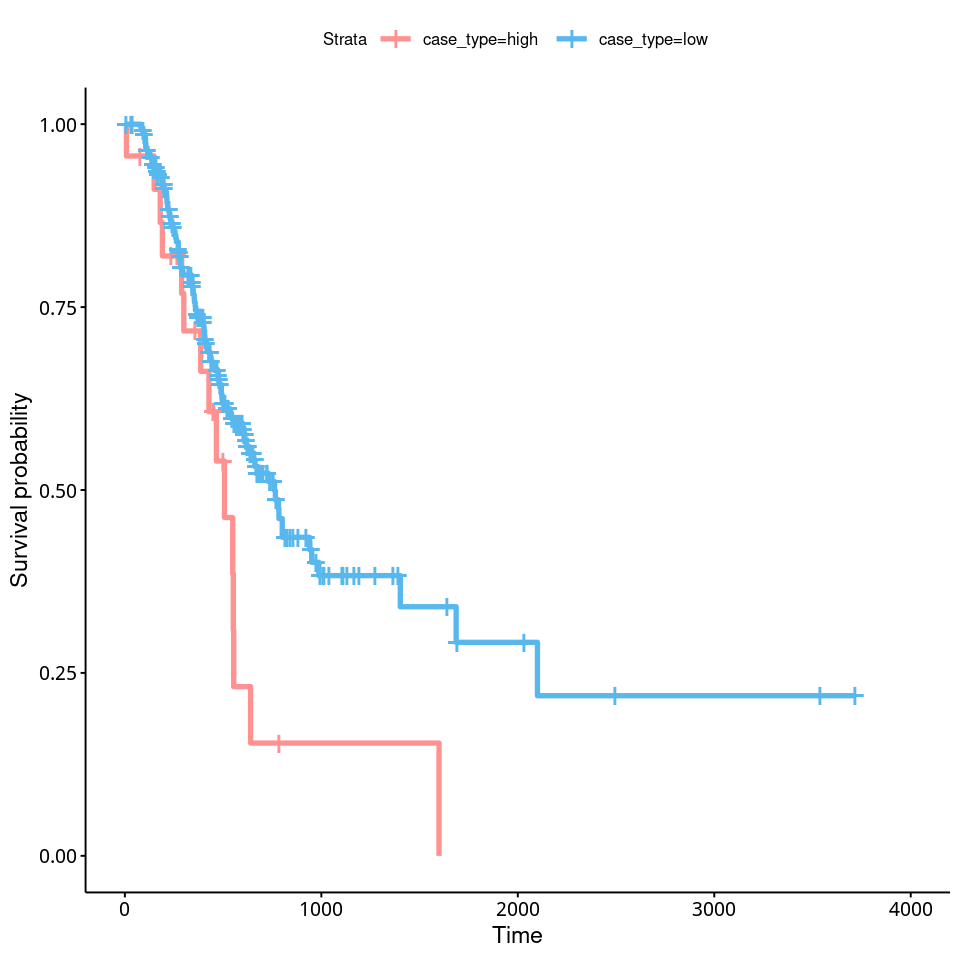

In [23]:
tmp_survival = read.delim('~/project//TongjiHospital//public_datasets//TCGA_STAD_ESCA/survival_Macro_APOE.tsv',
                            sep='\t',
                           check.names=F)

pdf(file = './Fig_pdf/Fig4i.pdf', width=8, height=8)
options(repr.plot.width=8, repr.plot.height=8)

tmp_surv <- Surv(tmp_survival$OS_MONTHS,tmp_survival$OS_STATUS)
tmp_kmfit1 <- survfit(tmp_surv~case_type, data = tmp_survival) 

p = ggsurvplot(tmp_kmfit1,
               palette = c("#fd9291", "#58b8ee"),
                          censor.size=8, size = 1.5,
               conf.int =F, pval = F, risk.table=F)
p
dev.off()
p

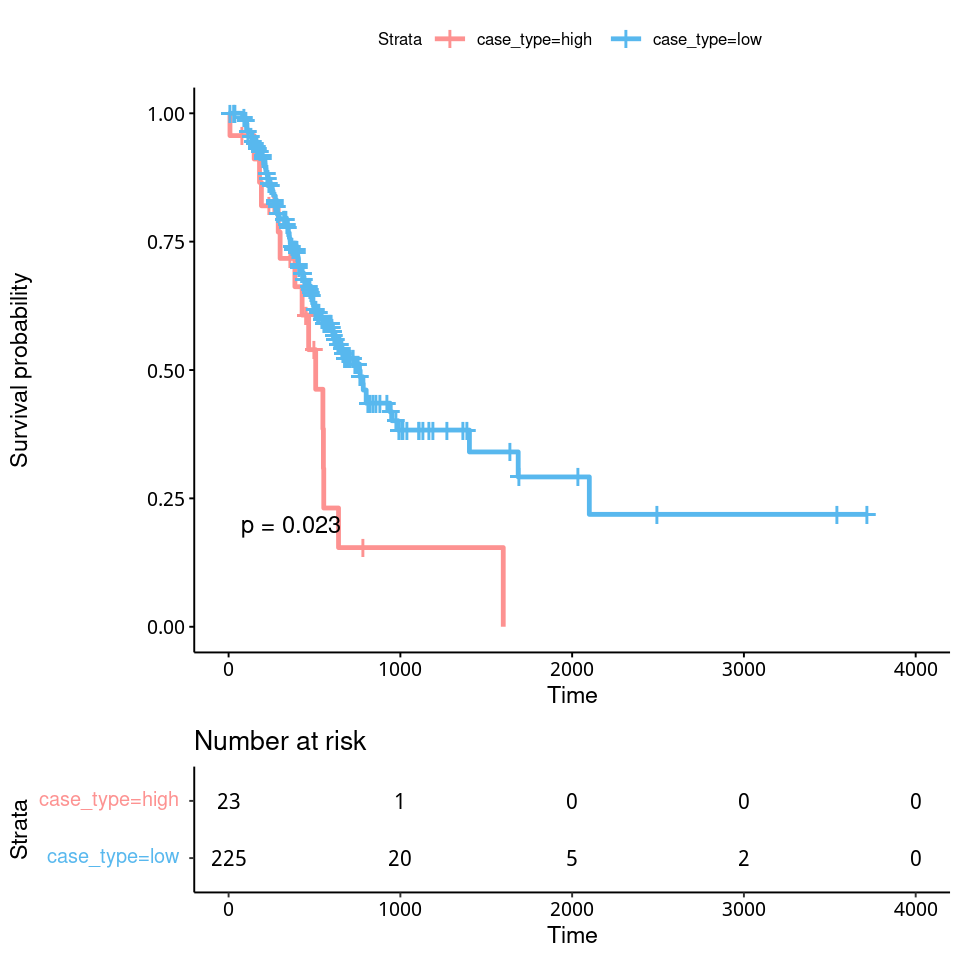

In [20]:
ggsurvplot(tmp_kmfit1,
               palette = c("#fd9291", "#58b8ee"),
           censor.size=8, size = 1.35,
               conf.int =F, pval = T, risk.table=T)

# Fig 5

## Fig 5a

In [521]:
all_sample_obj = readRDS('./CellChat/Malignant_CCI/full_set/assign_level3_cellchat.rds')
mat <- all_sample_obj@net$weight

In [558]:
non_malignant = rownames(mat)[!rownames(mat) %in% c('Mal_EAC_like','Mal_AGEJ_like','Mal_GC_like')]
non_malignant = non_malignant[!grepl('Plasma',non_malignant)]

pdf(file = './Fig_pdf/Fig5a.pdf', width=7, height=14)
options(repr.plot.width=7, repr.plot.height=14)
p = pheatmap(t(mat[c('Mal_EAC_like','Mal_AGEJ_like','Mal_GC_like'),non_malignant]), 
             color=colorRampPalette(rev(c('#cf3759', '#ffffe0','#4771b2')))(200),
         border_color='white',
         treeheight_row=25,
             treeheight_col=25,
         cluster_rows=T, show_rownames=T, scale='column',
        cellwidth=25, cellheight=25, fontsize=20)
p
dev.off()

png 
  2

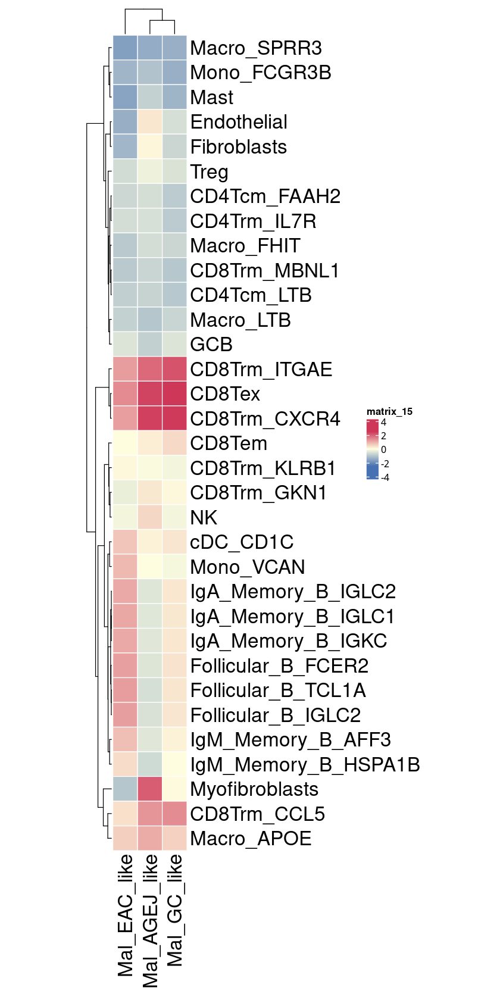

In [560]:
p

## Fig 5b

In [568]:
mat2 = cellchat@net$weight
from_cts = c('Mal_GC_like','Mal_AGEJ_like','Mal_EAC_like')
to_cts = c('Macro_APOE','CD8Trm_ITGAE', 'CD8Tex', 'CD8Trm_CXCR4', 'Fibroblasts','Myofibroblasts')

mat2 = mat2[c(from_cts,to_cts), c(from_cts,to_cts)]
mat2[!(rownames(mat2) %in% from_cts),] = 0
mat2[,!(colnames(mat2) %in% to_cts)] = 0

pdf(file = './Fig_pdf/Fig5b.pdf', width=8, height=8)
options(repr.plot.width=8,repr.plot.height=8)
circos.par(canvas.xlim=c(-1.5,1.5))
chordDiagram(mat2, directional = TRUE, transparency = 0.5,
                 annotationTrack = c('grid'), 
                 annotationTrackHeight = mm_h(c(7, 3)),
             grid.col=c("#9cc9ce", "#fd9291", "#ffd27a", '#ffe57c','#9cc9ce','#e75d6f','#788db0','#B09C85D8', '#7b6953'),
                 diffHeight=mm_h(7),
                 target.prop.height = mm_h(5),
                 direction.type = c("diffHeight", "arrows"),
                 link.arr.type = "big.arrow",
                 # scale = TRUE
    )

circos.track(track.index = 1, panel.fun = function(x, y) {
    circos.text(CELL_META$xcenter, CELL_META$ylim[1], CELL_META$sector.index, 
        facing = "clockwise", niceFacing = TRUE, adj = c(-0.25, 0.5), cex=2)
}, bg.border = NA)
dev.off()
circos.clear()

png 
  2

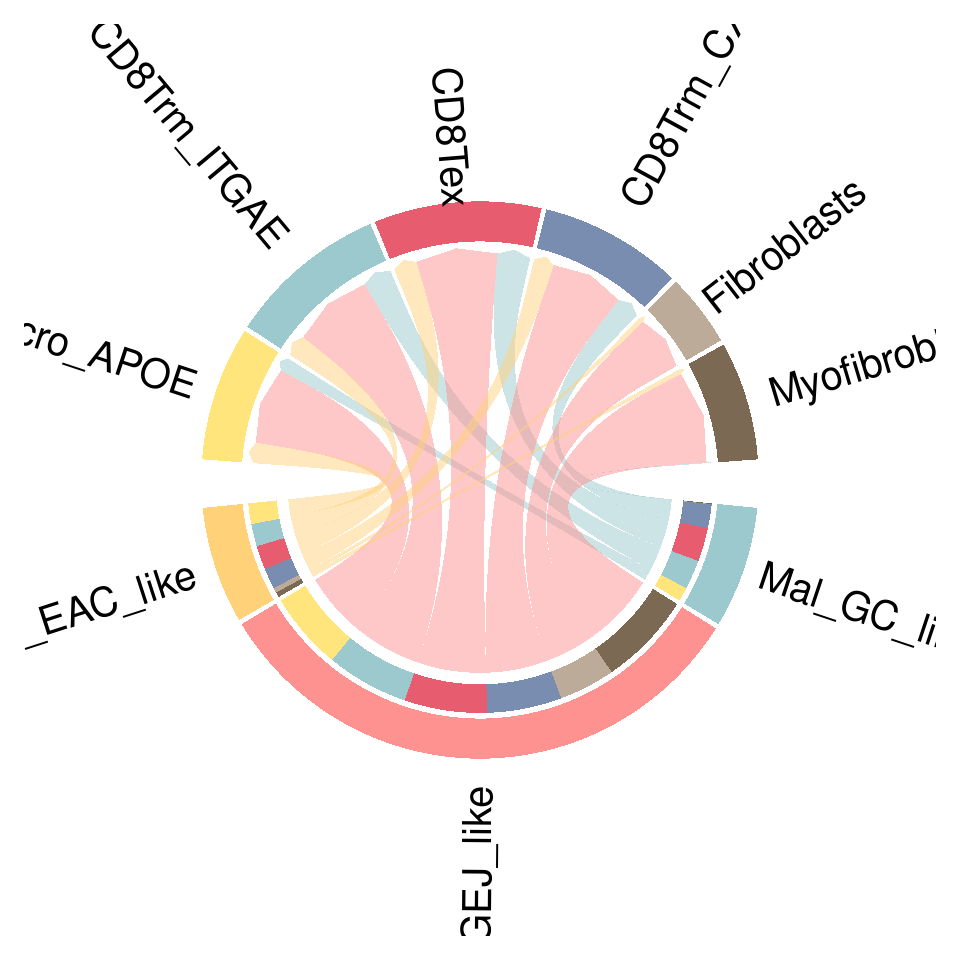

In [570]:
options(repr.plot.width=8,repr.plot.height=8)
circos.par(canvas.xlim=c(-1.5,1.5))
chordDiagram(mat2, directional = TRUE, transparency = 0.5,
                 annotationTrack = c('grid'), ## annotationTrack = c('grid','name') 会在每个环外面加上label
                 annotationTrackHeight = mm_h(c(7, 3)),
             grid.col=c("#9cc9ce", "#fd9291", "#ffd27a", '#ffe57c','#9cc9ce','#e75d6f','#788db0','#B09C85D8', '#7b6953'),
                 diffHeight=mm_h(7),
                 target.prop.height = mm_h(5),
                 direction.type = c("diffHeight", "arrows"),
                 link.arr.type = "big.arrow",
                 # scale = TRUE
    )

circos.track(track.index = 1, panel.fun = function(x, y) {
    circos.text(CELL_META$xcenter, CELL_META$ylim[1], CELL_META$sector.index, 
        facing = "clockwise", niceFacing = TRUE, adj = c(-0.25, 0.5), cex=2)
}, bg.border = NA)
circos.clear()

## Fig 5c

In [571]:
P7_obj <- readRDS('/fs/home/liuzhaoyang/project/TongjiHospital/add_new_new_samples/CellChat/Malignant_CCI/sample_level/P7_1/assign_level3_cellchat.rds')

In [593]:
# manually filter sig top n LRs 
n_top=15

cc_pval = P7_obj@net$pval
cc_prob = P7_obj@net$prob

sources.use = c('Mal_AGEJ_like')
targets.use = c('Macro_APOE','Endothelial','Fibroblasts','Myofibroblasts','CD8Tex','CD8Trm_CXCR4','CD8Trm_ITGAE')

select_lrs = c()
tmp_cci_df = data.frame()
for (tmp_t in targets.use){
    tmp_pval = cc_pval[sources.use,tmp_t,]
    tmp_prob = cc_prob[sources.use,tmp_t,]
    tmp_prob = tmp_prob[which(tmp_pval < 0.01)]
    tmp_prob = sort(tmp_prob, decreasing = T)
    select_lrs = c(select_lrs, names(tmp_prob[1:n_top]))
    
}

select_lrs = data.frame(unique(select_lrs))
colnames(select_lrs) = c('interaction_name')
# select_lrs

pdf(file = './Fig_pdf/Fig5c.pdf', width=7, height=12)
options(repr.plot.width=7,repr.plot.height=12)
tmp_cci_df = netVisual_bubble(P7_obj, sources.use = sources.use,
                 targets.use = targets.use,
                pairLR.use = select_lrs,
                 remove.isolate = T,
                 n.colors=10,
                 thresh=0.005,
                min.dataset = 0.05,
                font.size=20,
                 angle.x=90,
                 sort.by.source.priority=T,
                            return.data=T,
                             )

tmp_cci_df$gg.obj
dev.off()


Comparing communications on a single object 




png 
  2

In [601]:
tmp_lrs = c('HLA-E_CD8B', 'HLA-E_CD8B', 'HLA-C_CD8B', 'HLA-E_KLRK1', 'HLA-E_CD8A',
            'PRSS3_F2R', 'ADGRE5_CD55', 'PDGFA_PDGFRA', 'SEMA3C_PLXND1', 'MDK_SDC2',
            'NAMPT_ITGA5_ITGB1', 'LAMB3_ITGA6_ITGB1', 'PRSS3_PARD3' ,'SEMA3C_NRP1_NRP2',
            'LAMB3_ITGA9_ITGB1', 'LAMB3_ITGA2_ITGB1', 'LAMB3_ITGA1_ITGB1',
            'MIF_CD74_CXCR4', 'LGALS9_CD45', 'MDK_ITGA6_ITGB1', 'MDK_NCL', 'MIF_CD74_CD44',
            'MDK_LRP1', 'GDF15_TGFBR2', 'MDK_ITGA4_ITGB1', 'HLA-C_KIR2DL3', 'APP_CD74'
           )

select_lrs = data.frame(tmp_lrs)
colnames(select_lrs) = c('interaction_name')
# select_lrs = select_lrs[select_lrs$interaction_name %in% tmp_lrs,]

pdf(file = './Fig_pdf/Fig5c.pdf', width=7, height=12)
options(repr.plot.width=7,repr.plot.height=12)
tmp_cci_df = netVisual_bubble(P7_obj, sources.use = sources.use,
                 targets.use = targets.use,
                pairLR.use = select_lrs,
                 remove.isolate = T,
                 n.colors=10,
                 thresh=0.05,
                min.dataset = 0.05,
                font.size=20,
                 angle.x=90,
                 sort.by.source.priority=T,
                            return.data=T,
                             )

tmp_cci_df$gg.obj
dev.off()


Comparing communications on a single object 




png 
  2

In [594]:
select_lrs

interaction_name
<chr>
APP_CD74
HLA-C_KIR2DL3
MDK_ITGA4_ITGB1
GDF15_TGFBR2
MDK_LRP1
MIF_CD74_CD44
MDK_NCL
MDK_ITGA6_ITGB1
LGALS9_CD45


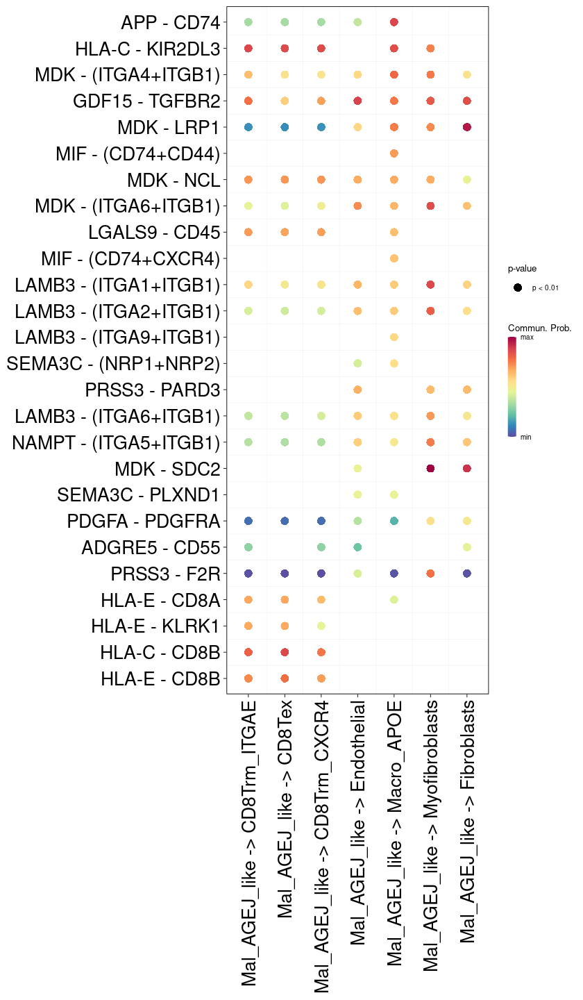

In [602]:
tmp_cci_df$gg.obj

In [673]:
max(tmp_cci_df$communication$prob)

[1] 0.3213728

In [674]:
min(tmp_cci_df$communication$prob)

[1] 0.07541752

## Fig 5d

png 
  2

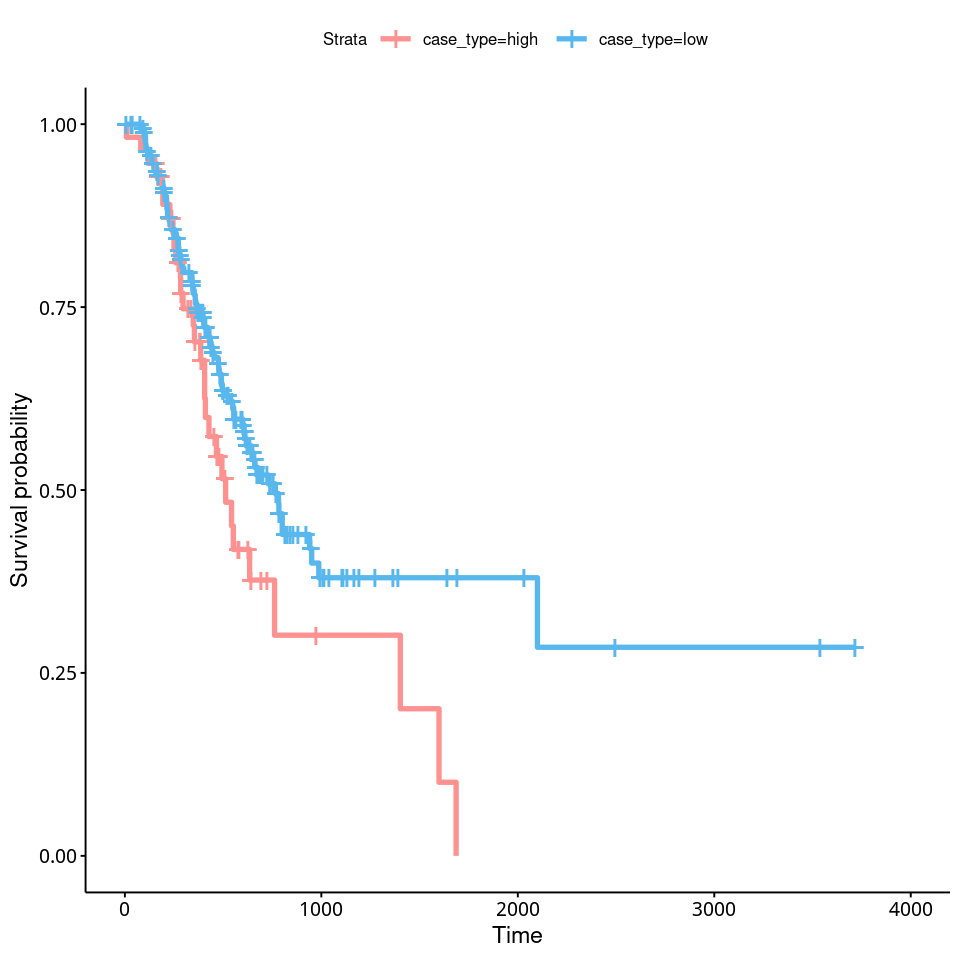

In [24]:
tmp_survival = read.delim('~/project//TongjiHospital//public_datasets//TCGA_STAD_ESCA/survival_Mal_CCI.tsv',
                            sep='\t',
                           check.names=F)

pdf(file = './Fig_pdf/Fig5d.pdf', width=8, height=8)
options(repr.plot.width=8, repr.plot.height=8)

tmp_surv <- Surv(tmp_survival$OS_MONTHS,tmp_survival$OS_STATUS)
tmp_kmfit1 <- survfit(tmp_surv~case_type, data = tmp_survival) 

p = ggsurvplot(tmp_kmfit1,
               palette = c("#fd9291", "#58b8ee"),
                          censor.size=8, size = 1.5,
               conf.int =F, pval = F, risk.table=F)
p
dev.off()
p

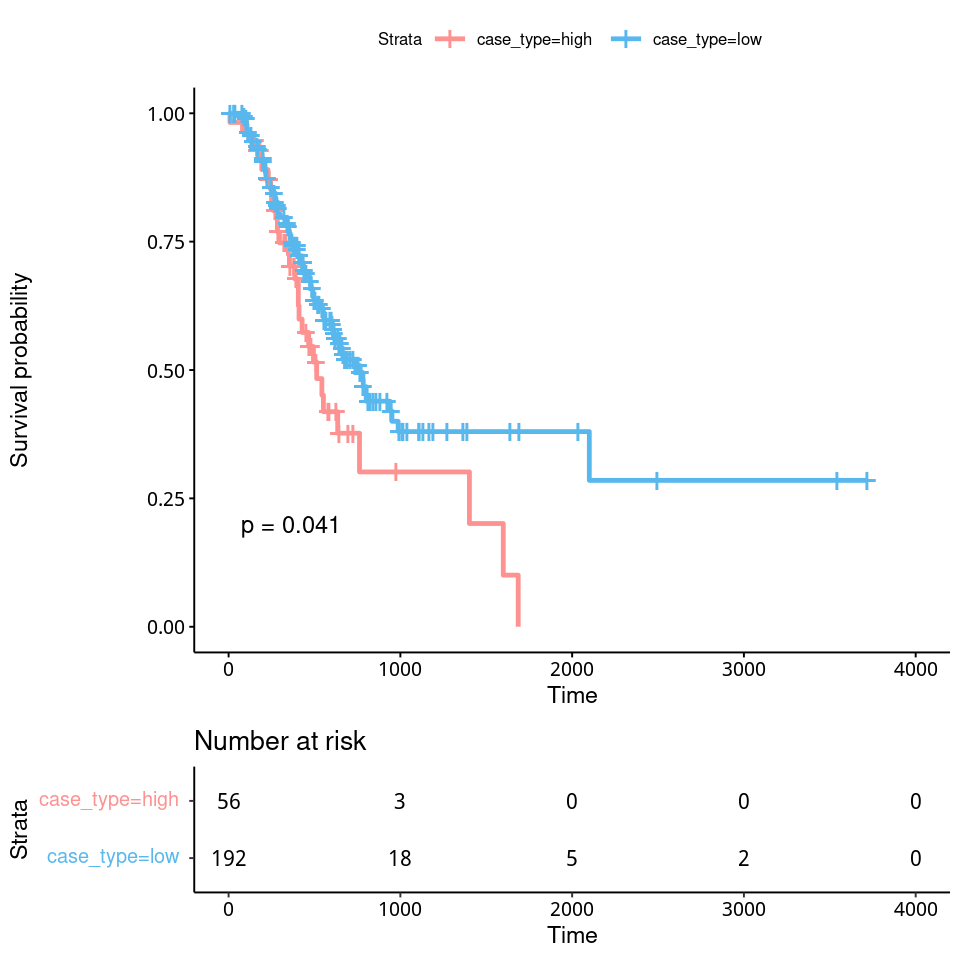

In [25]:
ggsurvplot(tmp_kmfit1,
               palette = c("#fd9291", "#58b8ee"),
           censor.size=8, size = 1.35,
               conf.int =F, pval = T, risk.table=T)

## Fig 5e

In [ ]:
celltype_frac_df = read.table(file.path('./ST/735350_3/STRIDE//assign_level3/STRIDE_spot_celltype_frac.txt'), sep='\t', check.names = F, row.names = 1, header = T)

# annotation by max cell type proportion
celltype_frac_df = celltype_frac_df[rownames(st1_obj@meta.data),]
st1_obj@meta.data$assign.max = colnames(celltype_frac_df)[apply(celltype_frac_df, FUN=which.max, 1)]
st1_obj@meta.data$assign.max[!(st1_obj@meta.data$assign.max %in% c('Mal_GC_like','Mal_AGEJ_like'))] = 'Normal'

In [639]:
pdf(file = './Fig_pdf/Fig5e.pdf', width=4, height=4)
options(repr.plot.width=4, repr.plot.height=4)
p = SpatialDimPlot(st1_obj,group.by = 'assign.max', ncol = 1, alpha = c(0.9, 1),
                   label = F,
                    pt.size.factor=2.2,
                            stroke=NA,
                 image.alpha = 0.2, combine=T) + 
scale_fill_manual(name='assign.max', values = c('Mal_AGEJ_like' = '#fd9291', 'Mal_GC_like'='#9cc9ce', 'Normal'='#58b8ee'),labels=c("AEG-like", "GAC-like", "Normal")) +
theme(legend.position = "none")
p
dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


png 
  2

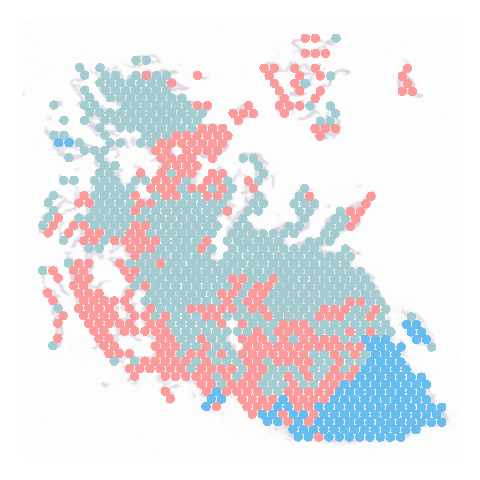

In [640]:
p

In [656]:
all_sample_meta = read.delim('./all_sample_meta.tsv', sep='\t', row.names=1, check.names=F)
# all_sample_meta = read.delim('/fs/home/liuzhaoyang/project/TongjiHospital/add_new_new_samples/assign_levels_mapping.tsv')
tmp_all_sample_meta = all_sample_meta
tmp_all_sample_meta$assign.level1[tmp_all_sample_meta$assign.level3 %in% c('Mal_AGEJ_like','Mal_EAC_like','Mal_GC_like')] = 'Malignant'
tmp_all_sample_meta$assign.level1[tmp_all_sample_meta$assign.level1 == 'Epithelial'] = 'Normal Epithelial'

for (tmp_ct in levels(as.factor(tmp_all_sample_meta$assign.level1))) {
        tmp_merge_cts = unique(tmp_all_sample_meta$assign.level3[tmp_all_sample_meta$assign.level1 == tmp_ct])
        if (length(tmp_merge_cts) == 1) {
            st1_obj@meta.data[,tmp_ct] = st1_obj@meta.data[,tmp_merge_cts]
        } else {
            st1_obj@meta.data[,tmp_ct] = apply(st1_obj@meta.data[,tmp_merge_cts], MARGIN=1, FUN=sum)
        }
    }

tmp_l = c()
tmp_source = c()
tmp_cell_type = c()
tmp_barcodes = rownames(st1_obj@meta.data[st1_obj@meta.data$assign.max %in% c('Mal_AGEJ_like','Mal_GC_like'),])
for (tmp_c in c('B','T','Mono/Macro','Fibroblasts')){
    
    tmp_l = c(tmp_l,st1_obj@meta.data[tmp_barcodes,tmp_c])
    tmp_source = c(tmp_source, as.vector(st1_obj@meta.data[tmp_barcodes, 'assign.max']))
    tmp_cell_type = c(tmp_cell_type, rep(tmp_c, length(tmp_barcodes)))
}


plot_df = data.frame(celltype_percent = tmp_l,
                     Malignant_region=factor(tmp_source, levels=c('Mal_AGEJ_like','Mal_GC_like')),
                     celltype = factor(tmp_cell_type, levels=c('B','T','Mono/Macro','Fibroblasts')))

Warning message in (function (mapping = NULL, data = NULL, geom = "boxplot", position = "dodge2", :
“Ignoring unknown aesthetics: fill”


png 
  2

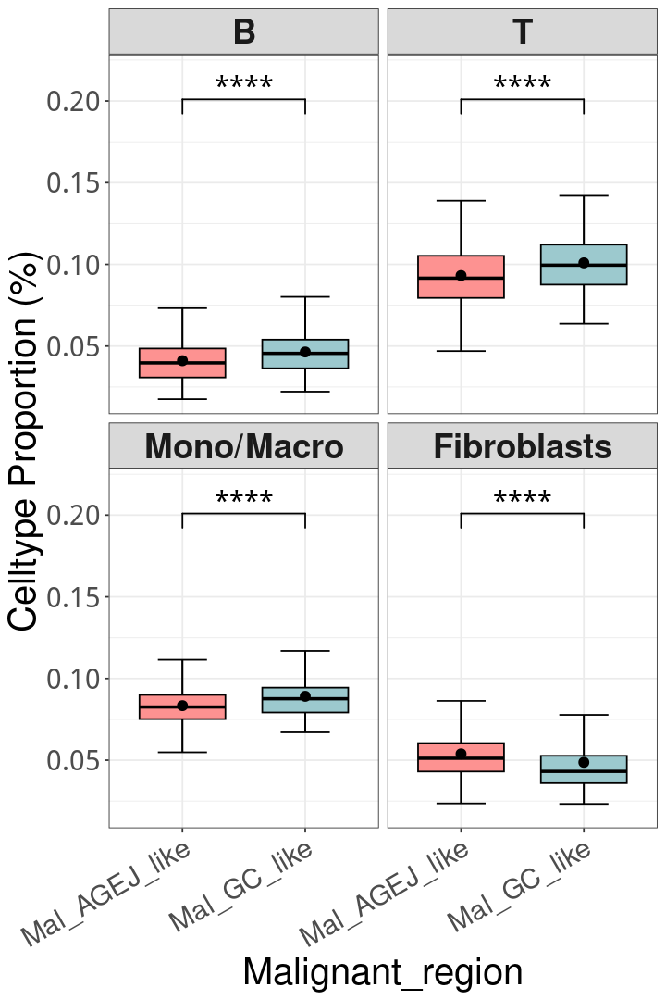

In [670]:
pdf(file = './Fig_pdf/Fig5e_boxplot.pdf', width=6, height=9)

options(repr.plot.width=6, repr.plot.height=9)
p = ggboxplot(plot_df, x = "Malignant_region", y = "celltype_percent",
          palette=c('#fd9291',  '#9cc9ce'),
          fill='Malignant_region', bxp.errorbar=T, outlier.shape=NA,
          add=c('mean_se')) +
  theme_bw() + 
  theme(legend.text = element_text(size = 20), 
       legend.title = element_text(size = 24), 
       axis.text.x=element_text(size=18,angle=30,hjust=1),
       axis.text.y=element_text(size=18),
       axis.title=element_text(size=24)) +
  facet_wrap(~celltype,  ncol=2)  + 
  theme(strip.text.x = element_text(size = 22,face="bold"),
       legend.position='none') +
  ylab('Celltype Proportion (%)') +
  # scale_x_discrete(limits=c("chemo", "no_treatment")) +
  stat_compare_means(comparisons = list(c('Mal_AGEJ_like','Mal_GC_like')),
                   label = 'p.signif',
                   # label.x=1.5,
                   step.increase=0.1, bracket.size=0.5,
                     size=6, tip.length=0.05,hide.ns = F) + 
scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))
p
dev.off()
p

# Fig 6

## Fig 6a

In [678]:
st4_obj = readRDS('./ST/736083_4/736083_4_res.rds')

png 
  2

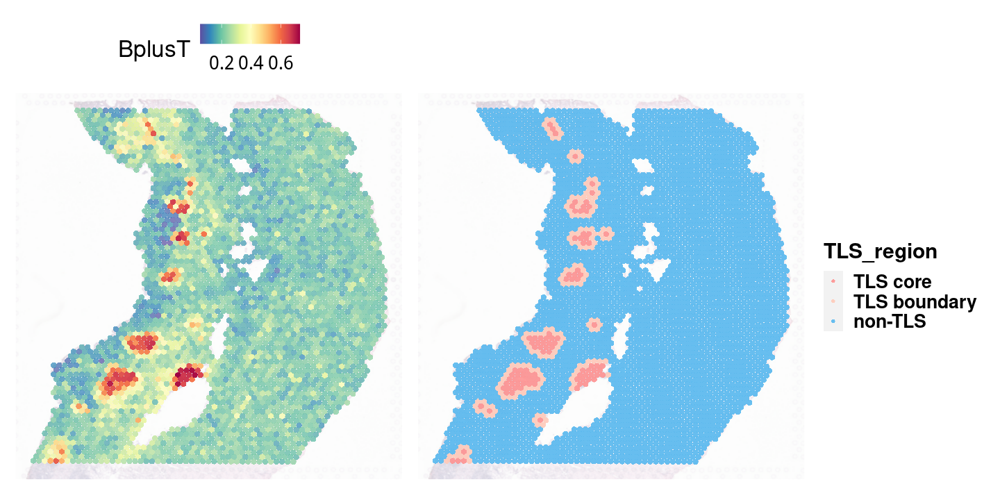

In [699]:
tmp_cols = c('#fd9291','#ffcab9','#58b8ee')
names(tmp_cols) = c('TLS core','TLS boundary','non-TLS')

pdf(file = './Fig_pdf/Fig6a_st3.pdf', width=12, height=6)
options(repr.plot.width=12, repr.plot.height=6)
p1 = SpatialFeaturePlot(st3_obj, features = c('BplusT'),alpha=c(0.7,1),stroke=NA,
                 image.alpha = 0.2) +
theme(legend.position='none',
    legend.title=element_text(size=20),
      legend.text=element_text(size=16))

p2 = SpatialPlot(st3_obj,group.by = c('TLS_region'), ncol = 1, alpha = c(0.9, 1),
                 cols=tmp_cols,
                 stroke=NA, image.alpha = 0.2) +
theme(legend.position='none',
    legend.title = element_text(size = 18, face = 'bold'),
      legend.text = element_text(size = 16, face = 'bold'))
p1+p2
dev.off()

options(repr.plot.width=12, repr.plot.height=6)
p1 = SpatialFeaturePlot(st3_obj, features = c('BplusT'),alpha=c(0.7,1),stroke=NA,
                 image.alpha = 0.2) +
theme(
    legend.title=element_text(size=20),
      legend.text=element_text(size=16))

p2 = SpatialPlot(st3_obj,group.by = c('TLS_region'), ncol = 1, alpha = c(0.9, 1),
                 cols=tmp_cols,
                 stroke=NA, image.alpha = 0.2) +
theme(
    legend.title = element_text(size = 18, face = 'bold'),
      legend.text = element_text(size = 16, face = 'bold'))
p1+p2


png 
  2

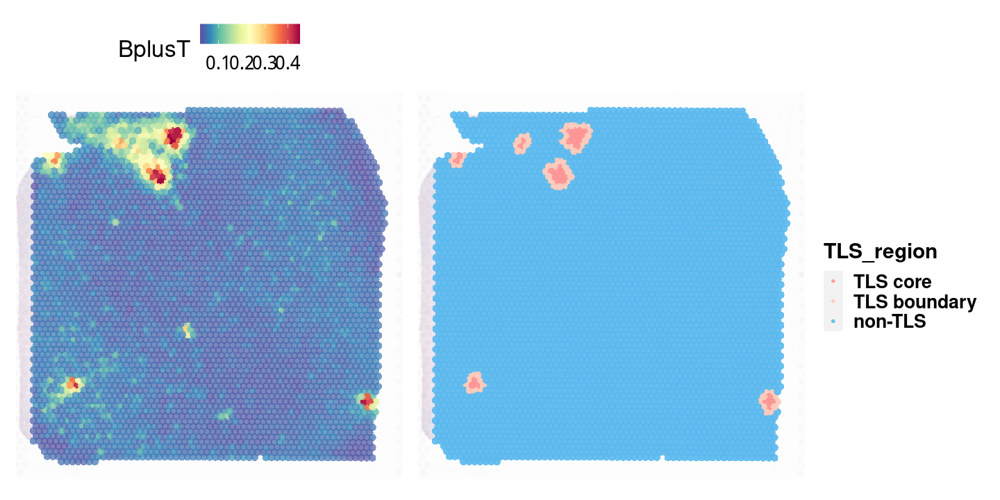

In [698]:
tmp_cols = c('#fd9291','#ffcab9','#58b8ee')
names(tmp_cols) = c('TLS core','TLS boundary','non-TLS')

pdf(file = './Fig_pdf/Fig6a_st4.pdf', width=12, height=6)
options(repr.plot.width=12, repr.plot.height=6)
p1 = SpatialFeaturePlot(st4_obj, features = c('BplusT'),alpha=c(0.7,1),stroke=NA,
                 image.alpha = 0.2, pt.size.factor=2) +
theme(legend.position='none',
    legend.title=element_text(size=20),
      legend.text=element_text(size=16))

p2 = SpatialPlot(st4_obj,group.by = c('TLS_region'), ncol = 1, alpha = c(0.9, 1),
                 cols=tmp_cols,
                 stroke=NA, image.alpha = 0.2, pt.size.factor=2) +
theme(legend.position='none',
    legend.title = element_text(size = 18, face = 'bold'),
      legend.text = element_text(size = 16, face = 'bold'))
p1+p2
dev.off()


options(repr.plot.width=12, repr.plot.height=6)
p1 = SpatialFeaturePlot(st4_obj, features = c('BplusT'),alpha=c(0.7,1),stroke=NA,
                 image.alpha = 0.2, pt.size.factor=2) +
theme(
    legend.title=element_text(size=20),
      legend.text=element_text(size=16))

p2 = SpatialPlot(st4_obj,group.by = c('TLS_region'), ncol = 1, alpha = c(0.9, 1),
                 cols=tmp_cols,
                 stroke=NA, image.alpha = 0.2, pt.size.factor=2) +
theme(
    legend.title = element_text(size = 18, face = 'bold'),
      legend.text = element_text(size = 16, face = 'bold'))
p1+p2


## Fig 6b

Warning message in (function (mapping = NULL, data = NULL, geom = "boxplot", position = "dodge2", :
“Ignoring unknown aesthetics: fill”


png 
  2

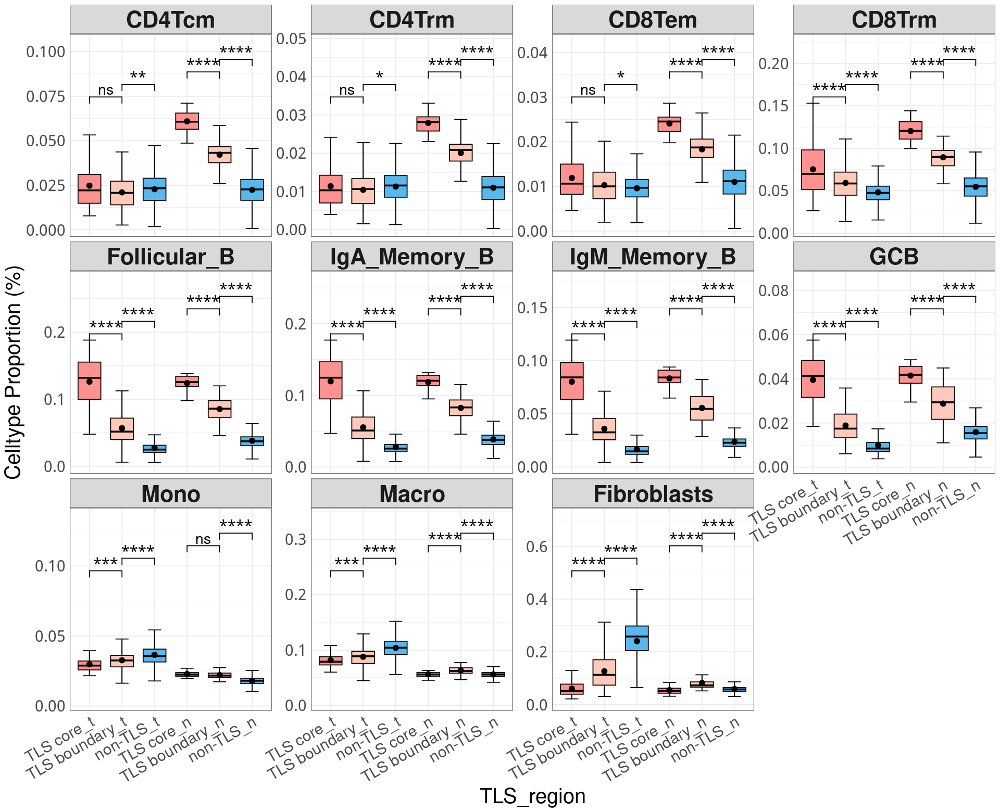

In [790]:
tmp_l = c()
tmp_source = c()
tmp_region = c()
tmp_cell_type = c()

level2_Immune_cts = levels(as.factor(all_sample_meta$assign.level2))
level2_Immune_cts = level2_Immune_cts[!level2_Immune_cts %in% c('Chief','Mal_AGEJ_like','Mal_EAC_like','Mal_GC_like','Myofibroblasts','Parietal','Pit_Mucous')]
for (tmp_c in level2_Immune_cts){
    tmp_l = c(tmp_l,st3_obj@meta.data[,tmp_c])
    tmp_source = c(tmp_source, rep('Tumor', dim(st3_obj@meta.data)[1]))
    tmp_region = c(tmp_region, paste0(as.vector(st3_obj@meta.data$TLS_region), '_t'))
    tmp_cell_type = c(tmp_cell_type, rep(tmp_c, dim(st3_obj@meta.data)[1]))
}
for (tmp_c in level2_Immune_cts){
    tmp_l = c(tmp_l,st4_obj@meta.data[,tmp_c])
    tmp_source = c(tmp_source, rep('Adjacent', dim(st4_obj@meta.data)[1]))
    tmp_region = c(tmp_region, paste0(as.vector(st4_obj@meta.data$TLS_region), '_n'))
    tmp_cell_type = c(tmp_cell_type, rep(tmp_c, dim(st4_obj@meta.data)[1]))
}

select_cts = c('CD4Tcm','CD4Trm','CD8Tem','CD8Trm','Follicular_B','IgA_Memory_B','IgM_Memory_B','GCB','Mono','Macro','Fibroblasts')

plot_df = data.frame(celltype_percent = tmp_l,
                     source=factor(tmp_source, levels=c('Tumor','Adjacent')),
                     TLS_region=factor(tmp_region, levels=c('TLS core_t','TLS boundary_t','non-TLS_t','TLS core_n','TLS boundary_n','non-TLS_n')),
                     celltype = factor(tmp_cell_type, levels=select_cts))
plot_df = plot_df[plot_df$celltype %in% select_cts,]


pdf(file = './Fig_pdf/Fig6b.pdf', width=16, height=13)
options(repr.plot.width=16, repr.plot.height=13)
# ggplot(plot_df, aes(x=Source, y=GEP_usage, fill=Source)) + 
p = ggboxplot(plot_df, x="TLS_region", y="celltype_percent", fill="TLS_region",
              palette=c('#fd9291','#ffcab9','#58b8ee','#fd9291','#ffcab9','#58b8ee'),
          bxp.errorbar=T, outlier.shape=NA,
          add=c('mean_se'),
              add.params=list()) +
facet_wrap(~`celltype`,  ncol=4, scale='free_y')  + 
  theme_bw() + 
  theme(legend.position='none',
       axis.text.x=element_text(size=18,angle=30,hjust=1),
       axis.text.y=element_text(size=18),
       axis.title=element_text(size=24),
        axis.ticks = element_blank(),
        strip.text.x = element_text(size = 26,face="bold")) +
  ylab('Celltype Proportion (%)') +
  # scale_x_discrete(limits=c("chemo", "no_treatment")) +
  stat_compare_means(comparisons = list(c('TLS core_t','TLS boundary_t'),c('TLS boundary_t','non-TLS_t'),c('TLS core_n','TLS boundary_n'),c('TLS boundary_n','non-TLS_n')),
                   label = 'p.signif',
                   label.x=1.5,
                   step.increase=0.1, 
                     bracket.size=0.5,
                     size=6, tip.length=0.05,hide.ns = F) +
scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

p
dev.off()
p

## Fig 6c

In [ ]:
hallmark_gene_sets <- msigdbr::msigdbr(
  species = "Homo sapiens", # Can change this to what species you need
  category = "H" # Only hallmark gene sets
)

hallmarks_list <- split(
  hallmark_gene_sets$entrez_gene, # The genes we want split into pathways
  hallmark_gene_sets$gs_name # The pathways made as the higher levels of the list
)

########
# st_3 #
########

st_count_df = st3_obj@assays$SCT@data[,rownames(st3_obj@meta.data[st3_obj@meta.data$TLS_region %in% c('TLS boundary','TLS core'),])]
st_count_df = as.data.frame(st_count_df) %>% # Make into a data frame
  tibble::rownames_to_column("ensembl_id")

# First let's create a mapped data frame we can join to the gene expression values
mapped_df <- data.frame(
  "entrez_id" = mapIds(
    # Replace with annotation package for the organism relevant to your data
    org.Hs.eg.db,
    keys = st_count_df$ensembl_id,
    # Replace with the type of gene identifiers in your data
    keytype = "SYMBOL",
    # Replace with the type of gene identifiers you would like to map to
    column = "ENTREZID",
    # This will keep only the first mapped value for each Ensembl ID
    multiVals = "first"
  )
) %>%
  # If an Ensembl gene identifier doesn't map to a Entrez gene identifier,
  # drop that from the data frame
  dplyr::filter(!is.na(entrez_id)) %>%
  # Make an `Ensembl` column to store the row names
  tibble::rownames_to_column("Ensembl") %>%
  # Now let's join the rest of the expression data
  dplyr::inner_join(st_count_df, by = c("Ensembl" = "ensembl_id"))

sum(duplicated(mapped_df$entrez_id))

gene_means <- rowMeans(mapped_df %>% dplyr::select(-Ensembl, -entrez_id))

# Let's add this as a column in our `mapped_df`.
mapped_df <- mapped_df %>%
  # Add gene_means as a column called gene_means
  dplyr::mutate(gene_means) %>%
  # Reorder the columns so `gene_means` column is upfront
  dplyr::select(Ensembl, entrez_id, gene_means, dplyr::everything())

filtered_mapped_df <- mapped_df %>%
  # Sort so that the highest mean expression values are at the top
  dplyr::arrange(dplyr::desc(gene_means)) %>%
  # Filter out the duplicated rows using `dplyr::distinct()`
  dplyr::distinct(entrez_id, .keep_all = TRUE)

filtered_mapped_matrix <- filtered_mapped_df %>%
  # GSVA can't the Ensembl IDs so we should drop this column as well as the means
  dplyr::select(-Ensembl, -gene_means) %>%
  # We need to store our gene identifiers as row names
  tibble::column_to_rownames("entrez_id") %>%
  # Now we can convert our object into a matrix
  as.matrix()

gsva_results_st_3 <- gsva(
  filtered_mapped_matrix,
  hallmarks_list,
  method = "gsva",
  # Appropriate for our vst transformed data
  kcdf = "Gaussian",
  # Minimum gene set size
  min.sz = 15,
  # Maximum gene set size
  max.sz = 500,
  # Compute Gaussian-distributed scores
  mx.diff = TRUE,
  # Don't print out the progress bar
  verbose = FALSE
)


gsva_results_st_3 %>%
  as.data.frame() %>%
  tibble::rownames_to_column("pathway") %>%
  readr::write_tsv(file.path(
    "st_3_gsva_score_Hallmark.tsv"
  ))


########
# st_4 #
########


st_count_df = st4_obj@assays$SCT@data[,rownames(st4_obj@meta.data[st4_obj@meta.data$TLS_region %in% c('TLS boundary','TLS core'),])]
st_count_df = as.data.frame(st_count_df) %>% # Make into a data frame
  tibble::rownames_to_column("ensembl_id")

# First let's create a mapped data frame we can join to the gene expression values
mapped_df <- data.frame(
  "entrez_id" = mapIds(
    # Replace with annotation package for the organism relevant to your data
    org.Hs.eg.db,
    keys = st_count_df$ensembl_id,
    # Replace with the type of gene identifiers in your data
    keytype = "SYMBOL",
    # Replace with the type of gene identifiers you would like to map to
    column = "ENTREZID",
    # This will keep only the first mapped value for each Ensembl ID
    multiVals = "first"
  )
) %>%
  # If an Ensembl gene identifier doesn't map to a Entrez gene identifier,
  # drop that from the data frame
  dplyr::filter(!is.na(entrez_id)) %>%
  # Make an `Ensembl` column to store the row names
  tibble::rownames_to_column("Ensembl") %>%
  # Now let's join the rest of the expression data
  dplyr::inner_join(st_count_df, by = c("Ensembl" = "ensembl_id"))

sum(duplicated(mapped_df$entrez_id))

gene_means <- rowMeans(mapped_df %>% dplyr::select(-Ensembl, -entrez_id))

# Let's add this as a column in our `mapped_df`.
mapped_df <- mapped_df %>%
  # Add gene_means as a column called gene_means
  dplyr::mutate(gene_means) %>%
  # Reorder the columns so `gene_means` column is upfront
  dplyr::select(Ensembl, entrez_id, gene_means, dplyr::everything())

filtered_mapped_df <- mapped_df %>%
  # Sort so that the highest mean expression values are at the top
  dplyr::arrange(dplyr::desc(gene_means)) %>%
  # Filter out the duplicated rows using `dplyr::distinct()`
  dplyr::distinct(entrez_id, .keep_all = TRUE)

filtered_mapped_matrix <- filtered_mapped_df %>%
  # GSVA can't the Ensembl IDs so we should drop this column as well as the means
  dplyr::select(-Ensembl, -gene_means) %>%
  # We need to store our gene identifiers as row names
  tibble::column_to_rownames("entrez_id") %>%
  # Now we can convert our object into a matrix
  as.matrix()

gsva_results_st_4 <- gsva(
  filtered_mapped_matrix,
  hallmarks_list,
  method = "gsva",
  # Appropriate for our vst transformed data
  kcdf = "Gaussian",
  # Minimum gene set size
  min.sz = 15,
  # Maximum gene set size
  max.sz = 500,
  # Compute Gaussian-distributed scores
  mx.diff = TRUE,
  # Don't print out the progress bar
  verbose = FALSE
)


gsva_results_st_4 %>%
  as.data.frame() %>%
  tibble::rownames_to_column("pathway") %>%
  readr::write_tsv(file.path(
    "st_4_gsva_score_Hallmark.tsv"
  ))

In [759]:
gsva_results_st_3 = read.delim('~/project/TongjiHospital/add_new_new_samples/ST/st_3_gsva_score_Hallmark.tsv', row.names=1, check.names=F)
gsva_results_st_4 = read.delim('~/project/TongjiHospital/add_new_new_samples/ST/st_4_gsva_score_Hallmark.tsv', row.names=1, check.names=F)

colnames(gsva_results_st_3) = paste0('st_3@',colnames(gsva_results_st_3))
colnames(gsva_results_st_4) = paste0('st_4@',colnames(gsva_results_st_4))

Warning message:
“The input is a data frame, convert it to the matrix.”


png 
  2

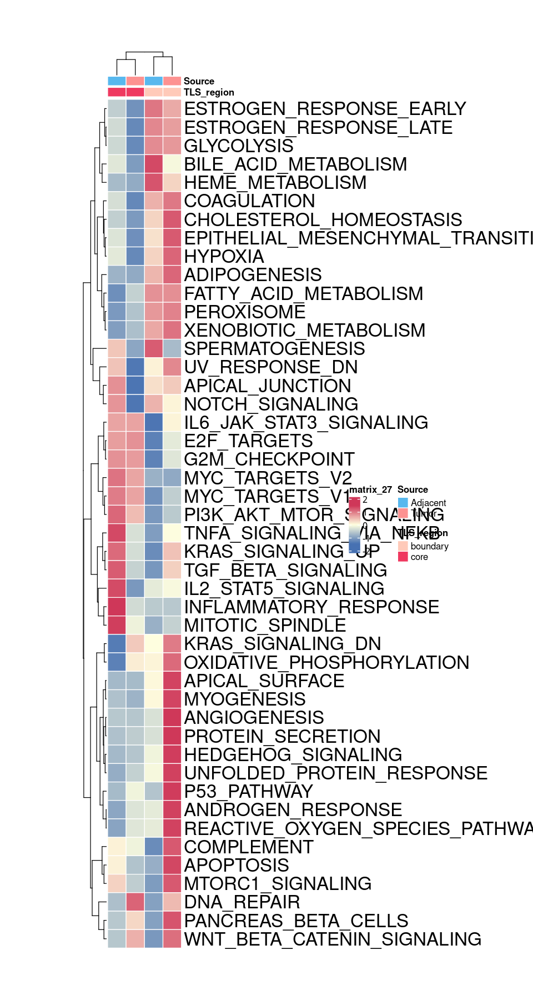

In [780]:
gsva_results = cbind(gsva_results_st_3, gsva_results_st_4)

tmp_meta_st_3 = st3_obj@meta.data[st3_obj@meta.data$TLS_region %in% c('TLS boundary','TLS core'), c('orig.ident','TLS_region')]
tmp_meta_st_3$Source = 'Tumor'
rownames(tmp_meta_st_3) = paste0('st_3@',rownames(tmp_meta_st_3))
tmp_meta_st_4 = st4_obj@meta.data[st4_obj@meta.data$TLS_region %in% c('TLS boundary','TLS core'), c('orig.ident','TLS_region')]
tmp_meta_st_4$Source = 'Adjacent'
rownames(tmp_meta_st_4) = paste0('st_4@',rownames(tmp_meta_st_4))

anno_col = data.frame(TLS_region=c(tmp_meta_st_3$TLS_region, tmp_meta_st_4$TLS_region),
                      Source=c(tmp_meta_st_3$Source, tmp_meta_st_4$Source))
rownames(anno_col) = c(rownames(tmp_meta_st_3), rownames(tmp_meta_st_4))

tmp_gsva = gsva_results[(apply(gsva_results, FUN=max, MARGIN=1) > 0),]
anno_col$cluster = paste0(anno_col$Source, anno_col$TLS_region)
anno_col = anno_col[colnames(tmp_gsva),]

plot_df = list()
for (tmp_ct in levels(as.factor(anno_col$cluster))){
    tmp_df = tmp_gsva[,anno_col$cluster == tmp_ct]
    tmp_df = apply(tmp_df, FUN=mean, MARGIN=1)
    
    plot_df[[tmp_ct]] = tmp_df
}

plot_df = as.data.frame(plot_df)
tmp_anno_col = data.frame(TLS_region=c('boundary','core','boundary','core'),
                      Source=c('Adjacent','Adjacent','Tumor','Tumor'))
rownames(tmp_anno_col) = c('AdjacentTLS.boundary','AdjacentTLS.core','TumorTLS.boundary','TumorTLS.core')
rownames(plot_df) = gsub('HALLMARK_','',rownames(plot_df))

ann_colors = list(
  Source = c(Adjacent="#58b8ee", Tumor="#fd9291"),
    TLS_region = c(boundary='#ffcab9', core='#ef3960')
)

pdf(file = './Fig_pdf/Fig6c.pdf', width=8, height=15)
options(repr.plot.width=8, repr.plot.height=15)
p = pheatmap(plot_df, color=colorRampPalette(rev(c('#cf3759', '#ffffe0','#4771b2')))(350),
         annotation_col= tmp_anno_col, annotation_colors=ann_colors,
         border_color='white',
         treeheight_row=25,
             treeheight_col=25,
        show_colnames=F,
        cellwidth=20,cellheight=20,fontsize=20, fontsize_row=20, cluster_col=T, cluster_row=T, scale='row')
p
dev.off()
p

Warning message:
“The input is a data frame, convert it to the matrix.”


png 
  2

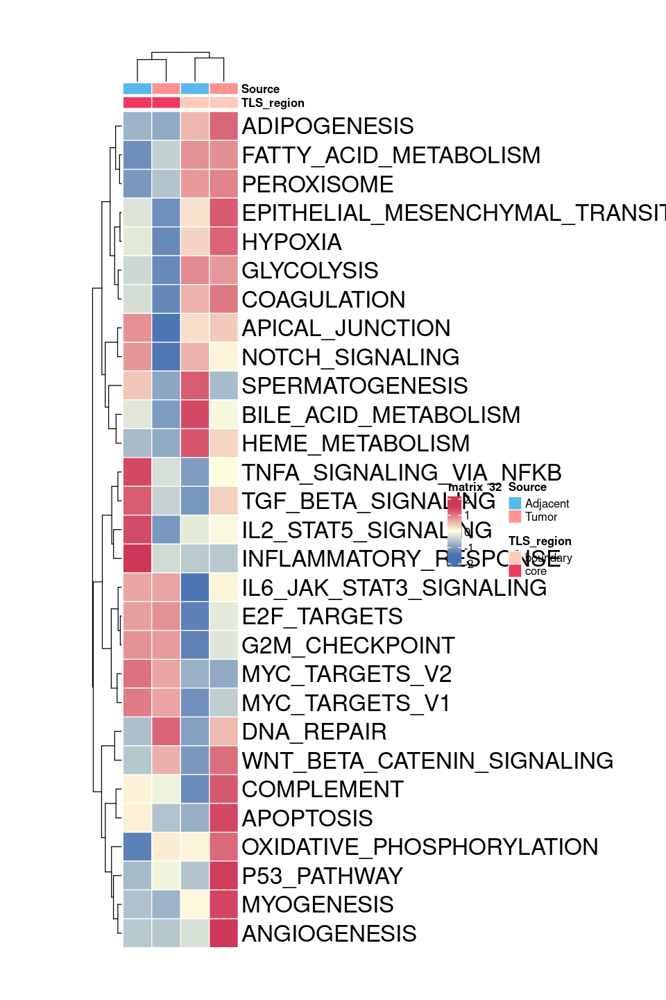

In [787]:
select_terms = c('GLYCOLYSIS','BILE_ACID_METABOLISM','HEME_METABOLISM','COAGULATION','EPITHELIAL_MESENCHYMAL_TRANSITION','HYPOXIA','ADIPOGENESIS','FATTY_ACID_METABOLISM',
                'PEROXISOME','SPERMATOGENESIS','APICAL_JUNCTION','NOTCH_SIGNALING','IL6_JAK_STAT3_SIGNALING','E2F_TARGETS','G2M_CHECKPOINT','MYC_TARGETS_V2','MYC_TARGETS_V1',
                'TNFA_SIGNALING_VIA_NFKB','TGF_BETA_SIGNALING','IL2_STAT5_SIGNALING','INFLAMMATORY_RESPONSE','OXIDATIVE_PHOSPHORYLATION','MYOGENESIS','ANGIOGENESIS',
                'P53_PATHWAY','COMPLEMENT','APOPTOSIS','DNA_REPAIR','WNT_BETA_CATENIN_SIGNALING')
pdf(file = './Fig_pdf/Fig6c.pdf', width=8, height=12)
options(repr.plot.width=8, repr.plot.height=12)
p = pheatmap(plot_df[select_terms,], color=colorRampPalette(rev(c('#cf3759', '#ffffe0','#4771b2')))(350),
         annotation_col= tmp_anno_col, annotation_colors=ann_colors,
         border_color='white',
         treeheight_row=25,
             treeheight_col=25,
        show_colnames=F,
        cellwidth=25,cellheight=25,fontsize=20, fontsize_row=20, cluster_col=T, cluster_row=T, scale='row')
p
dev.off()
p

## Fig 6d

In [5]:
cellchat = get(load('./ST/TLS_cellchat/cellchat_merged.RData'))

png 
  2

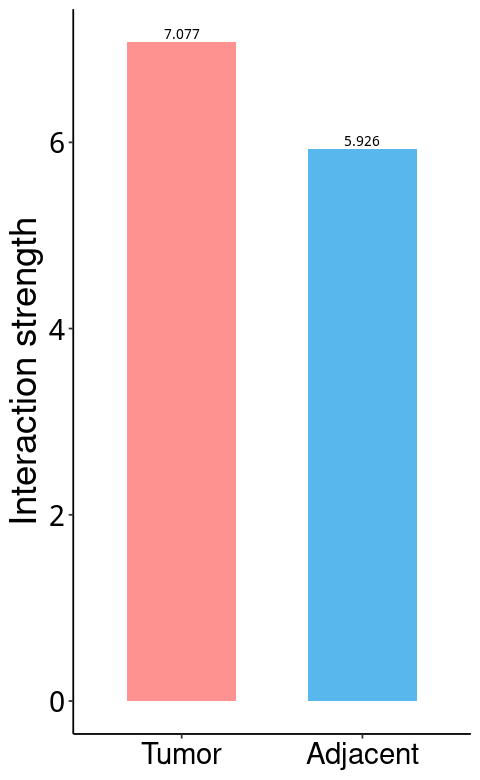

In [799]:
pdf(file = './Fig_pdf/Fig6d.pdf', width=4, height=6.5)
options(repr.plot.width=4, repr.plot.height=6.5)
p = compareInteractions(cellchat, color.use=c("#fd9291","#58b8ee"), 
                        show.legend = F, group = c(1,2), measure = "weight") + theme(text=element_text(size=22))
p
dev.off()
p

## Fig 6e

Do heatmap based on a merged object 




png 
  2

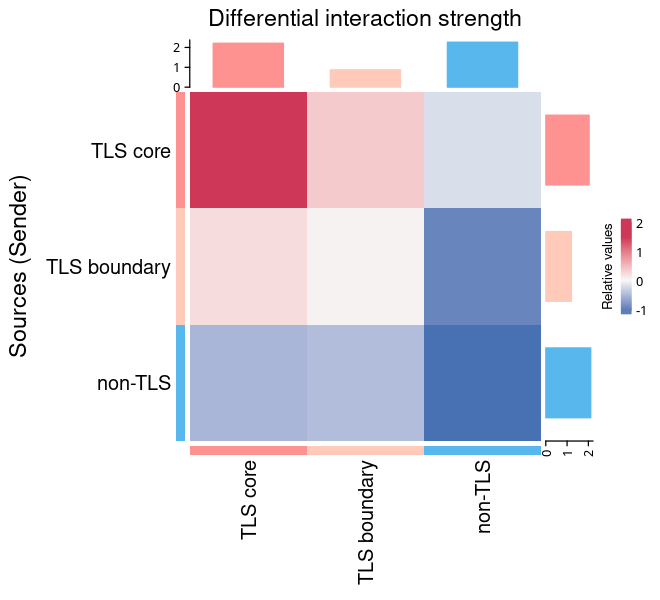

In [824]:
pdf(file = './Fig_pdf/Fig6e.pdf', width=5.5, height=5)
options(repr.plot.width=5.5, repr.plot.height=5)
p = netVisual_heatmap(cellchat, measure = "weight",
                      color.use=c('#fd9291','#ffcab9','#58b8ee'),
                      color.heatmap=c('#4771b2','#cf3759'),
                  width=12, height=1,
                  font.size=12, font.size.title=14
                 ) 
p
dev.off()
p

## Fig 6f

Comparing communications on a merged object 


Warning message:
“Vectorized input to `element_text()` is not officially supported.
ℹ Results may be unexpected or may change in future versions of ggplot2.”


png 
  2

Comparing communications on a merged object 


Warning message:
“Vectorized input to `element_text()` is not officially supported.
ℹ Results may be unexpected or may change in future versions of ggplot2.”


png 
  2

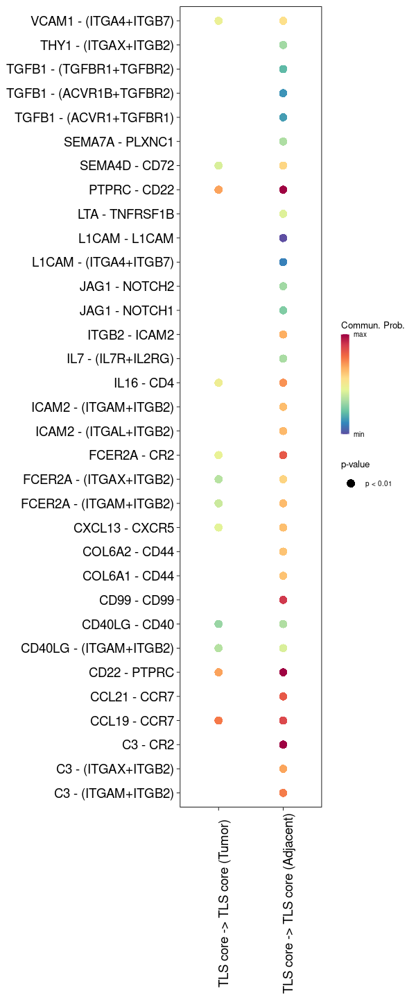

In [28]:
pdf(file = './Fig_pdf/Fig6f_up.pdf', width=5, height=12)
options(repr.plot.width=5, repr.plot.height=12)
gg1 <- netVisual_bubble(cellchat, sources.use = c('TLS core'), targets.use = c('TLS core'), comparison = c(1, 2), max.dataset = 1, title.name = "Increased signaling in Tumor", angle.x = 45, remove.isolate = T,
                        thresh=0.001,
                        font.size=14, font.size.title=14, return.data=T
                       )
gg1$gg.obj
dev.off()


pdf(file = './Fig_pdf/Fig6f_down.pdf', width=5, height=12)
options(repr.plot.width=5, repr.plot.height=12)
#> Comparing communications on a merged object
# select_ccis = data.frame({'interaction_name'=c('VCAM1 − (ITGA4+ITGB7)', 'THY1 − (ITGAX+ITGB2)', 'TGFB1 − (TGFBR1+TGFBR2)', 'TGFB1 − (ACVR1B+TGFBR2)', 'TGFB1 − (ACVR1+TGFBR1)',
#                                      'SEMA7A − PLXNC1', 'SEMA4D − CD72', 'PTPRC − CD22', 'LTA − TNFRSF1B', 'L1CAM − L1CAM', 'L1CAM − (ITGA4+ITGB7)', 'JAG1 − NOTCH2',
#                                      'JAG1 − NOTCH1', 'ITGB2 − ICAM2', 'IL7 − (IL7R+IL2RG)', 'IL16 − CD4', 'ICAM2 − (ITGAM+ITGB2)', 'ICAM2 − (ITGAL+ITGB2)',
#                                     'FCER2A − CR2', 'FCER2A − (ITGAX+ITGB2)', 'FCER2A − (ITGAM+ITGB2)', 'CXCL13 − CXCR5', 'COL6A2 − CD44', 'COL6A1 − CD44', 'CD99 − CD99',
#                                      'CD40LG − CD40', 'CD40LG − (ITGAM+ITGB2)', 'CD22 − PTPRC', 'CCL21 − CCR7', 'CCL19 − CCR7', 'C3 − CR2', 'C3 − (ITGAX+ITGB2)', 'C3 − (ITGAM+ITGB2)')})
gg2 <- netVisual_bubble(cellchat, sources.use = c('TLS core'), targets.use = c('TLS core'),  comparison = c(1, 2), max.dataset = 2, title.name = "Decreased signaling in Tumor", angle.x = 45, remove.isolate = T,
                        thresh=0.001,
                        font.size=14, font.size.title=14, return.data=T
                       )
#> Comparing communications on a merged object
gg2$gg.obj


font.size = 14
font.size.title = 14
select_ccis = c('VCAM1 - (ITGA4+ITGB7)', 'THY1 - (ITGAX+ITGB2)', 'TGFB1 - (TGFBR1+TGFBR2)', 'TGFB1 - (ACVR1B+TGFBR2)', 'TGFB1 - (ACVR1+TGFBR1)',
                                     'SEMA7A - PLXNC1', 'SEMA4D - CD72', 'PTPRC - CD22', 'LTA - TNFRSF1B', 'L1CAM - L1CAM', 'L1CAM - (ITGA4+ITGB7)', 'JAG1 - NOTCH2',
                                     'JAG1 - NOTCH1', 'ITGB2 - ICAM2', 'IL7 - (IL7R+IL2RG)', 'IL16 - CD4', 'ICAM2 - (ITGAM+ITGB2)', 'ICAM2 - (ITGAL+ITGB2)',
                                    'FCER2A - CR2', 'FCER2A - (ITGAX+ITGB2)', 'FCER2A - (ITGAM+ITGB2)', 'CXCL13 - CXCR5', 'COL6A2 - CD44', 'COL6A1 - CD44', 'CD99 - CD99',
                                     'CD40LG - CD40', 'CD40LG - (ITGAM+ITGB2)', 'CD22 - PTPRC', 'CCL21 - CCR7', 'CCL19 - CCR7', 'C3 - CR2', 'C3 - (ITGAX+ITGB2)', 'C3 - (ITGAM+ITGB2)')
prob_df = gg2$gg.obj$data
prob_df = prob_df[prob_df$interaction_name_2 %in% select_ccis,]
g <- ggplot(prob_df, aes(x = source.target, y = interaction_name_2, color = prob, size = pval)) +
  geom_point(pch = 16) +
  theme_linedraw() + theme(panel.grid.major = element_blank()) +
  theme(axis.text.x = element_text(angle = 90),
        axis.title.x = element_blank(),
        axis.title.y = element_blank()) +
  scale_x_discrete(position = "bottom")
# set colors
color.heatmap = "Spectral"
n.colors = 10
color.use <- tryCatch({
  RColorBrewer::brewer.pal(n = n.colors, name = color.heatmap)
}, error = function(e) {
  scales::viridis_pal(option = color.heatmap, direction = -1)(n.colors)
})
color.use <- rev(color.use)
# set legends (pval)
values <- c(1,2,3); names(values) <- c("p > 0.05", "0.01 < p < 0.05","p < 0.01")
g <- g + scale_radius(range = c(min(prob_df$pval), max(prob_df$pval)), breaks = sort(unique(prob_df$pval)),labels = names(values)[values %in% sort(unique(prob_df$pval))], name = "p-value")
# reset colors
if (min(prob_df$prob, na.rm = T) != max(prob_df$prob, na.rm = T)) {
  g <- g + scale_colour_gradientn(colors = colorRampPalette(color.use)(99), na.value = "white", limits=c(quantile(prob_df$prob, 0,na.rm= T), quantile(prob_df$prob, 1,na.rm= T)),
                                  breaks = c(quantile(prob_df$prob, 0,na.rm= T), quantile(prob_df$prob, 1,na.rm= T)), labels = c("min","max")) +
    guides(color = guide_colourbar(barwidth = 0.5, title = "Commun. Prob."))
} else {
  g <- g + scale_colour_gradientn(colors = colorRampPalette(color.use)(99), na.value = "white") +
    guides(color = guide_colourbar(barwidth = 0.5, title = "Commun. Prob."))
}
g <- g + theme(text = element_text(size = font.size),plot.title = element_text(size=font.size.title)) +
  theme(legend.title = element_text(size = 8), legend.text = element_text(size = 6))

pdf(file = './Fig_pdf/Fig6f_down.pdf', width=5, height=12)
options(repr.plot.width=5, repr.plot.height=12)

g
dev.off()
g


In [30]:
max(prob_df$prob)

[1] 0.4993568

In [31]:
min(prob_df$prob)

[1] 0.06760147

In [44]:
packageVersion('Seurat')

[1] ‘4.9.9.9041’

In [54]:
table(Epi_obj@meta.data$assign.level2)


Malignant    Normal 
     9755     11269 

In [53]:
Epi_obj@meta.data$assign.level2[grepl('Malignant',Epi_obj@meta.data$assign.level2)] = 'Malignant'
Epi_obj@meta.data$assign.level2[Epi_obj@meta.data$assign.level2 != 'Malignant'] = 'Normal'

In [55]:
Idents(Epi_obj) = Epi_obj@meta.data$assign.level2

In [58]:
Epi_obj = PrepSCTFindMarkers(Epi_obj)
MN_markers = FindAllMarkers(Epi_obj, recorrect,umi=F)

Found 11 SCT models. Recorrecting SCT counts using minimum median counts: 3638

Calculating cluster Normal

Calculating cluster Malignant



In [ ]:
MN_markers.to

In [62]:
library(writexl)

write_xlsx(MN_markers, "./DEG_AEG_NT.xlsx")

Warning message:
“程辑包‘writexl’是用R版本4.2.3 来建造的”


Warning message:
“One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value...”


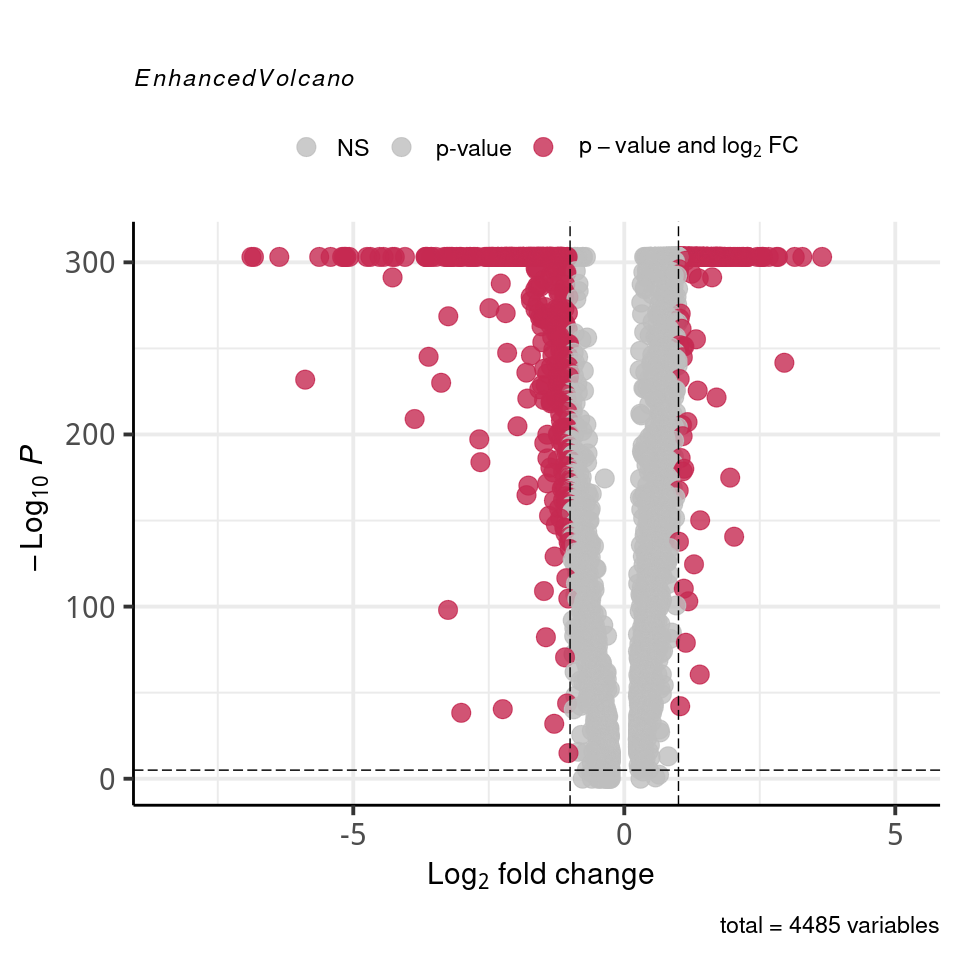

In [86]:
MN_markers$log10_p_adj = -log10(MN_markers$p_val_adj)

options(repr.plot.width=8, repr.plot.height=8)
plot_df = MN_markers[MN_markers$cluster=='Malignant',]
select_gene = plot_df[order(plot_df$p_val_adj, plot_df$avg_log2FC,decreasing=c(F,T)),'gene'][1:10]

EnhancedVolcano(plot_df,
                lab = plot_df$gene,
                selectLab = select_gene,
                title='',
                x = 'avg_log2FC',
                y = 'p_val_adj',
                col=c('gray', 'gray', 'gray', '#c52a52'),
                pointSize = 5,
                labSize = 0,
               # labhjust = -0.1,
               # labvjust = 0.5,
                colAlpha = 0.8)


In [82]:
select_gene

[1] "H19"     "REG1A"   "CXCL5"   "NRCAM"   "APOA1"   "CHRM3"   "TOP2A"  
 [8] "ANPEP"   "CPS1"    "PPP1R1B"

In [89]:
plot_df[order(plot_df$p_val_adj, plot_df$avg_log2FC,decreasing=c(F,T)),][1:10,]

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene,log10_p_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<dbl>
H19.1,0,3.650159,0.297,0.004,0,Malignant,H19,Inf
REG1A.1,0,3.285625,0.314,0.066,0,Malignant,REG1A,Inf
CXCL5,0,3.145148,0.249,0.010,0,Malignant,CXCL5,Inf
NRCAM.1,0,2.835760,0.335,0.020,0,Malignant,NRCAM,Inf
APOA1,0,2.811962,0.137,0.010,0,Malignant,APOA1,Inf
CHRM3.1,0,2.666149,0.493,0.105,0,Malignant,CHRM3,Inf
TOP2A.1,0,2.563568,0.277,0.063,0,Malignant,TOP2A,Inf
ANPEP.1,0,2.553880,0.234,0.028,0,Malignant,ANPEP,Inf
CPS1.1,0,2.540710,0.272,0.036,0,Malignant,CPS1,Inf
